### Software Mention model applied to CORD-19 dataset

In [6]:
import numpy as np
import pandas as pd
import torch
import os
from transformers import BertForTokenClassification, BertTokenizerFast
import json
import time

Load trained model

Instantiate model and tokenizer

In [2]:
trained_model = "/Users/iwilliams/Desktop/Models/bert_out_model/scibert_software_sent"
tokenizer = BertTokenizerFast.from_pretrained(trained_model, do_lower_case=False)
model = BertForTokenClassification.from_pretrained(trained_model)

Preprocessing/ Postprocessing functions

In [4]:
def get_software_ver_labels(data):
    all_sent = []
    all_tokens = []
    all_labels = []
    sentences = data.split(". ")
    for sentence in sentences: 
        sentence = sentence[:512]
        tokenized_sentence = tokenizer.encode(sentence)
        input_ids = torch.tensor([tokenized_sentence])#.cuda()
        with torch.no_grad():
            output = model(input_ids)
        label_indices = np.argmax(output[0].to('cpu').numpy(), axis=2)
        tokens = tokenizer.convert_ids_to_tokens(input_ids.to('cpu').numpy()[0])

        new_tokens, new_labels = [], []
        for token, label_idx in zip(tokens, label_indices[0]):
            if token.startswith("##"):
                new_tokens[-1] = new_tokens[-1] + token[2:]
            else:
                new_labels.append(tag_values[label_idx])
                new_tokens.append(token)
        all_tokens.extend(new_tokens[1:-1])
        all_labels.extend(new_labels[1:-1])
    return list(zip(all_tokens, all_labels))

def collapse(ner_result):
    collapsed_list = []
    current_entity_tokens = []
    current_entity = None
    for token, tag in ner_result:
        if tag == "O" or tag == 'I-<version>' or tag == 'B-<version>':
            continue
        if tag.startswith("B-"):
            if current_entity is not None:
                collapsed_list.append(
                    (" ".join(current_entity_tokens), current_entity))
            current_entity = tag[2:]
            current_entity_tokens = [token]
        elif tag == "I-" + str(current_entity):
            current_entity_tokens.append(str(token))
        else:
            pass
    if current_entity is not None:
        collapsed_list.append(
            (" ".join(current_entity_tokens), current_entity))
    return collapsed_list

Tag values:

In [5]:
tag_values = ['I-version', 'O', 'I-software', 'B-version', 'B-software', 'PAD']

### Import CORD-19 data

Download from: https://ai2-semanticscholar-cord-19.s3-us-west-2.amazonaws.com/historical_releases.html

Date: 2021-02-08

Size: 7.4GB

In [15]:
cord19_data_loc = "./CORD19/"

In [18]:
os.listdir(cord19_data_loc) 

['document_parses',
 '.DS_Store',
 'changelog',
 'metadata.csv',
 'document_parses.tar.gz']

In [19]:
metadata_csv = pd.read_csv(cord19_data_loc+"metadata.csv", low_memory=False)

In [20]:
metadata_csv.shape

(450385, 19)

In [22]:
metadata_csv_subs = metadata_csv[~metadata_csv['pdf_json_files'].isnull()]
metadata_csv_subs['paper_id'] = metadata_csv_subs['pdf_json_files'].apply(lambda x: x.split("/")[-1].split(".")[0])

In [24]:
metadata_csv_subs.shape

(150412, 20)

In [26]:
len(os.listdir(cord19_data_loc+'document_parses/pdf_json'))

159457

In [28]:
all_files = []

for filename in os.listdir(cord19_data_loc+'document_parses/pdf_json'):
    filename = cord19_data_loc+'document_parses/pdf_json/' + filename
    file = json.load(open(filename, 'rb'))
    data_df = pd.DataFrame(file['body_text'])
    data_df = pd.concat([data_df, pd.DataFrame(file['abstract'])])
    data_df['paper_id'] = np.repeat(file['paper_id'], data_df.shape[0])
    all_files.append(data_df)

In [36]:
all_files_pdf_df = pd.concat(all_files)

In [38]:
all_files_pdf_df.shape

(5434172, 5)

In [40]:
# all_files_pdf_df.to_csv("all_files_pdf_df.csv", index = False)

In [44]:
pdfs_preproc = pd.merge(all_files_pdf_df, metadata_csv_subs , on = "paper_id", how = "inner")

In [47]:
pdfs_preproc_covid19 = pdfs_preproc[pdfs_preproc['publish_time']>='2020-01-01']

### Extract mentions of software from all pdfs in "./document_parses/pdf_json"

In [57]:
pdfs_preproc_covid19['text'] = pdfs_preproc_covid19['text'].astype(str)

/Users/iwilliams/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [58]:
pdfs_preproc_covid19_subset = pdfs_preproc_covid19[~pdfs_preproc_covid19['text'].apply(lambda x: "\n\t\t\t\t" in x)]

In [59]:
pdfs_preproc_covid19_subset.shape

(3290715, 25)

In [64]:
pdfs_preproc_covid19_subset.reset_index(inplace=True)

In [65]:
pdfs_preproc_covid19_subset['sent_temp'] = pdfs_preproc_covid19_subset['text'].apply(lambda x: x.split(". "))

In [66]:
pdfs_preproc_covid19_subset_sentences = pdfs_preproc_covid19_subset.explode('sent_temp')

In [67]:
pdfs_preproc_covid19_subset_sentences.shape

(15832279, 28)

In [68]:
list(pdfs_preproc_covid19_subset_sentences.sample(10)['sent_temp'])

['All named authors meet the International Committee of Medical Journal Editors (ICMJE) criteria for authorship for this article, take responsibility for the integrity of the work as a whole, and have given their approval for this version to be published.',
 'Also, while the measure includes zero flows in the calculations, it does not distinguish between links that can potentially exist but do not at the moment (e.g., traders who could sell but do not by chance), and links that will probably never materialise (e.g., traders who never will sell because of other reasons)',
 'Since no data collection occurred on Wednesdays, Saturdays, and Sundays, we grouped them into a non-working day category',
 'Every state and territory recognizes the right of prisoners to have access to medical treatment, but do prisoners have a right to demand release during a pandemic?',
 'This does not necessarily indicate that the antibodies are not functional by another mechanism',
 'Figure 2 provides an overvie

In [69]:
pdfs_preproc_covid19_subset_sentences['len_sent'] = pdfs_preproc_covid19_subset_sentences['sent_temp'].apply(lambda x: len(x))

In [70]:
pdfs_preproc_covid19_subset_sentences['len_sent'].describe()

count    1.583228e+07
mean     1.425226e+02
std      1.515734e+03
min      0.000000e+00
25%      8.400000e+01
50%      1.320000e+02
75%      1.870000e+02
max      6.009556e+06
Name: len_sent, dtype: float64

In [71]:
pdfs_preproc_covid19_subset_sentences_subs = pdfs_preproc_covid19_subset_sentences[(pdfs_preproc_covid19_subset_sentences['len_sent']>60)]

In [72]:
pdfs_preproc_covid19_subset_sentences_subs.shape

(13439572, 29)

In [73]:
pdfs_preproc_covid19_subset_sentences_subs.drop(['level_0', 'index'], axis = 1, inplace = True)

/Users/iwilliams/anaconda3/lib/python3.7/site-packages/pandas/core/frame.py:3997: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,


In [74]:
pdfs_preproc_covid19_subset_sentences_subs.reset_index(inplace = True)

In [75]:
len(pdfs_preproc_covid19_subset_sentences_subs.index)

13439572

In [1]:
# strted at 2:07 Friday
t0 = time.time()
temp_s2 = []
for indx in range(0, len(pdfs_preproc_covid19_subset_sentences_subs.index)):
    if indx%1000 ==0:
        print (indx)
    temp_s2.append([indx, get_software_ver_labels(pdfs_preproc_covid19_subset_sentences_subs.loc[indx, 'sent_temp'])])

In [5]:
# # # # # # # # # # # # # # # # # #
#                                 # 
#    PERFORMANCE:                 #
#    583 sec for 10K sentences    #
#    1100 for 20K                 #
#                                 #
#    PERFORMANCE:                 #
#    100 sec for 3000 sentences   #
#    340 sec for 10K sentences    #
#                                 #
# # # # # # # # # # # # # # # # # #
((13439572/1000)*98)/60/60/24

15.243958981481484

In [77]:
temp_s_df = pd.DataFrame(temp_s2)
# temp_s_df.to_csv("temp_8p2_9p3_end.csv", index = False)

In [78]:
temp_s_df.shape
# prev: (1505571, 2)
# now: (1498173, 2)

(1908, 2)

In [79]:
temp_s_df.head()

,0,1
0,0,"[(a1111111111, O), (a1111111111, O), (a1111111..."
1,1,"[(In, O), (addition, O), (,, O), (significant,..."
2,2,"[(Patchy, O), (lesions, O), (in, O), (lobules,..."
3,3,"[(Ground, O), (-, O), (glass, O), (opacities, ..."
4,4,"[(Rapid, O), (radiologic, O), (progression, O)..."


In [80]:
temp_eval = pd.concat([pdfs_preproc_covid19_subset_sentences_subs[0:temp_s_df.shape[0]] , temp_s_df], axis = 1)

In [82]:
# temp_eval.drop(['level_0',            'index', 0], inplace = True, axis = 1)

In [83]:
temp_eval['software'] = temp_eval[1].apply(lambda x: collapse(x))

In [90]:
list(temp_eval[temp_eval['software'].apply(lambda x: x!=[])]['software'])

[[('SPSS', 'software'), ('20', 'version'), ('.', 'version'), ('0', 'version')],
 [('COVID', 'software')],
 [('COVID', 'software')],
 [('COVID', 'software'), ('-', 'software'), ('19', 'software')],
 [('Raosoft', 'software')],
 [('SurveyMonkey', 'software')],
 [('Statistical Package for the Social Sciences ( SPSS )', 'software'),
  ('20', 'version')],
 [('SPSS', 'software'), ('1', 'version'), ('25', 'version')],
 [('CXNet', 'software')],
 [('CheXNeXt', 'software')],
 [('COVID', 'software')],
 [('COVID', 'software')],
 [('COVID', 'software'), ('-', 'software')],
 [('MATLAB', 'software')],
 [('R', 'software'),
  ('4', 'version'),
  ('.', 'version'),
  ('0', 'version'),
  ('.', 'version'),
  ('2', 'version')],
 [('CoronIT', 'software')],
 [('CoronIT', 'software'), ('HPzone', 'software')],
 [('R', 'software'),
  ('3', 'version'),
  ('.', 'version'),
  ('6', 'version'),
  ('.', 'version'),
  ('0', 'version'),
  ('stats', 'software')],
 [('Infectieradar', 'software')],
 [('CoronIT', 'software'

In [137]:
len(temp_eval['section'].unique())

65095

In [138]:
temp_eval['software_clean'] = temp_eval['software'].apply(lambda x: [i[0] for i in x])

In [129]:
excl_list = ["+","-","scRNA", "Medline","Pubmed", "COVID -", "scRNA - seq", "nCODIV", "scRNAseq", "COVID", "COVID19", "COVID 19", "COVID-19", "COVID - 19" , "SARS", "MERS", "medRxiv", "bioRxiv", "smartphone", "H1N1"]

In [140]:
temp_eval['software_clean'] = temp_eval['software_clean'].apply(lambda x: [i for i in x if i not in excl_list])

In [141]:
temp_eval_outp = temp_eval[['section',          
                            'source_x',            
                            'title',
                            'doi', 
                            'license',         
                            'abstract',     
                            'publish_time', 
                            'journal', 
                            'url',  
                            'sent_temp', 
                            'software_clean']]

In [142]:
temp_eval_outp.shape

(1505571, 11)

In [144]:
temp_eval_outp_software = temp_eval_outp.explode("software_clean")#, ignore_index=True)

In [145]:
temp_eval_outp_software.shape

(1521501, 11)

In [146]:
temp_eval_outp_software.groupby(['source_x'])['source_x'].value_counts().sort_values(ascending = False).head(50)

source_x                             source_x                           
Medline; PMC                         Medline; PMC                           584411
Elsevier; Medline; PMC               Elsevier; Medline; PMC                 273056
PMC                                  PMC                                    260648
MedRxiv; WHO                         MedRxiv; WHO                           146942
ArXiv                                ArXiv                                   95046
Elsevier; PMC                        Elsevier; PMC                           52324
BioRxiv; WHO                         BioRxiv; WHO                            25154
BioRxiv                              BioRxiv                                 20109
MedRxiv; Medline; PMC; WHO           MedRxiv; Medline; PMC; WHO              13283
Medline; PMC; WHO                    Medline; PMC; WHO                       11003
MedRxiv                              MedRxiv                                  9854
BioRxiv; Medli

In [147]:
temp_eval_outp_software[~temp_eval_outp_software['software_clean'].isnull()].groupby(['source_x'])['source_x'].value_counts().sort_values(ascending = False).head(50)

source_x                             source_x                           
Medline; PMC                         Medline; PMC                           19367
PMC                                  PMC                                    17552
Elsevier; Medline; PMC               Elsevier; Medline; PMC                  8836
ArXiv                                ArXiv                                   8530
MedRxiv; WHO                         MedRxiv; WHO                            5282
BioRxiv; WHO                         BioRxiv; WHO                            2648
BioRxiv                              BioRxiv                                 2397
Elsevier; PMC                        Elsevier; PMC                           1656
BioRxiv; Medline; PMC; WHO           BioRxiv; Medline; PMC; WHO               486
MedRxiv; Medline; PMC; WHO           MedRxiv; Medline; PMC; WHO               454
MedRxiv                              MedRxiv                                  422
ArXiv; Medline; PMC      

In [148]:
temp_eval_outp_software.groupby(['journal'])['journal'].value_counts().sort_values(ascending = False).head(10)

journal                            journal                          
bioRxiv                            bioRxiv                              56207
Int J Environ Res Public Health    Int J Environ Res Public Health      27084
PLoS One                           PLoS One                             17478
Int J Mol Sci                      Int J Mol Sci                        13675
medRxiv                            medRxiv                              13589
Computational Science - ICCS 2020  Computational Science - ICCS 2020     9839
Front Immunol                      Front Immunol                         9601
Sci Rep                            Sci Rep                               8595
Viruses                            Viruses                               8047
Crit Care                          Crit Care                             7632
Name: journal, dtype: int64

In [149]:
temp_eval_outp_software[~temp_eval_outp_software['software_clean'].isnull()].groupby(['journal'])['journal'].value_counts().sort_values(ascending = False).head(10)

journal                                                            journal                                                          
bioRxiv                                                            bioRxiv                                                              6113
Computational Science - ICCS 2020                                  Computational Science - ICCS 2020                                    1315
Automated Reasoning                                                Automated Reasoning                                                   974
Advances in Knowledge Discovery and Data Mining                    Advances in Knowledge Discovery and Data Mining                       953
Int J Environ Res Public Health                                    Int J Environ Res Public Health                                       841
PLoS One                                                           PLoS One                                                              738
Viruses              

In [159]:
temp_eval_outp_software[~temp_eval_outp_software['software_clean'].isnull()].sample(5)

,section,source_x,title,doi,license,abstract,publish_time,journal,url,sent_temp,software_clean
1335232,POSTING TIME SHOWED A COORDINATED OPERATION,Medline; PMC,Influencing overseas Chinese by tweets: text-i...,10.1007/s42001-020-00091-8,no-cc,The literature on China’s social media foreign...,2020-11-03,J Comput Soc Sci,https://www.ncbi.nlm.nih.gov/pubmed/33169108/;...,The first two groups tend to use Weibo after 5...,Weibo
820294,INTRODUCTION,ArXiv,User-Centered Programming Language Design: A C...,NaN,arxiv,"Recently, user-centered methods have been prop...",2020-11-15,NaN,https://arxiv.org/pdf/2011.07565v1.pdf,"Thus, our evaluation takes the form of a case ...",PLIERS
1442918,DATA SOURCES AND MEASUREMENTS,Medline; PMC,On the search for environmental sustainability...,10.1007/s11356-020-11432-5,no-cc,Africa remains the most affected by environmen...,2020-11-20,Environ Sci Pollut Res Int,https://www.ncbi.nlm.nih.gov/pubmed/33216296/;...,Government effectiveness GOVT EFF measures the...,GOVT
789326,RESULTS AND DISCUSSION,ArXiv,Explainable COVID-19 Detection Using Chest CT ...,NaN,arxiv,This paper explores how well deep learning mod...,2020-11-09,NaN,https://arxiv.org/pdf/2011.05317v1.pdf,The SqueezeNet model obtains the lowest perfor...,SqueezeNet
158913,HEALTH-RELATED QUALITY OF LIFE QUESTIONNAIRES,Medline; PMC,The Effects of Adding Transcutaneous Spinal Co...,10.3390/jcm9092765,cc-by,Spinal cord stimulation may enable recovery of...,2020-08-26,J Clin Med,https://doi.org/10.3390/jcm9092765; https://ww...,"In the NON-STIM participants, one participant ...",STIM


In [151]:
temp_eval_outp_software.groupby(['software_clean'])['software_clean'].value_counts().sort_values(ascending = False).head(50)

software_clean   software_clean 
R                R                  882
Google           Google             735
SPSS             SPSS               647
Twitter          Twitter            430
GISAID           GISAID             329
Excel            Excel              323
Zoom             Zoom               276
Covid            Covid              247
GraphPad Prism   GraphPad Prism     240
Python           Python             225
Facebook         Facebook           223
Scopus           Scopus             211
Stata            Stata              193
WhatsApp         WhatsApp           185
YouTube          YouTube            176
SAS              SAS                166
WeChat           WeChat             160
Google Scholar   Google Scholar     151
Mossad           Mossad             151
Instagram        Instagram          150
MATLAB           MATLAB             143
Android          Android            139
BLAST            BLAST              138
GraphPad         GraphPad           133
STATA  

In [2]:
temp_eval_outp_software = pd.read_csv("/Users/iwilliams/Desktop/software_data_to_link_1p5M.csv")#, index = False)

In [3]:
# temp_eval_outp_software.groupby(['software_clean'])['software_clean'].value_counts().sort_values(ascending = False).tail(50)

### Extract links

In [4]:
len(temp_eval_outp_software['doi'].unique())

12689

In [5]:
temp_eval_outp_software.columns

Index(['section', 'source_x', 'title', 'doi', 'license', 'abstract',
       'publish_time', 'journal', 'url', 'sent_temp', 'software_clean'],
      dtype='object')

In [6]:
temp_eval_outp_software.sample(10)

,section,source_x,title,doi,license,abstract,publish_time,journal,url,sent_temp,software_clean
1282122,URBAN SOLUTIONS BY PAYMENT GIANTS,Elsevier; PMC,The Forceful Reevaluation of Cash-Based Transa...,10.1016/b978-0-12-824313-8.00008-5,no-cc,Cash-based transactions have been losing in po...,2020-07-24,Surveying the Covid-19 Pandemic and its Implic...,https://www.sciencedirect.com/science/article/...,It also shows that competition in this industr...,NaN
171954,INTRODUCTION,Medline; PMC,Human flourishing and religious liberty: Evide...,10.1371/journal.pone.0239983,cc0,This paper studies the spatial and time series...,2020-10-01,PLoS One,https://www.ncbi.nlm.nih.gov/pubmed/33002055/;...,The primary contribution of this paper is to e...,NaN
620,ABSTRACT,Medline; PMC,The investigation of multiresolution approache...,10.1007/s13755-020-00116-6,no-cc,"COVID-19 is a novel virus, which has a fast sp...",2020-09-29,Health Inf Sci Syst,https://www.ncbi.nlm.nih.gov/pubmed/33014355/;...,"COVID-19 is a novel virus, which has a fast sp...",NaN
1511853,INTRODUCTION,Elsevier; Medline; PMC,Effects of COVID-19 on Business and Research,10.1016/j.jbusres.2020.06.008,els-covid,Abstract The COVID-19 outbreak is a sharp remi...,2020-06-09,J Bus Res,https://www.ncbi.nlm.nih.gov/pubmed/32536736/;...,"Many markets, especially in the fields of tour...",NaN
116482,PLOS ONE,Medline; PMC,Most frequent South Asian haplotypes of ACE2 s...,10.1371/journal.pone.0238255,cc-by,It was shown that the human Angiotensin-conver...,2020-09-16,PLoS One,https://doi.org/10.1371/journal.pone.0238255; ...,This does not alter our adherence to PLOS ONE ...,NaN
619810,INTRODUCTION,Elsevier; Medline; PMC,Enhancing hospitality business performance: Th...,10.1016/j.ijhm.2020.102605,no-cc,"Utilizing a sample of 192 hospitality firms, t...",2020-07-15,Int J Hosp Manag,https://www.ncbi.nlm.nih.gov/pubmed/32834350/;...,In response hospitality firms have learnt to e...,NaN
1051797,ACCEPTED ARTICLE,Medline; PMC,Focus on kidney disease among the coronavirus ...,10.1111/ijcp.13561,no-cc,Coronavirus disease 2019 (COVID‐19) has rapidl...,2020-05-27,Int J Clin Pract,https://www.ncbi.nlm.nih.gov/pubmed/32460395/;...,11 The age-standardized death rate of chronic ...,NaN
752296,PEP AND LVET ESTIMATION,Medline; PMC,Wearable Cardiorespiratory Monitoring Employin...,10.3390/s20072033,cc-by,Cardiovascular diseases are the main cause of ...,2020-04-04,Sensors (Basel),https://doi.org/10.3390/s20072033; https://www...,The LVET was estimated with an ME of −3.6 ms a...,NaN
1150311,THE OBSTACLE COURSE OF REPERFUSION FOR ST-SEGM...,PMC,The Obstacle Course of Reperfusion for ST-Segm...,10.1161/circulationaha.120.047523,no-cc,NaN,2020-04-21,Circulation,https://www.ncbi.nlm.nih.gov/pmc/articles/PMC7...,Key Words: COVID-19 ◼ emergency medical servic...,NaN
367734,SECRETOME DIRECTIONALITY AND HOMEOSTATIC PROCE...,Medline; PMC,The Secretome Profiling of a Pediatric Airway ...,10.1074/mcp.ra119.001546,cc-by,The respiratory epithelium comprises polarized...,2020-02-19,Mol Cell Proteomics,https://doi.org/10.1074/mcp.ra119.001546; http...,The apical secretome was signif-icantly associ...,NaN


In [7]:
temp_eval_outp_software[~temp_eval_outp_software['software_clean'].isnull()].groupby(['license'])['license'].value_counts().sort_values(ascending = False).head(10)

license      license    
no-cc        no-cc          26470
cc-by        cc-by          16821
arxiv        arxiv           8570
medrxiv      medrxiv         5908
biorxiv      biorxiv         5413
els-covid    els-covid       3393
cc-by-nc     cc-by-nc        1170
cc-by-nc-nd  cc-by-nc-nd     1142
cc-by-nd     cc-by-nd         200
cc0          cc0              114
Name: license, dtype: int64

In [8]:
temp_eval_outp_software[~temp_eval_outp_software['software_clean'].isnull()].shape

(69290, 11)

In [9]:
temp_eval_outp_software[~temp_eval_outp_software['software_clean'].isnull()].groupby(['section'])['section'].value_counts().sort_values(ascending = False).head(10)

section                                   section                                 
INTRODUCTION                              INTRODUCTION                                3553
ABSTRACT                                  ABSTRACT                                    2970
DISCUSSION                                DISCUSSION                                  2440
STATISTICAL ANALYSIS                      STATISTICAL ANALYSIS                        1302
RESULTS                                   RESULTS                                     1110
METHODS                                   METHODS                                     1064
(WHICH WAS NOT CERTIFIED BY PEER REVIEW)  (WHICH WAS NOT CERTIFIED BY PEER REVIEW)     923
CONCLUSION                                CONCLUSION                                   780
RELATED WORK                              RELATED WORK                                 708
MATERIALS AND METHODS                     MATERIALS AND METHODS                        703
Name: s

In [10]:
temp_eval_outp_software[(~temp_eval_outp_software['software_clean'].isnull()) & (temp_eval_outp_software['section']=='INTRODUCTION')].sample(10)

,section,source_x,title,doi,license,abstract,publish_time,journal,url,sent_temp,software_clean
354091,INTRODUCTION,BioRxiv,Novel NGS Pipeline for Virus Discovery from a ...,10.1101/2020.05.07.082107,biorxiv,The study of the microbiome data holds great p...,2020-05-08,bioRxiv,https://doi.org/10.1101/2020.05.07.082107,"Furthermore, SANSparallel is approximately 100...",blastp
817690,INTRODUCTION,BioRxiv,From amazing work to I beg to differ - analysi...,10.1101/2020.10.14.340083,biorxiv,While early commenting on studies is seen as o...,2020-10-15,bioRxiv,https://doi.org/10.1101/2020.10.14.340083,Once almost exclusively limited to the fields ...,SSRN
1350335,INTRODUCTION,PMC,Prolog Technology Reinforcement Learning Prove...,10.1007/978-3-030-51054-1_33,no-cc,We present a reinforcement learning toolkit fo...,2020-06-06,Automated Reasoning,https://www.ncbi.nlm.nih.gov/pmc/articles/PMC7...,Policy and value models are trained in rlCoP u...,rlCoP
480167,INTRODUCTION,ArXiv,Network-Based Prediction of the 2019-nCoV Epid...,NaN,arxiv,"At the moment of writing (12 February, 2020), ...",2020-02-11,NaN,https://arxiv.org/pdf/2002.04482v2.pdf,[13] used the Tencent database to predict the ...,Tencent
89745,INTRODUCTION,PMC,Formal Analysis and Redesign of a Neural Netwo...,10.1007/978-3-030-53288-8_6,cc-by,We demonstrate a unified approach to rigorous ...,2020-06-13,Computer Aided Verification,https://www.ncbi.nlm.nih.gov/pmc/articles/PMC7...,"First, we interface the toolkit to the X-Plane...",X - Plane
593131,INTRODUCTION,Medline; PMC,CovidSens: a vision on reliable social sensing...,10.1007/s10462-020-09852-3,no-cc,With the spiraling pandemic of the Coronavirus...,2020-06-12,Artif Intell Rev,https://www.ncbi.nlm.nih.gov/pubmed/32836651/;...,While the CovidSens vision promises opportunit...,CovidSens
1092133,INTRODUCTION,PMC,Attention-Based Graph Evolution,10.1007/978-3-030-47426-3_34,no-cc,Based on the recent success of deep generative...,2020-04-17,Advances in Knowledge Discovery and Data Mining,https://www.ncbi.nlm.nih.gov/pmc/articles/PMC7...,AGE can be used to model not only graph evolut...,AGE
628765,INTRODUCTION,BioRxiv; WHO,VERSO: a comprehensive framework for the infer...,10.1101/2020.04.22.044404,biorxiv,A global cross-discipline effort is ongoing to...,2020-10-19,bioRxiv,https://doi.org/10.1101/2020.04.22.044404,VERSO is released as free open source tool at ...,VERSO - DISCo
1103932,INTRODUCTION,Elsevier; Medline; PMC,Stockpiling as resilience: Defending and conte...,10.1016/j.appet.2020.104981,no-cc,During the U.K.‘s lockdown in response to the ...,2020-10-07,Appetite,https://www.sciencedirect.com/science/article/...,Delivery services (such as Deliveroo and JustE...,JustEat
5603,INTRODUCTION,PMC,Integrating Topological Proofs with Model Chec...,10.1007/978-3-030-45234-6_3,cc-by,"System development is not a linear, one-shot p...",2020-03-13,Fundamental Approaches to Software Engineering,https://www.ncbi.nlm.nih.gov/pmc/articles/PMC7...,TOrPEDO is based on the novel notion of topolo...,TOrPEDO


In [11]:
temp_eval_outp_software[(~temp_eval_outp_software['software_clean'].isnull()) & (temp_eval_outp_software['section']=='ABSTRACT')].sample(5)

,section,source_x,title,doi,license,abstract,publish_time,journal,url,sent_temp,software_clean
1404244,ABSTRACT,Elsevier; Medline; PMC,Comparative evaluation of nasopharyngeal swab ...,10.1016/j.jiac.2020.09.027,els-covid,Considering the issues of shortage of medical ...,2020-09-30,J Infect Chemother,https://www.sciencedirect.com/science/article/...,the BD MAX open system using primers and probe...,BD
911149,ABSTRACT,MedRxiv; WHO,YouTube as an information source during the Co...,10.1101/2020.05.06.20093468,medrxiv,Bakcground: YouTube is an important online sou...,2020-05-11,NaN,https://doi.org/10.1101/2020.05.06.20093468; h...,"In this study, contents of the most frequently...",MICI
1512401,ABSTRACT,Medline; PMC,Effects of respiratory rehabilitation on patie...,10.1136/bmjopen-2020-039771,no-cc,INTRODUCTION: The recent viral pneumonia cause...,2020-07-13,BMJ Open,https://www.ncbi.nlm.nih.gov/pubmed/32665352/;...,Review Manager 5.3 37 software (Cochrane Colla...,Review Manager
645855,ABSTRACT,PMC,Enabling Hardware Affinity in JVM-Based Applic...,10.1007/978-3-030-50371-0_3,no-cc,Java has been the backbone of Big Data process...,2020-05-26,Computational Science - ICCS 2020,https://www.ncbi.nlm.nih.gov/pmc/articles/PMC7...,"In fact, most popular Big Data frameworks such...",Spark
1028575,ABSTRACT,MedRxiv; WHO,Liver injury is associated with severe Coronav...,10.1101/2020.04.09.20056242,medrxiv,Aim: The Coronavirus disease 2019 (COVID-19) o...,2020-04-11,NaN,https://doi.org/10.1101/2020.04.09.20056242,"Methods: Online databases including PubMed, Sc...",Scopus


In [12]:
temp_eval_outp_software[(~temp_eval_outp_software['software_clean'].isnull()) & (temp_eval_outp_software['section']=='DISCUSSION')].sample(10)


,section,source_x,title,doi,license,abstract,publish_time,journal,url,sent_temp,software_clean
815180,DISCUSSION,Medline; PMC,Mapping the Scientific Research on Healthcare ...,10.3390/ijerph17082625,cc-by,"In the last few years, the occupational health...",2020-04-11,Int J Environ Res Public Health,https://doi.org/10.3390/ijerph17082625; https:...,We used a bibliometric Science Mapping tool to...,Science Mapping
745588,DISCUSSION,ArXiv,QReLU and m-QReLU: Two novel quantum activatio...,NaN,arxiv,The ReLU activation function (AF) has been ext...,2020-10-15,NaN,https://arxiv.org/pdf/2010.08031v1.pdf,"Second, by improving both generalisation and c...",QReLU
36253,DISCUSSION,PMC,Deep learning methods improve linear B-cell ep...,10.1186/s13040-020-00211-0,cc-by,BACKGROUND: B-cell epitopes play important rol...,2020-04-17,BioData Min,https://www.ncbi.nlm.nih.gov/pmc/articles/PMC7...,"Finally, we couldn't access Besysb [15] , LEPs...",BEST
1320229,DISCUSSION,PMC,MeshingNet: A New Mesh Generation Method Based...,10.1007/978-3-030-50420-5_14,no-cc,We introduce a novel approach to automatic uns...,2020-05-22,Computational Science - ICCS 2020,https://www.ncbi.nlm.nih.gov/pmc/articles/PMC7...,The meshes generated via MeshingNet may be use...,MeshingNet
911295,DISCUSSION,Medline; PMC; WHO,Clinical trials for the prevention and treatme...,10.5694/mja2.50673,no-cc,Since coronavirus disease 2019 (COVID‐19) emer...,2020-06-27,Med J Aust,https://www.ncbi.nlm.nih.gov/pubmed/32594562/;...,Ongoing key trials described here to which Aus...,ASCOT
566202,DISCUSSION,Medline; PMC,Predicting SARS-CoV-2 Infection Trend Using Te...,10.1017/dmp.2020.254,cc-by,OBJECTIVES: Coronavirus disease 2019 (COVID-19...,2020-07-17,Disaster medicine and public health preparedness,https://doi.org/10.1017/dmp.2020.254; https://...,We found that combined SMAs and MACD were capa...,MACD
1354070,DISCUSSION,PMC,Precipitous Fall in Common Respiratory Viral I...,10.1093/ofid/ofaa511,cc-by-nc-nd,"In the midst of the COVID-19 pandemic, we were...",2020-10-23,Open Forum Infect Dis,https://www.ncbi.nlm.nih.gov/pmc/articles/PMC7...,"However, Biofire® testing (which includes infl...",Biofire®
1183499,DISCUSSION,MedRxiv; WHO,Geospatially Referenced Demographic Agent-Base...,10.1101/2020.05.03.20089235,medrxiv,Re-opening societies and economies across the ...,2020-05-06,NaN,http://medrxiv.org/cgi/content/short/2020.05.0...,The presented GERDA-1 model is -to the best of...,GERDA 1
218455,DISCUSSION,Medline; PMC,Quantitative proteomic analysis of the tizoxan...,10.1038/s41598-020-71634-2,cc-by,Nitazoxanide (NTZ) is effective against helmin...,2020-09-07,Sci Rep,https://doi.org/10.1038/s41598-020-71634-2; ht...,The data acquisition of MS (scan range of m/z ...,Orbitrap
588260,DISCUSSION,Elsevier; Medline; PMC,The COVID-19 Drug and Gene Set Library,10.1016/j.patter.2020.100090,els-covid,[Figure: see text],2020-07-25,Patterns (N Y),https://doi.org/10.1016/j.patter.2020.100090; ...,These predictions were based on five strategie...,ARCHS4


In [17]:
### embed sentences cluster color by have code doesnt have code
temp_eval_outp_software[~temp_eval_outp_software['title'].isnull()].shape

(1521470, 11)

In [18]:
len(temp_eval_outp_software['title'].unique())

13139

In [14]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.neighbors import NearestNeighbors
from sklearn.preprocessing import StandardScaler
vectorizer = TfidfVectorizer()
from sklearn.decomposition import PCA
from MulticoreTSNE import MulticoreTSNE as TSNE
import hdbscan

In [45]:
temp_eval_outp_software  = temp_eval_outp_software[~temp_eval_outp_software['title'].isnull()]

In [46]:
temp_eval_outp_software.reset_index(inplace = True)

In [47]:
sent_vec = vectorizer.fit_transform(list(temp_eval_outp_software['journal'].unique())).toarray()

In [48]:
# vectorizer.transform([list(temp_eval_outp_software['sent_temp'])[0]]).toarray()==1

In [49]:
sent_vec.shape

(2978, 2102)

In [50]:
pca = PCA(n_components=200)
pca_result = pca.fit_transform(sent_vec)

In [73]:
tsne = TSNE(n_components=2, perplexity=5, n_iter=1000)
tsne_pca_results = tsne.fit_transform(pca_result)

In [74]:
df_tsne = pd.DataFrame(tsne_pca_results)
df_tsne.columns = ['x-tsne', 'y-tsne']

In [75]:
clusterer = hdbscan.HDBSCAN( min_cluster_size=5, allow_single_cluster=True, gen_min_span_tree=True)#, cluster_selection_method='leaf')
clusterer.fit(df_tsne[['x-tsne', 'y-tsne']]);

df_tsne['hdbscan_clusters'] = clusterer.labels_

df_tsne.reset_index(inplace=True)

In [76]:
df_tsne.drop(['index'], axis = 1, inplace = True)

In [77]:
len(pd.unique(clusterer.labels_))

198

In [78]:
title_tsne = pd.concat([pd.DataFrame(temp_eval_outp_software['journal'].unique()), df_tsne], axis = 1)

In [79]:
title_tsne.head()

,0,x-tsne,y-tsne,hdbscan_clusters
0,PLoS Med,11.575653,38.470164,106
1,PLoS One,11.561755,38.378296,106
2,Forensic Science International: Mind and Law,30.838054,-53.563407,7
3,medRxiv,3.731636,-25.554336,186
4,Clin Infect Dis,-33.282571,39.391750,80


In [80]:
title_tsne.columns = ['journal', 'x-tsne', 'y-tsne', 'hdbscan_clusters']

In [81]:
temp_eval_outp_software_new = pd.merge(temp_eval_outp_software, title_tsne, on = "journal", how = "left")

In [82]:
temp_eval_outp_software_new.shape

(1235932, 16)

In [83]:
temp_eval_outp_software_new['journal'] = temp_eval_outp_software_new['journal'].astype(str)

In [87]:
import plotly.express as px
import matplotlib.pyplot as plt
# plt.figure(figsize=(20,20))
data_topics_subs = temp_eval_outp_software_new[(~temp_eval_outp_software_new['software_clean'].isnull())]#& (paper_to_code_links_c['framework']!='none')]

# data_topics_subs.sort_values(by = 'hdbscan_clusters', inplace = True)

fig = px.scatter(data_topics_subs, 
                 title = "COVID19 software",
#                  size = np.repeat(2,data_topics_subs.shape[0]),
                 x="x-tsne", y="y-tsne",
                 width=1000, 
#                  color = "software_clean",
                 height=1000, 
                 hover_data=['journal', 'software_clean']
#                  ,
#                  hover_text=["title"]
                )
fig.update_layout(legend_title='<b> Cluster </b>')
fig.show()

In [ ]:
### group by papers, stats summary, break down per cluster

In [91]:
temp_eval_outp_software[~temp_eval_outp_software['software_clean'].isnull()].groupby(['journal', 'software_clean'])['software_clean'].value_counts().sort_values(ascending = False).head(20)

journal                                                            software_clean  software_clean
Rev Ind Organ                                                      Google          Google            133
bioRxiv                                                            GISAID          GISAID            122
Detection of Intrusions and Malware, and Vulnerability Assessment  HAEPG           HAEPG             111
Gigascience                                                        IDseq           IDseq             101
Automated Reasoning                                                Coq             Coq                90
bioRxiv                                                            R               R                  88
Arch Clin Neuropsychol                                             TeleNP          TeleNP             77
OpenMP: Portable Multi-Level Parallelism on Modern Systems         OpenMP          OpenMP             73
bioRxiv                                                       

In [93]:
temp_eval_outp_software.drop(['level_0', 'index'], axis = 1, inplace = True)

In [94]:
temp_eval_outp_software.head()

,section,source_x,title,doi,license,abstract,publish_time,journal,url,sent_temp,software_clean
0,NaN,Medline; PMC,Clinical and epidemiological characteristics o...,10.1371/journal.pmed.1003130,cc-by,"BACKGROUND: As of April 18, 2020, over 2,000,0...",2020-06-16,PLoS Med,https://www.ncbi.nlm.nih.gov/pubmed/32544155/;...,a1111111111 a1111111111 a1111111111 a111111111...,NaN
1,NaN,Medline; PMC,Clinical and epidemiological characteristics o...,10.1371/journal.pmed.1003130,cc-by,"BACKGROUND: As of April 18, 2020, over 2,000,0...",2020-06-16,PLoS Med,https://www.ncbi.nlm.nih.gov/pubmed/32544155/;...,"In addition, significant increases in the leve...",NaN
2,NaN,Medline; PMC,Clinical and epidemiological characteristics o...,10.1371/journal.pmed.1003130,cc-by,"BACKGROUND: As of April 18, 2020, over 2,000,0...",2020-06-16,PLoS Med,https://www.ncbi.nlm.nih.gov/pubmed/32544155/;...,Patchy lesions in lobules were detected by che...,NaN
3,NaN,Medline; PMC,Clinical and epidemiological characteristics o...,10.1371/journal.pmed.1003130,cc-by,"BACKGROUND: As of April 18, 2020, over 2,000,0...",2020-06-16,PLoS Med,https://www.ncbi.nlm.nih.gov/pubmed/32544155/;...,"Ground-glass opacities, which were a typical f...",NaN
4,NaN,Medline; PMC,Clinical and epidemiological characteristics o...,10.1371/journal.pmed.1003130,cc-by,"BACKGROUND: As of April 18, 2020, over 2,000,0...",2020-06-16,PLoS Med,https://www.ncbi.nlm.nih.gov/pubmed/32544155/;...,Rapid radiologic progression and a late-onset ...,NaN


In [128]:
# temp_eval_outp_software_notnull[temp_eval_outp_software_notnull['software_clean'].apply(lambda x: len(x)<3)].sample(20)

In [123]:
temp_eval_outp_software_notnull = temp_eval_outp_software[(~temp_eval_outp_software['software_clean'].isnull())]

In [103]:
software_paper = pd.DataFrame(temp_eval_outp_software_notnull.groupby('title')['software_clean'].apply(list)).reset_index()

In [104]:
software_paper.head()

,title,software_clean
0,"""PANDEMIA COVID-19: Y ahora ¿qué?""",[MIR]
1,"""Sample pooling of RNA extracts to speed up SA...",[Altman]
2,"""Virtual Interdisciplinary COVID-19 Team"": A H...",[WhatsApp]
3,100% peer review in radiation oncology: is it ...,"[Aria, WebEx]"
4,14th International Congress on Early Onset Sco...,"[QdMRI, QdMRI]"


In [105]:
software_paper['num_mentions'] = software_paper['software_clean'].apply(lambda x: len(x))

In [106]:
software_paper['num_mentions_unique'] = software_paper['software_clean'].apply(lambda x: len(np.unique(x)))

In [107]:
software_paper['num_mentions'].describe()

count    6107.000000
mean        8.814803
std        16.253033
min         1.000000
25%         1.000000
50%         3.000000
75%         9.000000
max       261.000000
Name: num_mentions, dtype: float64

In [108]:
software_paper['num_mentions_unique'].describe()

count    6107.00000
mean        4.91960
std         6.57255
min         1.00000
25%         1.00000
50%         3.00000
75%         6.00000
max       103.00000
Name: num_mentions_unique, dtype: float64

In [117]:
software_paper[software_paper['num_mentions_unique']>50]

,title,software_clean,num_mentions,num_mentions_unique,software_clean_unique
12,27th Annual Conference of the International So...,"[eRAPID, eRAPID, eRAPID, National, PROM, ePREM...",115,63,"[Atlas, Atlas ti, BioMeTs, CFIR, CFIR - ERIC, ..."
18,40th International Symposium on Intensive Care...,"[MyotonPRO, Myo - tonPRO, NeuroLight, DXT, R, ...",134,103,"[05, ADVOS, AIRWAYS, ARISCAT, ASPECT - NP, Alt..."
116,A Review of Supervised Classification based on...,"[Scopus, KORA, KORA, KORA 3, Apriori, Apriori,...",261,85,"[+, Apriori, BCEP, Bagging, BoderDiff, C4, CAC..."
1677,Databases and Bioinformatic Tools for Glycobio...,"[KEGG, KEGG, KEGG, DBGET, KEGG, GLYCOSCIENCES ...",170,75,"[AOGP, Byonic TM, CAZy, CAZypedia, CFG, CSDB, ..."
1710,Deep learning applications in pulmonary medica...,"[Google Scholar, PubMed, ArXiv, Google Scholar...",171,84,"[3D DenseNets, AleXnet, AlexNet, ArXiv, CGAN, ..."
2122,Enabling Hardware Affinity in JVM-Based Applic...,"[MapReduce, Google, Apache Hadoop, Hadoop, RDM...",178,53,"[Another Resource Negotiator ( YARN ), Apache,..."
4461,"Rapid, accurate, precise and reproducible liga...","[MMPBSA, MMGBSA, MMPBSA, ESMACS, ESMACS, TIES,...",142,58,"[+, ABFE, ACEMD, AWS, Amazon Web Services ( AW..."
5110,Supercomputer-Based Ensemble Docking Drug Disc...,"[POWER9, GROMACS, T - REMD, AutoDock4, AutoDoc...",108,57,"[AD - GPU, ADADELTA, AutoDock - GPU, AutoDock ..."
5931,Various RNA-binding proteins and their conditi...,"[FANTOM, ENCODE, Regulon, CLIP - seq, DROSHA, ...",78,52,"[AGO2, ARCHS4, Algorithm, Array Express, BNA, ..."


In [116]:
software_paper['software_clean_unique'] = software_paper['software_clean'].apply(lambda x: np.unique(x))

In [132]:
software_paper_explode = software_paper[['title', 'software_clean_unique']].explode('software_clean_unique')

In [136]:
software_paper_explode['count'] = np.ones(software_paper_explode.shape[0])

In [142]:
SP_pivot = pd.pivot_table(software_paper_explode, values='count', index=['software_clean_unique'],
                    columns=['software_clean_unique'], aggfunc=np.sum)

In [143]:
SP_pivot.head()

software_clean_unique,!,! Serving Benchmark ( YCSB,! Tandem,"""",#,',*,* D,* Modal Scout,* NET,...,ÉPI,Ò,Γ - lnf,α,λPRED,μCT,μNMR,π,σUTS,τ - leap
software_clean_unique,,,,,,,,,,,,,,,,,,,,,
!,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
! Serving Benchmark ( YCSB,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
! Tandem,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
"""",NaN,NaN,NaN,2.0,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
#,NaN,NaN,NaN,NaN,4.0,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [144]:
import networkx as nx

In [151]:
G=nx.from_numpy_matrix(SP_pivot.values)

KeyboardInterrupt: 

In [ ]:
G = nx.relabel_nodes(G, dict(enumerate(SP_pivot.columns))) 

In [149]:
# print the adjacency list
for line in nx.generate_adjlist(G):
    print(line)
# write edgelist to grid.edgelist
nx.write_edgelist(G, path="grid.edgelist", delimiter=":")
# read edgelist from grid.edgelist
H = nx.read_edgelist(path="grid.edgelist", delimiter=":")

nx.draw(H)
plt.show()

! !
! Serving Benchmark ( YCSB ! Serving Benchmark ( YCSB
! Tandem ! Tandem
" "
# #
' '
* *
* D * D
* Modal Scout * Modal Scout
* NET * NET
* Power * Power
+ +
+ + + +
+ multiway + multiway
- -
- 19 - 19
- Rank - Rank
. .
. . . .
. io . io
/ /
/ VI scoring / VI scoring
0 0
05 05
1 - D 1 - D
1000 1000
1000 Genomes 1000 Genomes
1000G 1000G
1000minds MCDA 1000minds MCDA
109 109
10X 10X
10X Genomics System 10X Genomics System
10x 10x
10x Genomics 10x Genomics
143 interactive Tree of Life ( iTOL 143 interactive Tree of Life ( iTOL
182 " dismo " package 182 " dismo " package
1EHZ 1EHZ
1KA 1KA
1Point3Acres 1Point3Acres
1Point3Acres Global COVID - 19 Tracker & Interactive Charts 1Point3Acres Global COVID - 19 Tracker & Interactive Charts
1ka . si 1ka . si
2 - OPT 2 - OPT
2BX4 2BX4
2D CPA 2D CPA
2DE 2DE
2DS 2DS
2GTB 2GTB
2LS 2LS
2QCY 2QCY
2SFCA 2SFCA
2SH 2SH
2TP - SQ 2TP - SQ
2WW 2WW
3BL 3BL
3CL 3CL
3CLpro 3CLpro
3D 3D
3D - Doctor 3D - Doctor
3D - RISM 3D - RISM
3D DenseNets 3D DenseNets
3D Inf

Braille Braille
Brain Extraction Tool Brain Extraction Tool
Brain Vision Analyzer Brain Vision Analyzer
BrainCheck BrainCheck
BrainChild BrainChild
BrainLAB BrainLAB
BrainPort BrainPort
BrainSight BrainSight
BrainSphere BrainSphere
BrainVision Analyzer BrainVision Analyzer
BrainVision Recorder BrainVision Recorder
Brainhex Brainhex
Brainly Brainly
Brainsight Brainsight
Braken Braken
Brand24 Brand24
Bravo Bravo
BreSeq BreSeq
Breaking - Cas Breaking - Cas
Breathing Playlist Breathing Playlist
Bremen Aerosol / cloud and Bremen Aerosol / cloud and
Bremen Retrieval ( Bremen Retrieval (
Brescia Brescia
Brexit Brexit
Bridge Bridge
BridgeApp - BridgeApp -
Brief Screener Brief Screener
BrightView BrightView
Brightspace Brightspace
Bring Own Device Bring Own Device
Brms Brms
Bruker APEX3 Bruker APEX3
Bruker AXS Bruker AXS
Bruker Compass DataAnalysis Bruker Compass DataAnalysis
Bst Bst
BuDDy BuDDy
BugBase BugBase
Bugzilla Bugzilla
Build Build
Build Homology Model protocol Build Homology Model pro

DAIDS DAIDS
DAISIE DAISIE
DAISY DAISY
DAISY Accessible Information System DAISY Accessible Information System
DALI DALI
DAMBE DAMBE
DAPSO DAPSO
DAR DAR
DARE DARE
DAS DAS
DASH DASH
DASMO DASMO
DASS DASS
DASS - DASS -
DAU DAU
DAVID DAVID
DAX DAX
DAXR DAXR
DAgger DAgger
DBAS DBAS
DBF DBF
DBGET DBGET
DBL DBL
DBP DBP
DBPL DBPL
DBS DBS
DBSCAN DBSCAN
DBSO DBSO
DBT Coach DBT Coach
DBpedia DBpedia
DBpedia - DBpedia -
DBpedia - Entity DBpedia - Entity
DBpedia - ShareAlike DBpedia - ShareAlike
DBpedia Medical Language System ( UMLS DBpedia Medical Language System ( UMLS
DBpedia Spotlight DBpedia Spotlight
DBpedia Spotlight API DBpedia Spotlight API
DBpia DBpia
DBscan DBscan
DCA DCA
DCAQE DCAQE
DCCM DCCM
DCGAN DCGAN
DCI DCI
DCLeaks DCLeaks
DCMM cos DCMM cos
DCNN DCNN
DCSD DCSD
DDA DDA
DDCNN DDCNN
DDL - TIS DDL - TIS
DDLX - TIS DDLX - TIS
DDM DDM
DDPG DDPG
DDSEP DDSEP
DDX3 DDX3
DDcGAN DDcGAN
DDlag DDlag
DE DE
DEA DEA
DEA Sort DEA Sort
DEAL DEAL
DEAP DEAP
DEARE DEARE
DEBrowser package DEBrowser pack

FSL vecreg FSL vecreg
FSSA FSSA
FST - PSO FST - PSO
FSoOH FSoOH
FTDResp FTDResp
FTMR FTMR
FTMap FTMap
FTOCC FTOCC
FTT FTT
FUBAR FUBAR
FUBAR ( Bayesian AppRoximation FUBAR ( Bayesian AppRoximation
FUBAR AppRoximation FUBAR AppRoximation
FURIN FURIN
FUZE FUZE
FUZZ FUZZ
FVS FVS
FaCT + FaCT +
FabLab FabLab
Face - Time Face - Time
FaceBook FaceBook
FaceTime FaceTime
Facebook Facebook
Facebook Data for Good Facebook Data for Good
Facebook Live Facebook Live
Facebook Messenger Facebook Messenger
Facebook live Facebook live
Facebook messenger chatbot Facebook messenger chatbot
Facetime Facetime
FactDag FactDag
FactoExtra FactoExtra
FactoMineR FactoMineR
Factoshiny Factoshiny
Faecbook Faecbook
FakeNewsNet FakeNewsNet
FanToM5 FanToM5
Fanatic Studio Fanatic Studio
FarmAid FarmAid
FarmerMoni FarmerMoni
Fast Fast
Fast - QC Fast - QC
Fast - RCNN Fast - RCNN
Fast - Track Fast - Track
Fast Length Adjustment of SHort reads ( FLASH ) FLASH Fast Length Adjustment of SHort reads ( FLASH ) FLASH
Fast Loci 

Horovod Horovod
Horus - portfolio Horus - portfolio
Hospital Informative System Hospital Informative System
HostPhinder HostPhinder
HotStarTaq HotStarTaq
Hotseat Hotseat
HsSCOT HsSCOT
HuProtarray HuProtarray
HuRI HuRI
Huayitong Huayitong
Hub and Spoke Hub and Spoke
HuffPost HuffPost
Huffman Huffman
Huggingface Huggingface
Hulu Hulu
Human Splicing Finder Human Splicing Finder
Human map Human map
HumanHT - HumanHT -
HumanHap HumanHap
Humanitas Humanitas
Humanoid Humanoid
Humphrey Humphrey
HwlocBitmap HwlocBitmap
HwlocCPUSet HwlocCPUSet
HwlocNodeSet HwlocNodeSet
HwlocObject HwlocObject
HwlocTopology HwlocTopology
HyPhy HyPhy
HybriDetect HybriDetect
Hybrid Multi - tasking Machine Hybrid Multi - tasking Machine
Hybrid Single Particle Lagrangian Integrated Trajectory Hybrid Single Particle Lagrangian Integrated Trajectory
Hybrid Single Particle Lagrangian Integrated Trajectory ( Hybrid Single Particle Lagrangian Integrated Trajectory (
Hybrid Single Particle Lagrangian Integrated Trajectory 

Lloyds Lloyds
LncPro LncPro
LoFreq LoFreq
Local Geary C Local Geary C
Loco Loco
Lodgepole Lodgepole
Loess Loess
LogReg LogReg
LogXact LogXact
Logistic Logistic
Logistic Regression Logistic Regression
LogisticRegression LogisticRegression
Logitech Logitech
Logo Logo
Logpickr Logpickr
Lola Lola
Lola - Lola -
LolliPlot LolliPlot
Lonely Planet Lonely Planet
Looker Looker
Loom application Loom application
LoopInvGen LoopInvGen
Loopamp Loopamp
Lothian Lothian
Lotuscore Lotuscore
Loupe Loupe
Loupe Browser Loupe Browser
Loupe Cell Browser Loupe Cell Browser
Loupe V ( D ) J Browser Loupe V ( D ) J Browser
Louvain Louvain
Lovehate Lovehate
LowMS LowMS
Lowell Makes Lowell Makes
Lpro Lpro
Ltac Ltac
Lucene Lucene
Ludimoodle Ludimoodle
Lumacaftor Lumacaftor
LuminOre LuminOre
Luminex Luminex
Luminex SYNCT Luminex SYNCT
Luminex UMAP Luminex UMAP
Lumos Lumos
Lumosity NeuroCognitive Test Lumosity NeuroCognitive Test
Luna Luna
Lung Lung
LungQ LungQ
Lupas Lupas
Lustre Lustre
Lyft Lyft
LysMcre LysMcre
Lyso

NLP NLP
NLPExplorer NLPExplorer
NLPIR NLPIR
NLPIR - Parser ( Natural Language Processing and Information Retrieval ) NLPIR - Parser ( Natural Language Processing and Information Retrieval )
NLR NLR
NLStradamus NLStradamus
NLTK NLTK
NLTK ) NLTK )
NMA NMA
NMDC NMDC
NMDP / Be Match NMDP / Be Match
NMDS NMDS
NMDS1 NMDS1
NMDS2 NMDS2
NMF NMF
NMM NMM
NMR - STAR NMR - STAR
NMRDraw NMRDraw
NMRPipe NMRPipe
NMRViewJ NMRViewJ
NMRbox NMRbox
NMRglue NMRglue
NMT NMT
NN NN
NN - align NN - align
NN - align - NN - align -
NN _ align NN _ align
NNGANN NNGANN
NNLS NNLS
NNLV NNLV
NNNNN NNNNN
NNTCNN NNTCNN
NNet1 NNet1
NNet2 NNet2
NOCOS NOCOS
NODE - Red NODE - Red
NON NON
NON - STIM NON - STIM
NON STIM NON STIM
NONET NONET
NONMEM NONMEM
NOS NOS
NOS2 NOS2
NOSARSCOVID NOSARSCOVID
NOTECHS NOTECHS
NOURISH16 NOURISH16
NPACT NPACT
NPAQ NPAQ
NPB NPB
NPC QIC NPC QIC
NPDL NPDL
NPIS NPIS
NPM NPM
NPT NPT
NPatlas NPatlas
NPhylogeny . fr NPhylogeny . fr
NQG NQG
NRMINER NRMINER
NRS - Filipino NRS - Filipino
NRS Filipino N

QF LIA QF LIA
QFAT QFAT
QFLan QFLan
QFPD QFPD
QFPDD QFPDD
QFT QFT
QFT ® Plus QFT ® Plus
QFun QFun
QGEVED QGEVED
QGIS QGIS
QGRS QGRS
QGRS Mapper QGRS Mapper
QIAGEN QIAGEN
QIASymphony QIASymphony
QIAamp QIAamp
QIAcube QIAcube
QIAstat - Dx QIAstat - Dx
QIAstat - Dx RP QIAstat - Dx RP
QIAstatDx QIAstatDx
QIAsymphony QIAsymphony
QIDS SR QIDS SR
QIIME QIIME
QIIME 2 QIIME 2
QIIME2 QIIME2
QL QL
QLAB CMQ QLAB CMQ
QLD QLD
QLFT QLFT
QLRBP QLRBP
QLU - C10D QLU - C10D
QMEAN QMEAN
QMG QMG
QMRA QMRA
QNFT QNFT
QPF QPF
QPR QPR
QPlogBB QPlogBB
QPlogHERG QPlogHERG
QPlogKhsa QPlogKhsa
QPweb QPweb
QQ QQ
QR QR
QR ( Quick Response ) QR ( Quick Response )
QRA QRA
QRAT QRAT
QRAT ( ) QRAT ( )
QRATA QRATA
QRISK3 QRISK3
QRPL QRPL
QS QS
QS Access QS Access
QS Stars QS Stars
QS WUR QS WUR
QS WUR WUR QS WUR WUR
QSM QSM
QSMbox QSMbox
QSP QSP
QSR QSR
QSR NVivo QSR NVivo
QStat QStat
QUADAS QUADAS
QUADAS - QUADAS -
QUADAS - 2 QUADAS - 2
QUADAS - 2 ) QUADAS - 2 )
QUADAS 2 QUADAS 2
QUALIblood sa QUALIblood sa
QUALSYST QUA

Search Tool for the Retrieval of Interacting Genes ( STRING ) Search Tool for the Retrieval of Interacting Genes ( STRING )
Sec Sec
SecA SecA
SecGuru SecGuru
SechenovDatamed SechenovDatamed
Second Second
SecretN SecretN
SecretomeP SecretomeP
SecuTrial SecuTrial
Sedgwick Sedgwick
SeeMe SeeMe
SeeSAR SeeSAR
Seegene Seegene
Seegene Viewer Seegene Viewer
Seegene Viewer - nCoV Seegene Viewer - nCoV
Seegene viewer Seegene viewer
SeekDeep SeekDeep
Seg3DNet Seg3DNet
SegNet SegNet
Selcon3 Selcon3
SelectSurvey SelectSurvey
Selleckchem Selleckchem
SemEval SemEval
SemSearch SemSearch
SemSeq4FD SemSeq4FD
SemViz SemViz
Semantic Scholar Semantic Scholar
SemanticData Oriented SemanticData Oriented
Semgrex Semgrex
Semi - New Computers Semi - New Computers
SemiEmb SemiEmb
Semiautomatic Semiautomatic
Semiring Semiring
Semiring . sort Semiring . sort
Senko Senko
SensEcho SensEcho
SensIt TM SensIt TM
Sensimed Sensimed
SensiumVitals SensiumVitals
SensorFlow SensorFlow
SentEval SentEval
SentiWordNet SentiWord

Unity3D game engine Unity3D game engine
UnityMol UnityMol
UnityScript UnityScript
Unitymol Unitymol
Universal Clip Macro - Lens Universal Clip Macro - Lens
Universal Probe Library System Universal Probe Library System
Unix Unix
Unix Linux Internet Explorer Unix Linux Internet Explorer
Unreal Unreal
Unyvero Unyvero
Unyvero System Unyvero System
UpSet UpSet
UpToDate UpToDate
Updox Updox
Uppaal Uppaal
Uppaal SMC Uppaal SMC
Uppaal SMC ( Statistical Model Checker Uppaal SMC ( Statistical Model Checker
Uppaal Stratego Uppaal Stratego
Uptodate® Uptodate®
Upwork Upwork
UserItemAvg UserItemAvg
UserKNN UserKNN
UserKNNAvg UserKNNAvg
V - V -
V - Dem V - Dem
V - MOE V - MOE
V - Net V - Net
V - QUEST V - QUEST
V - seq V - seq
V100 V100
VAAST VAAST
VACV VACV
VADE VADE
VAE VAE
VAIA VAIA
VALS2 VALS2
VAM VAM
VAME VAME
VAP - p VAP - p
VAPiD VAPiD
VAR - GADO VAR - GADO
VASCC VASCC
VB - Net VB - Net
VB - net VB - net
VBS VBS
VBox VBox
VC platform VC platform
VCC VCC
VCFtools VCFtools
VCIM - pred VCIM - pre

gamfit gamfit
gamlss gamlss
gamultiobj gamultiobj
gangle gangle
gbtree gbtree
gcc gcc
gdc gdc
gdistance gdistance
ged ged
gee ' R gee ' R
geepack geepack
geepack package geepack package
geeqie geeqie
gel gel
genQGramSet genQGramSet
genefilter genefilter
geneious geneious
general PROcess Modeling System ) general PROcess Modeling System )
generic generic
generic _ join generic _ join
genomics genomics
gensim gensim
gensim library gensim library
geom geom
geonames geonames
getAlbum getAlbum
getAlbumDetails getAlbumDetails
getdiffGenes getdiffGenes
getfasta getfasta
gfortran gfortran
ggcorrplot ggcorrplot
ggeffects ggeffects
ggmap ggmap
ggnet2 ggnet2
ggplot ggplot
ggplot R ggplot R
ggplot2 ggplot2
ggplot2 Plots ggplot2 Plots
ggplot2 R ggplot2 R
ggplot2 package ggplot2 package
ggpubr ggpubr
ggseqlogo ggseqlogo
ggtree ggtree
ggtree package ggtree package
ghoststate ghoststate
gig gig
github github
glTF glTF
glibc glibc
glide package glide package
glm glm
glmQLFTest glmQLFTest
glmQLFit glmQL

TypeError: Failed to convert edge data (['', ' Profiler', '{}']) to dictionary.

In [177]:
temp_sofware = temp_s_df[temp_s_df[1].apply(lambda x: any("B-<software>" in l for t, l in x))]

In [178]:
list(temp_sofware.sample(5)[1])

[[('To', 'O'),
  ('determine', 'O'),
  ('if', 'O'),
  ('personal', 'O'),
  ('health', 'O'),
  ('of', 'O'),
  ('spine', 'O'),
  ('surgeons', 'O'),
  ('worldwide', 'O'),
  ('influences', 'O'),
  ('perceptions', 'O'),
  (',', 'O'),
  ('healthcare', 'O'),
  ('delivery', 'O'),
  (',', 'O'),
  ('and', 'O'),
  ('decision', 'O'),
  ('-', 'O'),
  ('making', 'O'),
  ('during', 'O'),
  ('the', 'O'),
  ('coronavirus', 'O'),
  ('disease', 'O'),
  ('2019', 'O'),
  ('(', 'O'),
  ('CO', 'O'),
  ('-', 'O'),
  ('VID', 'O'),
  ('-', 'O'),
  ('19', 'O'),
  (')', 'O'),
  ('pandemic', 'O'),
  ('Methods', 'O'),
  (':', 'O'),
  ('A', 'O'),
  ('cross', 'O'),
  ('-', 'O'),
  ('sectional', 'O'),
  ('study', 'O'),
  ('was', 'O'),
  ('performed', 'O'),
  ('by', 'O'),
  ('distributing', 'O'),
  ('a', 'O'),
  ('multidimensional', 'O'),
  ('survey', 'O'),
  ('to', 'O'),
  ('spine', 'O'),
  ('surgeons', 'O'),
  ('worldwide', 'O'),
  ('Questions', 'O'),
  ('addressed', 'O'),
  ('demographics', 'O'),
  (',', 'O'),
  ('i

In [74]:
temp_s_df.to_csv("temp_s_df_all_sample_full.csv")

In [ ]:
temp_df = all_files_pmc_df_subs['text'].apply(lambda x: get_software_ver_labels(x))
# len(temp_s)

In [75]:
%%time
tr1 = all_files_pmc_df_subs.loc[0:100, 'text'].apply(lambda x: get_software_ver_labels(x))

CPU times: user 2min 5s, sys: 563 ms, total: 2min 6s
Wall time: 15.9 s


In [56]:
(15.9*20000)/60

5300.0

In [54]:
%%time
tr1 = all_files_pmc_df_subs.loc[0:1000, 'text'].apply(lambda x: get_software_ver_labels(x))

CPU times: user 23min 38s, sys: 9.44 s, total: 23min 47s
Wall time: 2min 59s


In [103]:
# %%time
# tr2 =[]
# for indx in range(0, 1000):
#     if indx%100 ==0:
#         print (indx)
#     tr2.append([indx, get_software_ver_labels(all_files_pmc_df_subs.loc[indx, 'text'])])

In [ ]:
temp_df.to_csv("temp_df.csv")

In [108]:
len(temp_s_df[1])

200043

In [76]:
all_software = []
for i in range(0, len(temp_s_df[1])):
    for j in range(0, len(temp_s_df.loc[i, 1])):
        if list(temp_s_df.loc[i, 1][j])[1]!='O':
            print (i , temp_s_df.loc[i, 1][j])
            all_software.append([i, temp_s_df.loc[i, 1][j]])

46 ('Trevasc', 'B-<software>')
46 ('HDK', 'I-<software>')
46 ('Trevasc', 'B-<software>')
46 ('HDK', 'I-<software>')
50 ('ralloc', 'B-<software>')
50 ('STATA', 'B-<software>')
58 ('SphygmoCorPx', 'B-<software>')
58 ('System', 'I-<software>')
74 ('2', 'B-<version>')
74 ('.', 'I-<version>')
74 ('0', 'I-<version>')
138 ('Primer', 'B-<software>')
138 ('Express', 'I-<software>')
138 ('.', 'I-<version>')
138 ('0', 'I-<version>')
139 ('DAVID', 'B-<software>')
140 ('Bioconductor', 'B-<software>')
140 ('R', 'B-<software>')
140 ('Affy', 'B-<software>')
140 ('GeneChip', 'B-<software>')
140 ('Robust', 'I-<software>')
140 ('Multichip', 'I-<software>')
140 ('Analysis', 'I-<software>')
140 ('Limma', 'B-<software>')
140 ('R', 'B-<software>')
141 ('SAS', 'B-<software>')
141 ('9', 'B-<version>')
141 ('.', 'I-<version>')
141 ('2', 'I-<version>')
142 ('DAVID', 'B-<software>')
142 ('Pathway', 'B-<software>')
142 ('Studio', 'I-<software>')
143 ('Affymetrix', 'B-<software>')
143 ('GCRMA', 'B-<software>')
143 

1885 ('BLAST', 'I-<software>')
1885 ('+', 'I-<software>')
1885 ('tblastx', 'B-<software>')
1885 ('.', 'I-<version>')
1885 ('9', 'I-<version>')
1885 ('.', 'I-<version>')
1885 ('0', 'I-<version>')
1885 ('Clustal', 'B-<software>')
1885 ('Omega', 'I-<software>')
1885 ('.', 'I-<version>')
1885 ('2', 'I-<version>')
1885 ('.', 'I-<version>')
1885 ('4', 'I-<version>')
1885 ('RAxML', 'B-<software>')
1885 ('.', 'I-<version>')
1885 ('2', 'I-<version>')
1885 ('.', 'I-<version>')
1885 ('11', 'I-<version>')
1885 ('iTOL', 'B-<software>')
1887 ('blastn', 'B-<software>')
1887 ('search', 'I-<software>')
1887 ('Clustal', 'B-<software>')
1887 ('Omega', 'I-<software>')
1887 ('.', 'I-<version>')
1887 ('2', 'I-<version>')
1887 ('.', 'I-<version>')
1887 ('4', 'I-<version>')
1889 ('nucmer', 'B-<software>')
1889 ('MUMmer', 'B-<software>')
1889 ('.', 'I-<version>')
1889 ('23', 'I-<version>')
1889 ('MAFFT', 'B-<software>')
1889 ('.', 'I-<version>')
1889 ('861b', 'I-<version>')
1889 ('in', 'B-<software>')
1889 ('-

2591 ('MUSCL', 'B-<software>')
2593 ('MCD', 'B-<software>')
2601 ('MEGG3D', 'B-<software>')
2610 ('FilmArray', 'B-<software>')
2612 ('Vitek2', 'B-<software>')
2613 ('FilmArray', 'B-<software>')
2613 ('FilmArray', 'B-<software>')
2614 ('FilmArray', 'B-<software>')
2614 ('FilmArray', 'B-<software>')
2614 ('FilmArray', 'B-<software>')
2616 ('FilmArray', 'B-<software>')
2617 ('FilmArray', 'B-<software>')
2617 ('FilmArray', 'B-<software>')
2617 ('FilmArray', 'B-<software>')
2617 ('FilmArray', 'B-<software>')
2617 ('FilmArray', 'B-<software>')
2617 ('FilmArray', 'B-<software>')
2617 ('FilmArray', 'B-<software>')
2617 ('FilmArray', 'B-<software>')
2617 ('FilmArray', 'B-<software>')
2618 ('FilmArray', 'B-<software>')
2618 ('FilmArray', 'B-<software>')
2618 ('FilmArray', 'B-<software>')
2619 ('FilmArray', 'B-<software>')
2621 ('FilmArray', 'B-<software>')
2621 ('FilmArray', 'B-<software>')
2621 ('FilmArray', 'B-<software>')
2622 ('FilmArray', 'B-<software>')
2622 ('FilmArray', 'B-<software>')
2

4095 ('MISPE', 'B-<software>')
4249 ('SPSS', 'B-<software>')
4249 ('15', 'B-<version>')
4249 ('.', 'I-<version>')
4249 ('0', 'I-<version>')
4249 ('Stata', 'B-<software>')
4249 ('8', 'B-<version>')
4249 ('.', 'I-<version>')
4249 ('2', 'I-<version>')
4261 ('Free', 'B-<software>')
4261 ('Open', 'B-<software>')
4261 ('Source', 'I-<software>')
4261 ('Hardware', 'I-<software>')
4261 ('(', 'I-<software>')
4261 ('FOSH', 'I-<software>')
4261 ('FOSH', 'B-<software>')
4261 ('FOSH', 'B-<software>')
4261 ('FOSH', 'B-<software>')
4262 ('FOSH', 'B-<software>')
4263 ('FOSH', 'B-<software>')
4263 ('COVID', 'B-<software>')
4263 ('19', 'B-<version>')
4263 ('FOSH', 'B-<software>')
4263 ('FOSH', 'B-<software>')
4263 ('COVID', 'B-<software>')
4263 ('-', 'I-<software>')
4263 ('19', 'B-<version>')
4268 ('DIY', 'B-<software>')
4269 ('DIY', 'B-<software>')
4270 ('3D', 'B-<software>')
4270 ('Crowd', 'I-<software>')
4270 ('Print', 'I-<software>')
4276 ('FOSH', 'B-<software>')
4276 ('FOSH', 'B-<software>')
4286 ('

4657 ('COVID', 'B-<software>')
4669 ('COVID', 'B-<software>')
4669 ('-', 'I-<software>')
4669 ('19', 'I-<software>')
4677 ('COVID', 'B-<software>')
4685 ('SAS', 'B-<software>')
4685 ('Enterprise', 'I-<software>')
4685 ('Guide', 'I-<software>')
4685 ('7', 'B-<version>')
4685 ('.', 'I-<version>')
4685 ('3', 'I-<version>')
4685 ('GraphPad', 'B-<software>')
4685 ('Prism', 'I-<software>')
4685 ('8', 'B-<version>')
4685 ('.', 'I-<version>')
4685 ('4', 'I-<version>')
4685 ('.', 'I-<version>')
4685 ('2', 'I-<version>')
4685 ('GraphPad', 'B-<software>')
4743 ('PolyMod', 'B-<software>')
4743 ('PolyMod', 'B-<software>')
4749 ('PolyMod', 'B-<software>')
4756 ('PolyMod', 'B-<software>')
4758 ('Polymod', 'B-<software>')
4777 ('ProMED', 'B-<software>')
4777 ('-', 'I-<software>')
4777 ('mail', 'I-<software>')
4786 ('Stata', 'B-<software>')
4786 ('10', 'B-<version>')
4786 ('.', 'I-<version>')
4786 ('0', 'I-<version>')
4804 ('BRAT', 'B-<software>')
4809 ('Google', 'B-<software>')
4809 ('Scholar', 'I-<so

5508 ('19', 'B-<version>')
5511 ('COVID', 'B-<software>')
5515 ('COVID', 'B-<software>')
5562 ('ImProm', 'B-<software>')
5562 ('II', 'I-<software>')
5562 ('iProof', 'B-<software>')
5563 ('Primer', 'B-<software>')
5563 ('3', 'B-<version>')
5564 ('ClustalW', 'B-<software>')
5564 ('MacVector', 'B-<software>')
5564 ('PhyML', 'B-<software>')
5564 ('.', 'I-<version>')
5564 ('0', 'I-<version>')
5564 ('dnapars', 'B-<software>')
5564 ('.', 'I-<version>')
5564 ('67', 'I-<version>')
5564 ('Mobyle', 'B-<software>')
5564 ('Transeq', 'B-<software>')
5564 ('ClustalW', 'B-<software>')
5575 ('iProof', 'B-<software>')
5575 ('HotStarTaq', 'B-<software>')
5583 ('MAFFT', 'B-<software>')
5583 ('MEGA', 'B-<software>')
5583 ('6', 'B-<version>')
5592 ('Oncotype', 'B-<software>')
5592 ('DX', 'I-<software>')
5597 ('RESPECT', 'B-<software>')
5612 ('Excel', 'B-<software>')
5612 ('SPSS', 'B-<software>')
5612 ('Excel', 'B-<software>')
5612 ('GraphPad', 'B-<software>')
5612 ('GraphPad', 'B-<software>')
5621 ('COVID',

6735 ('Elisa', 'B-<software>')
6778 ('ESPGHAN', 'B-<software>')
6813 ('TerumoBCT', 'B-<software>')
6815 ('COVID', 'B-<software>')
6821 ('COVID', 'B-<software>')
6821 ('19', 'B-<version>')
6852 ('Microbats', 'B-<software>')
6867 ('DBatVir', 'B-<software>')
6869 ('COVID', 'B-<software>')
6871 ('COVID', 'B-<software>')
6896 ('COVID', 'B-<software>')
6914 ('Image', 'B-<software>')
6914 ('J', 'I-<software>')
6915 ('SPSS', 'B-<software>')
6915 ('17', 'B-<version>')
6915 ('.', 'I-<version>')
6915 ('0', 'I-<version>')
6933 ('WeWork', 'B-<software>')
6933 ('Impacthub', 'B-<software>')
6933 ('Spaces', 'B-<software>')
6984 ('COVID', 'B-<software>')
6989 ('Madsen', 'B-<software>')
6989 ('Analyzer', 'I-<software>')
7031 ('iAssembler', 'B-<software>')
7031 ('megablast', 'B-<software>')
7031 ('Megablast', 'B-<software>')
7031 ('Refseq', 'B-<software>')
7032 ('Refseq', 'B-<software>')
7032 ('RefSeq', 'B-<software>')
7033 ('Refseq', 'B-<software>')
7034 ('blast', 'B-<software>')
7035 ('GS', 'B-<softwar

7737 ('Integrated', 'B-<software>')
7737 ('Microbial', 'I-<software>')
7737 ('Genomes', 'I-<software>')
7737 ('(', 'I-<software>')
7737 ('IMG', 'I-<software>')
7737 (')', 'I-<software>')
7737 ('system', 'I-<software>')
7742 ('Spinoza', 'B-<software>')
7746 ('Klopapier', 'B-<software>')
7750 ('FASTest®', 'B-<software>')
7775 ('COVID', 'B-<software>')
7786 ('COVID', 'B-<software>')
7787 ('Stata', 'B-<software>')
7787 ('15', 'B-<version>')
7787 ('PROSPERO', 'B-<software>')
7793 ('COVID', 'B-<software>')
7794 ('COVID', 'B-<software>')
7796 ('COVID', 'B-<software>')
7874 ('Reliaprep', 'B-<software>')
7896 ('TaqMan®', 'B-<software>')
7899 ('GeNorm', 'B-<software>')
7899 ('3', 'B-<version>')
7899 ('.', 'I-<version>')
7899 ('5', 'I-<version>')
7900 ('[UNK]', 'B-<software>')
7901 ('Graph', 'B-<software>')
7901 ('-', 'I-<software>')
7901 ('Pad', 'I-<software>')
7901 ('Prism', 'I-<software>')
7901 ('3', 'B-<version>')
7901 ('.', 'I-<version>')
7901 ('0', 'I-<version>')
7901 ('GraphPad', 'B-<softw

8792 ('Geneious', 'B-<software>')
8792 ('8', 'B-<version>')
8792 ('.', 'I-<version>')
8792 ('1', 'I-<version>')
8792 ('.', 'I-<version>')
8792 ('3', 'I-<version>')
8792 ('BLAST', 'B-<software>')
8792 ('MAFFT', 'B-<software>')
8792 ('7', 'B-<version>')
8792 ('.', 'I-<version>')
8792 ('017', 'I-<version>')
8792 ('PAUP', 'B-<software>')
8792 ('*', 'I-<software>')
8792 ('4b10', 'B-<version>')
8792 ('PAUP', 'B-<software>')
8792 ('*', 'I-<software>')
8792 ('4b10', 'B-<version>')
8792 ('jModeltest', 'B-<software>')
8792 ('2', 'B-<version>')
8792 ('.', 'I-<version>')
8792 ('1', 'I-<version>')
8792 ('.', 'I-<version>')
8792 ('4', 'I-<version>')
8792 ('TVM', 'B-<software>')
8792 ('TIM3', 'B-<software>')
8792 ('GARLI', 'B-<software>')
8792 ('2', 'B-<version>')
8792 ('.', 'I-<version>')
8792 ('1', 'I-<version>')
8792 ('MrBayes', 'B-<software>')
8792 ('3', 'B-<version>')
8792 ('.', 'I-<version>')
8792 ('1', 'I-<version>')
8792 ('.', 'I-<version>')
8792 ('2', 'I-<version>')
8792 ('MrBayes', 'B-<soft

9164 ('R', 'B-<software>')
9164 ('mice', 'B-<software>')
9168 ('FilmArray®', 'B-<software>')
9168 ('FilmArray®', 'B-<software>')
9169 ('FilmArray®', 'B-<software>')
9172 ('FilmArray®', 'B-<software>')
9175 ('FilmArray®', 'B-<software>')
9175 ('FilmArray®', 'B-<software>')
9175 ('FilmArray®', 'B-<software>')
9176 ('FilmArray®', 'B-<software>')
9176 ('FilmArray®', 'B-<software>')
9177 ('FilmArray®', 'B-<software>')
9177 ('FilmArray®', 'B-<software>')
9178 ('FilmArray®', 'B-<software>')
9179 ('FilmArray®', 'B-<software>')
9179 ('FilmArray®', 'B-<software>')
9180 ('FilmArray®', 'B-<software>')
9180 ('FilmArray®', 'B-<software>')
9180 ('FilmArray®', 'B-<software>')
9180 ('FilmArray®', 'B-<software>')
9181 ('FilmArray®', 'B-<software>')
9181 ('FilmArray®', 'B-<software>')
9193 ('Excel', 'B-<software>')
9193 ('SAS', 'B-<software>')
9193 ('2002', 'B-<version>')
9193 ('2003', 'I-<version>')
9196 ('UniLogistic', 'B-<software>')
9196 ('SAS', 'I-<software>')
9197 ('MultiLogistic', 'B-<software>')


9763 ('Sequential', 'B-<software>')
9763 ('SWATH', 'B-<software>')
9763 ('-', 'I-<software>')
9763 ('MS', 'I-<software>')
9763 ('SWATH', 'B-<software>')
9763 ('Variable', 'I-<software>')
9763 ('Window', 'I-<software>')
9763 ('Calculator', 'I-<software>')
9764 ('ProteinPilot', 'B-<software>')
9764 ('4', 'B-<version>')
9764 ('.', 'I-<version>')
9764 ('5', 'I-<version>')
9764 ('SWATH', 'B-<software>')
9764 ('Acquisiton', 'I-<software>')
9764 ('MicroApp', 'I-<software>')
9764 ('2', 'B-<version>')
9764 ('.', 'I-<version>')
9764 ('0', 'I-<version>')
9764 ('PeakView', 'B-<software>')
9764 ('2', 'B-<version>')
9764 ('.', 'I-<version>')
9764 ('2', 'I-<version>')
9764 ('AbSciex', 'B-<software>')
9764 ('MarkerView', 'B-<software>')
9764 ('1', 'B-<version>')
9764 ('.', 'I-<version>')
9764 ('2', 'I-<version>')
9764 ('MarkerView', 'B-<software>')
9764 ('STRING', 'B-<software>')
9764 ('11', 'B-<version>')
9764 ('Database', 'I-<software>')
9764 ('for', 'I-<software>')
9764 ('Annotation', 'I-<software>

10679 ('TIANamp', 'B-<software>')
10679 ('TranScript', 'B-<software>')
10680 ('Primer', 'B-<software>')
10680 ('Premier', 'I-<software>')
10680 ('5', 'B-<version>')
10680 ('.', 'I-<version>')
10680 ('0', 'I-<version>')
10781 ('R', 'B-<software>')
10781 ('RStudio', 'B-<software>')
10781 ('Tidyverse', 'B-<software>')
10781 ('Summarytools', 'B-<software>')
10781 ('FactoMineR', 'B-<software>')
10781 ('FactoExtra', 'B-<software>')
10781 ('REdaS', 'B-<software>')
10781 ('“', 'B-<software>')
10781 ('psych', 'B-<software>')
10781 ('”', 'I-<software>')
10781 ('lavaan', 'B-<software>')
10782 ('technostress', 'B-<software>')
10784 ('lavaan', 'B-<software>')
10801 ('RED', 'B-<software>')
10801 ('-', 'I-<software>')
10801 ('TIC', 'I-<software>')
10806 ('Facetime', 'B-<software>')
10806 ('Zoom', 'B-<software>')
10806 ('for', 'I-<software>')
10806 ('Healthcare', 'I-<software>')
10806 ('Skype', 'B-<software>')
10806 ('for', 'I-<software>')
10806 ('Business', 'I-<software>')
10806 ('Doxy', 'B-<software

12095 ('LabVIEW', 'B-<software>')
12096 ('LabView', 'B-<software>')
12099 ('MotionCorr', 'B-<software>')
12099 ('CTFFIND3', 'B-<software>')
12099 ('SPIDER', 'B-<software>')
12099 ('e2helixboxer', 'B-<software>')
12099 ('EMAN2', 'B-<software>')
12099 ('IHRSR', 'B-<software>')
12100 ('Chimera', 'B-<software>')
12100 ('Coot', 'B-<software>')
12100 ('RosettaCM', 'B-<software>')
12100 ('Phenix', 'B-<software>')
12100 ('real', 'I-<software>')
12100 ('-', 'I-<software>')
12100 ('space', 'I-<software>')
12100 ('refine', 'I-<software>')
12100 ('Coot', 'B-<software>')
12100 ('RosettaCM', 'B-<software>')
12100 ('Phenix', 'B-<software>')
12100 ('MolProbity', 'B-<software>')
12101 ('Ensembl', 'B-<software>')
12101 ('phmmer', 'B-<software>')
12101 ('Geneious', 'B-<software>')
12101 ('6', 'B-<version>')
12101 ('.', 'I-<version>')
12101 ('1', 'I-<version>')
12101 ('.', 'I-<version>')
12101 ('7', 'I-<version>')
12101 ('MAFFT', 'B-<software>')
12101 ('ggseqlogo', 'B-<software>')
12101 ('R', 'B-<software

13198 ('SENTRY', 'B-<software>')
13223 ('VITEK', 'B-<software>')
13223 ('2', 'B-<version>')
13229 ('Big', 'I-<software>')
13229 ('Dye', 'I-<software>')
13229 ('Clustal', 'B-<software>')
13229 ('X', 'I-<software>')
13229 ('Mega', 'B-<software>')
13229 ('2', 'B-<version>')
13229 ('.', 'I-<version>')
13229 ('1', 'I-<version>')
13234 ('PROTEKT', 'B-<software>')
13247 ('Strept', 'I-<software>')
13267 ('Etest', 'B-<software>')
13279 ('One', 'I-<software>')
13355 ('AccuProbe®', 'B-<software>')
13356 ('Genotype®MTBC', 'B-<software>')
13357 ('Genotype®', 'B-<software>')
13360 ('RealArt', 'B-<software>')
13373 ('Accuprobe', 'B-<software>')
13381 ('BDProbeTec', 'B-<software>')
13382 ('BDProbeTec', 'B-<software>')
13383 ('BDProbeTec', 'B-<software>')
13383 ('BDProbeTec', 'B-<software>')
13383 ('BDProbeTec', 'B-<software>')
13384 ('BDProbetec', 'B-<software>')
13414 ('BLAST', 'B-<software>')
13415 ('BLAST', 'B-<software>')
13508 ('AIM', 'B-<software>')
13542 ('SAS', 'B-<software>')
13542 ('8', 'B-<

In [82]:
all_software_abstracts = pd.DataFrame(all_software)

In [92]:
all_software_abstracts.groupby([1])[1].value_counts().sort_values(ascending = False).head(20)

1                           1                         
(COVID, B-<software>)       (COVID, B-<software>)         333
(-, I-<software>)           (-, I-<software>)             248
(., I-<version>)            (., I-<version>)              188
(GenV, B-<software>)        (GenV, B-<software>)           80
(0, I-<version>)            (0, I-<version>)               62
(19, I-<software>)          (19, I-<software>)             55
(19, B-<version>)           (19, B-<version>)              48
(MERODE, B-<software>)      (MERODE, B-<software>)         40
(Google, B-<software>)      (Google, B-<software>)         38
(B, B-<software>)           (B, B-<software>)              35
(SPSS, B-<software>)        (SPSS, B-<software>)           31
(MERODE, I-<software>)      (MERODE, I-<software>)         31
(GraphPad, B-<software>)    (GraphPad, B-<software>)       31
(FilmArray®, B-<software>)  (FilmArray®, B-<software>)     29
(FilmArray, B-<software>)   (FilmArray, B-<software>)      29
(dSTORM, B-<sof

In [115]:
all_software_abstracts.to_csv("all_software_abstracts.csv")

In [78]:
all_software_abstracts.head()

,0,1
0,46,"(Trevasc, B-<software>)"
1,46,"(HDK, I-<software>)"
2,46,"(Trevasc, B-<software>)"
3,46,"(HDK, I-<software>)"
4,50,"(ralloc, B-<software>)"


In [79]:
def collapse(ner_result):
    # List with the result
    collapsed_result = []

    # Buffer for tokens belonging to the most recent entity
    current_entity_tokens = []
    current_entity = None
#     print ("current_entity:" , current_entity)
    # Iterate over the tagged tokens
    for token, tag in ner_result:
        if tag.startswith("I-<software>"):
            # ... if we have a previous entity in the buffer, store it in the result list
#             print ("current_entity 1: ", current_entity)
            pass
        elif tag.startswith("B-<software>"):
            # ... if we have a previous entity in the buffer, store it in the result list
#             print ("current_entity 2: ", current_entity)
            if current_entity is not None:
                collapsed_result.append(current_entity_tokens)
            current_entity = tag[2:]
            # The new entity has so far only one token
            current_entity_tokens = [token]
        elif tag == "I-<software>" + current_entity:
            # Just add the token buffer
            current_entity_tokens.append(token)
        else:
            print("collecting only software mentions")
    if current_entity is not None:
        collapsed_result.append(current_entity_tokens)
    return collapsed_result

In [80]:
all_software_abstracts.columns = ['id', 'labels']

In [81]:
# all_software_abstracts_agg = all_software_abstracts.groupby('id')['labels'].apply(lambda x: collapse(x))
all_software_abstracts_agg = []
for i in range(0, len(all_software_abstracts['id'].unique())):
    all_software_abstracts_agg.append([i, collapse(all_software_abstracts[all_software_abstracts['id']==i]['labels'])])

TypeError: can only concatenate str (not "NoneType") to str

In [221]:
all_software_abstracts_agg_df = pd.DataFrame(all_software_abstracts_agg)

In [223]:
all_software_abstracts_agg_df.head()

,0,1
0,0,[]
1,1,[]
2,2,[]
3,3,[]
4,4,[]


In [206]:
list(all_software_abstracts[all_software_abstracts['id']==i]['labels'])

[('-', 'I-<software>'),
 ('U133', 'I-<software>'),
 ('Plus', 'I-<software>'),
 ('2', 'B-<version>'),
 ('.', 'I-<version>'),
 ('0', 'I-<version>')]

In [213]:
i

740

In [192]:
list(all_software_abstracts[all_software_abstracts["id"]==37]["labels"])

[('Sequencing', 'I-<software>'),
 ('Analysis', 'I-<software>'),
 ('Pipeline', 'I-<software>'),
 ('(', 'I-<software>'),
 ('SAP', 'I-<software>'),
 (')', 'I-<software>'),
 ('SAP', 'B-<software>'),
 ('SAP', 'B-<software>')]

In [216]:
collapse(list(all_software_abstracts[all_software_abstracts["id"]==37]["labels"]))

current_entity 1:  None
current_entity 1:  None
current_entity 1:  None
current_entity 1:  None
current_entity 1:  None
current_entity 1:  None
current_entity 2:  None
current_entity 2:  <software>


[['SAP'], ['SAP']]

In [156]:
sentence = all_files_pmc_df.loc[indx, 'text'].replace("\n", "").replace("/", "")

In [157]:
sentence

'The production technology can be expressed as:(1)T={(K,L,E,Y,C):(K,L,E)canproduce(Y,C)}'

In [152]:
tokenized_sentence = tokenizer.encode(sentence)
input_ids = torch.tensor([tokenized_sentence])

In [157]:
input_ids[0].shape

torch.Size([120])

In [24]:
metadata = pd.read_csv(cord19_data_loc+'metadata.csv', low_memory=False)

In [25]:
metadata.shape

(140532, 19)

In [26]:
metadata.columns

Index(['cord_uid', 'sha', 'source_x', 'title', 'doi', 'pmcid', 'pubmed_id',
       'license', 'abstract', 'publish_time', 'authors', 'journal', 'mag_id',
       'who_covidence_id', 'arxiv_id', 'pdf_json_files', 'pmc_json_files',
       'url', 's2_id'],
      dtype='object')

In [27]:
metadata.head()

,cord_uid,sha,source_x,title,doi,pmcid,pubmed_id,license,abstract,publish_time,authors,journal,mag_id,who_covidence_id,arxiv_id,pdf_json_files,pmc_json_files,url,s2_id
0,ug7v899j,d1aafb70c066a2068b02786f8929fd9c900897fb,PMC,Clinical features of culture-proven Mycoplasma...,10.1186/1471-2334-1-6,PMC35282,11472636.0,no-cc,OBJECTIVE: This retrospective chart review des...,2001-07-04,"Madani, Tariq A; Al-Ghamdi, Aisha A",BMC Infect Dis,NaN,NaN,NaN,document_parses/pdf_json/d1aafb70c066a2068b027...,document_parses/pmc_json/PMC35282.xml.json,https://www.ncbi.nlm.nih.gov/pmc/articles/PMC3...,NaN
1,02tnwd4m,6b0567729c2143a66d737eb0a2f63f2dce2e5a7d,PMC,Nitric oxide: a pro-inflammatory mediator in l...,10.1186/rr14,PMC59543,11667967.0,no-cc,Inflammatory diseases of the respiratory tract...,2000-08-15,"Vliet, Albert van der; Eiserich, Jason P; Cros...",Respir Res,NaN,NaN,NaN,document_parses/pdf_json/6b0567729c2143a66d737...,document_parses/pmc_json/PMC59543.xml.json,https://www.ncbi.nlm.nih.gov/pmc/articles/PMC5...,NaN
2,ejv2xln0,06ced00a5fc04215949aa72528f2eeaae1d58927,PMC,Surfactant protein-D and pulmonary host defense,10.1186/rr19,PMC59549,11667972.0,no-cc,Surfactant protein-D (SP-D) participates in th...,2000-08-25,"Crouch, Erika C",Respir Res,NaN,NaN,NaN,document_parses/pdf_json/06ced00a5fc04215949aa...,document_parses/pmc_json/PMC59549.xml.json,https://www.ncbi.nlm.nih.gov/pmc/articles/PMC5...,NaN
3,2b73a28n,348055649b6b8cf2b9a376498df9bf41f7123605,PMC,Role of endothelin-1 in lung disease,10.1186/rr44,PMC59574,11686871.0,no-cc,Endothelin-1 (ET-1) is a 21 amino acid peptide...,2001-02-22,"Fagan, Karen A; McMurtry, Ivan F; Rodman, David M",Respir Res,NaN,NaN,NaN,document_parses/pdf_json/348055649b6b8cf2b9a37...,document_parses/pmc_json/PMC59574.xml.json,https://www.ncbi.nlm.nih.gov/pmc/articles/PMC5...,NaN
4,9785vg6d,5f48792a5fa08bed9f56016f4981ae2ca6031b32,PMC,Gene expression in epithelial cells in respons...,10.1186/rr61,PMC59580,11686888.0,no-cc,Respiratory syncytial virus (RSV) and pneumoni...,2001-05-11,"Domachowske, Joseph B; Bonville, Cynthia A; Ro...",Respir Res,NaN,NaN,NaN,document_parses/pdf_json/5f48792a5fa08bed9f560...,document_parses/pmc_json/PMC59580.xml.json,https://www.ncbi.nlm.nih.gov/pmc/articles/PMC5...,NaN


In [28]:
metadata.columns

Index(['cord_uid', 'sha', 'source_x', 'title', 'doi', 'pmcid', 'pubmed_id',
       'license', 'abstract', 'publish_time', 'authors', 'journal', 'mag_id',
       'who_covidence_id', 'arxiv_id', 'pdf_json_files', 'pmc_json_files',
       'url', 's2_id'],
      dtype='object')

In [29]:
metadata_covid_19 = metadata[metadata['publish_time']>='2020-01-01']

In [30]:
metadata_covid_19.shape

(31481, 19)

In [31]:
metadata_covid_19.to_csv("CORD19_covid19_only.txt", index = False)

In [32]:
metadata_code = metadata[metadata['abstract'].apply(lambda x: 'github' in str(x).lower())]

In [33]:
metadata_code.shape

(115, 19)

In [34]:
metadata_covid_19_code = metadata_covid_19[metadata_covid_19['abstract'].apply(lambda x: 'github' in str(x).lower())]

In [35]:
metadata_covid_19_code.shape

(96, 19)

In [36]:
metadata['has_github'] = metadata['abstract'].apply(lambda x: 'github' in str(x).lower())

In [37]:
metadata = metadata[~metadata['publish_time'].isnull()]

In [38]:
metadata['year'] = metadata['publish_time'].apply(lambda x: int(x.split("-")[0]))

In [39]:
metadata_cpy = pd.DataFrame(metadata.groupby(['year'])['has_github'].sum()).reset_index()

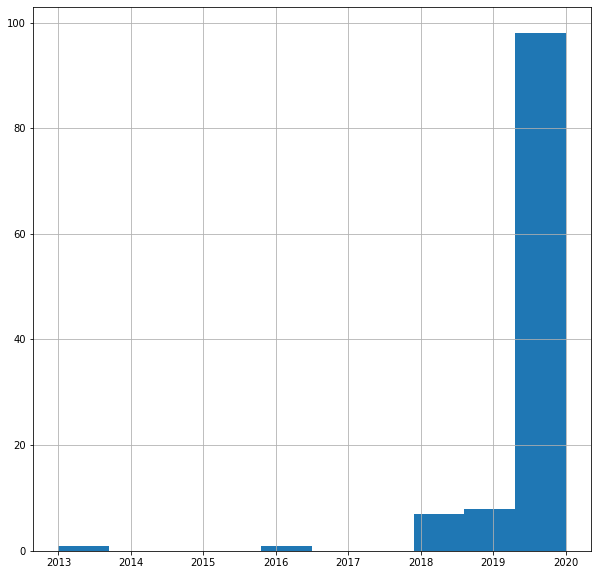

In [40]:
plt.figure(figsize=(10,10))
metadata[metadata['has_github']==True]['year'].hist()

In [41]:
all_files_df['has_github'] = all_files_df['text'].apply(lambda x: 'github' in str(x).lower())

In [42]:
all_files_df[all_files_df['has_github']==True].shape

(2343, 7)

In [43]:
# metadata_covid_19_code = metadata_covid_19[((metadata_covid_19['abstract'].apply(lambda x: 'code' in str(x).lower())) |
#                   (metadata_covid_19['abstract'].apply(lambda x: 'github' in str(x).lower())) |
#                   (metadata_covid_19['abstract'].apply(lambda x: 'software' in str(x).lower())) |
# #                   (metadata_covid_19['abstract'].apply(lambda x: 'repo' in str(x).lower())) |
#                   (metadata_covid_19['abstract'].apply(lambda x: 'repository' in str(x).lower())))]

metadata_covid_19_code = metadata_covid_19[metadata_covid_19['abstract'].apply(lambda x: 'github' in str(x).lower())]
metadata_covid_19_code.shape

(96, 19)

In [44]:
all_code_abstr = " ".join(list(metadata_covid_19_code['abstract'])).lower()

In [45]:
# all_code_abstr = " ".join(list(all_files_df[all_files_df['has_github']==True]['text']))

In [46]:
# all_code_abstr
metadata_covid_19_code['abstract'].index

Int64Index([ 11890,  14019,  21570,  21585,  21618,  21663,  21682,  25026,
             26176,  26286,  30184,  60252,  60622,  60647,  60910,  61128,
             61248,  61308,  61347,  61521,  61867,  62073,  62297,  62301,
             62635,  62908,  62915,  63001,  63357,  63449,  63465,  63607,
             63737,  63764,  63908,  63958,  64331,  64428,  64429,  64632,
             64717,  64794,  65239,  65616,  65716,  65778,  66145,  66267,
             66291,  66489,  84303,  84740,  84772,  85054,  85326,  85624,
             85833,  86014,  86138,  86337,  86409,  86480,  87424,  87798,
             87960,  88012,  88344,  88655,  88742,  88845,  89461,  89968,
             90115,  91013,  91022,  91308,  91331,  92692,  93576,  93610,
             93884,  93959,  94129,  94353,  95462,  96647,  96683,  96793,
            112260, 114967, 120344, 121376, 123890, 128020, 131282, 131919],
           dtype='int64')

In [47]:
metadata_covid_19_code['abstract']

11890     Efforts to develop effective and safe drugs fo...
14019     Dengue virus (DENV) represents a public health...
21570     In this work, we focus on the problem of entit...
21585     Successful biomedical relation extraction can ...
21618     Contextualized embeddings use unsupervised lan...
                                ...                        
121376    Abstract The novel coronavirus 2019 (COVID-201...
123890    The database here described contains data of i...
128020    BACKGROUND: GenBank contains over 3 million vi...
131282    In the analysis of genomic sequence data, so-c...
131919    MOTIVATION: To facilitate accurate estimation ...
Name: abstract, Length: 96, dtype: object

In [48]:
metadata_covid_19_code.shape

(96, 19)

In [49]:
all_files_pdf_df.head()

,text,cite_spans,ref_spans,section,paper_id
0,Improvements in neonatal intensive care have r...,"[{'start': 392, 'end': 395, 'text': '[1,', 're...",[],Introduction,4fcb95cc0c4ea6d1fa4137a4a087715ed6b68cea
1,"In one study of very low birth weight infants,...","[{'start': 255, 'end': 258, 'text': '[2]', 're...",[],Introduction,4fcb95cc0c4ea6d1fa4137a4a087715ed6b68cea
2,We reviewed the records of infants born at les...,"[{'start': 239, 'end': 242, 'text': '[3]', 're...",[],Methods,4fcb95cc0c4ea6d1fa4137a4a087715ed6b68cea
3,"The resuscitation protocol, together with the ...","[{'start': 100, 'end': 103, 'text': '[3]', 're...",[],Resuscitation protocol,4fcb95cc0c4ea6d1fa4137a4a087715ed6b68cea
4,The resuscitation recordings were analysed to ...,"[{'start': 620, 'end': 623, 'text': '[3]', 're...",[],Resuscitation monitoring,4fcb95cc0c4ea6d1fa4137a4a087715ed6b68cea


In [53]:
# all_files_pdf_df.head(20)
from ast import literal_eval

In [51]:
all_files_pdf_df.reset_index(inplace = True)

In [89]:
max(all_files_pdf_df['text'].index)

2425641

In [112]:
import os
# all_outputs = []
for indx in all_files_pdf_df['text'].index[1247043:]:
    if (indx%100 == 0):
        print (indx)
    input_text = all_files_pdf_df.loc[indx, 'text'].replace("`", "").replace("u$u#", "").replace("&", "").replace("\\","").replace("%", "").replace('"', '').replace("` ", "")
#     print ("input text: \n", input_text) #"Python is the bestest!" #We test GROBID (version 0.6.1)."
    stream = os.popen('curl -X POST -d "text='+str(input_text)+'" localhost:8060/service/processSoftwareText')
    output = stream.read()
    if literal_eval(output)['mentions']!=[]:
        all_outputs.append([indx, literal_eval(output)['mentions']])
        print(output)

{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:29+0000", "mentions" : [ { "software-name": { "rawForm" : "AIDS", "normalizedForm" : "AIDS", "offsetStart" : 746, "offsetEnd" : 750 }, "type" : "software" }, { "software-name": { "rawForm" : "AIDS", "normalizedForm" : "AIDS", "offsetStart" : 866, "offsetEnd" : 870 }, "type" : "software" }, { "software-name": { "rawForm" : "AIDS", "normalizedForm" : "AIDS", "offsetStart" : 990, "offsetEnd" : 995 }, "type" : "software" }], "runtime" : 16}
1247100
1247200
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:29+0000", "mentions" : [ { "software-name": { "rawForm" : "LAMP", "normalizedForm" : "LAMP", "offsetStart" : 370, "offsetEnd" : 374 }, "type" : "software" }, { "software-name": { "rawForm" : "LAMP", "normalizedForm" : "LAMP", "offsetStart" : 405, "offsetEnd" : 409 }, "type" : "software" }, { "software-name": { "rawForm" : "LAMP", "normalizedForm" : "LAMP", "off

{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:29+0000", "mentions" : [ { "software-name": { "rawForm" : "BLAST", "normalizedForm" : "BLAST", "offsetStart" : 91, "offsetEnd" : 97 }, "type" : "software" }, { "software-name": { "rawForm" : "RVDB", "normalizedForm" : "RVDB", "offsetStart" : 361, "offsetEnd" : 366 }, "type" : "software" }, { "software-name": { "rawForm" : "UniProt", "normalizedForm" : "UniProt", "offsetStart" : 977, "offsetEnd" : 985 }, "type" : "software" }], "runtime" : 24}
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:29+0000", "mentions" : [ { "software-name": { "rawForm" : "LASL", "normalizedForm" : "LASL", "offsetStart" : 279, "offsetEnd" : 284 }, "type" : "software" }], "runtime" : 8}
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:29+0000", "mentions" : [ { "software-name": { "rawForm" : "Linux", "normalizedForm" : "Linux", "offsetStart" 

{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:29+0000", "mentions" : [ { "software-name": { "rawForm" : "WeChat", "normalizedForm" : "WeChat", "offsetStart" : 695, "offsetEnd" : 702 }, "type" : "software" }], "runtime" : 25}
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:29+0000", "mentions" : [ { "software-name": { "rawForm" : "ModFit LT", "normalizedForm" : "ModFit LT", "offsetStart" : 736, "offsetEnd" : 746 }, "type" : "software", "publisher":{ "rawForm" : "Verity Software House", "normalizedForm" : "Verity Software House", "offsetStart" : 756, "offsetEnd" : 777 } }], "runtime" : 17}
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:29+0000", "mentions" : [ { "software-name": { "rawForm" : "Deltasoft JV", "normalizedForm" : "Deltasoft JV", "offsetStart" : 1351, "offsetEnd" : 1364 }, "type" : "software", "publisher":{ "rawForm" : "Deltasoft", "normalizedForm"

1247900
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:30+0000", "mentions" : [ { "software-name": { "rawForm" : "MERS", "normalizedForm" : "MERS", "offsetStart" : 324, "offsetEnd" : 329 }, "type" : "software" }], "runtime" : 16}
1248000
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:30+0000", "mentions" : [ { "software-name": { "rawForm" : "R", "normalizedForm" : "R", "offsetStart" : 123, "offsetEnd" : 125 }, "type" : "software", "version":{ "rawForm" : "3.6.4", "normalizedForm" : "3.6.4", "offsetStart" : 125, "offsetEnd" : 130 } }], "runtime" : 3}
1248100
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:30+0000", "mentions" : [ { "software-name": { "rawForm" : "SPSS", "normalizedForm" : "SPSS", "offsetStart" : 808, "offsetEnd" : 813 }, "type" : "software", "version":{ "rawForm" : "16.0", "normalizedForm" : "16.0", "offsetStart" : 813, "offsetEnd" : 818 } }], 

{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:30+0000", "mentions" : [ { "software-name": { "rawForm" : "HsPCFT", "normalizedForm" : "HsPCFT", "offsetStart" : 0, "offsetEnd" : 7 }, "type" : "software" }, { "software-name": { "rawForm" : "HsPCFT", "normalizedForm" : "HsPCFT", "offsetStart" : 154, "offsetEnd" : 161 }, "type" : "software" }, { "software-name": { "rawForm" : "HsPCFT", "normalizedForm" : "HsPCFT", "offsetStart" : 250, "offsetEnd" : 256 }, "type" : "software" }, { "software-name": { "rawForm" : "HsPCFT", "normalizedForm" : "HsPCFT", "offsetStart" : 394, "offsetEnd" : 400 }, "type" : "software" }, { "software-name": { "rawForm" : "HsPCFT", "normalizedForm" : "HsPCFT", "offsetStart" : 1035, "offsetEnd" : 1041 }, "type" : "software" }], "runtime" : 23}
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:30+0000", "mentions" : [ { "software-name": { "rawForm" : "HsPCFT", "normalizedForm" : "HsPCFT"

{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:30+0000", "mentions" : [ { "software-name": { "rawForm" : "Masslynx", "normalizedForm" : "Masslynx", "offsetStart" : 406, "offsetEnd" : 415 }, "type" : "software", "publisher":{ "rawForm" : "Micromass", "normalizedForm" : "Micromass", "offsetStart" : 425, "offsetEnd" : 434 } }, { "software-name": { "rawForm" : "MaxEnt", "normalizedForm" : "MaxEnt", "offsetStart" : 517, "offsetEnd" : 524 }, "type" : "software", "publisher":{ "rawForm" : "Micromass, Inc", "normalizedForm" : "Micromass, Inc", "offsetStart" : 534, "offsetEnd" : 548 } }], "runtime" : 11}
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:30+0000", "mentions" : [ { "software-name": { "rawForm" : "SARS-CoV", "normalizedForm" : "SARS-CoV", "offsetStart" : 328, "offsetEnd" : 337 }, "type" : "software" }, { "software-name": { "rawForm" : "SARS-CoV", "normalizedForm" : "SARS-CoV", "offsetStart" : 477, "

{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:31+0000", "mentions" : [ { "software-name": { "rawForm" : "MedSnap", "normalizedForm" : "MedSnap", "offsetStart" : 0, "offsetEnd" : 8 }, "type" : "software" }, { "software-name": { "rawForm" : "MedSnap", "normalizedForm" : "MedSnap", "offsetStart" : 340, "offsetEnd" : 348 }, "type" : "software" }, { "software-name": { "rawForm" : "MedSnap", "normalizedForm" : "MedSnap", "offsetStart" : 446, "offsetEnd" : 454 }, "type" : "software" }], "runtime" : 11}
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:31+0000", "mentions" : [ { "software-name": { "rawForm" : "MedSnap", "normalizedForm" : "MedSnap", "offsetStart" : 311, "offsetEnd" : 319 }, "type" : "software" }, { "software-name": { "rawForm" : "MedSnap", "normalizedForm" : "MedSnap", "offsetStart" : 359, "offsetEnd" : 366 }, "type" : "software" }, { "software-name": { "rawForm" : "MedSnap", "normalizedForm" :

{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:31+0000", "mentions" : [ { "software-name": { "rawForm" : "PuGH", "normalizedForm" : "PuGH", "offsetStart" : 182, "offsetEnd" : 187 }, "type" : "software" }], "runtime" : 13}
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:31+0000", "mentions" : [ { "software-name": { "rawForm" : "RANTES", "normalizedForm" : "RANTES", "offsetStart" : 249, "offsetEnd" : 256 }, "type" : "software" }], "runtime" : 87}
1249600
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:31+0000", "mentions" : [ { "software-name": { "rawForm" : "MEGA", "normalizedForm" : "MEGA", "offsetStart" : 91, "offsetEnd" : 95 }, "type" : "software", "version":{ "rawForm" : "7", "normalizedForm" : "7", "offsetStart" : 95, "offsetEnd" : 97 } }, { "software-name": { "rawForm" : "MEGA", "normalizedForm" : "MEGA", "offsetStart" : 222, "offsetEnd" : 226 }, "type" : 

1250000
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:31+0000", "mentions" : [ { "software-name": { "rawForm" : "IOrobust", "normalizedForm" : "IOrobust", "offsetStart" : 71, "offsetEnd" : 80 }, "type" : "software" }], "runtime" : 5}
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:31+0000", "mentions" : [ { "software-name": { "rawForm" : "R package robKalman", "normalizedForm" : "R package robKalman", "offsetStart" : 368, "offsetEnd" : 387 }, "type" : "software" }], "runtime" : 14}
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:31+0000", "mentions" : [ { "software-name": { "rawForm" : "R", "normalizedForm" : "R", "offsetStart" : 715, "offsetEnd" : 717 }, "type" : "software" }], "runtime" : 13}
1250100
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:31+0000", "mentions" : [ { "software-name": { "rawForm" : "Affymetrix"

1250700
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:32+0000", "mentions" : [ { "software-name": { "rawForm" : "Chap", "normalizedForm" : "Chap", "offsetStart" : 398, "offsetEnd" : 402 }, "type" : "software" }, { "software-name": { "rawForm" : "Chap", "normalizedForm" : "Chap", "offsetStart" : 1442, "offsetEnd" : 1446 }, "type" : "software" }], "runtime" : 25}
1250800
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:32+0000", "mentions" : [ { "software-name": { "rawForm" : "BioFire", "normalizedForm" : "BioFire", "offsetStart" : 443, "offsetEnd" : 450 }, "type" : "software" }], "runtime" : 22}
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:32+0000", "mentions" : [ { "software-name": { "rawForm" : "Excel", "normalizedForm" : "Excel", "offsetStart" : 726, "offsetEnd" : 732 }, "type" : "software", "version":{ "rawForm" : "2016", "normalizedForm" : "2016", "offse

{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:32+0000", "mentions" : [ { "software-name": { "rawForm" : "EditSeq", "normalizedForm" : "EditSeq", "offsetStart" : 1270, "offsetEnd" : 1278 }, "type" : "software", "version":{ "rawForm" : "5.06", "normalizedForm" : "5.06", "offsetStart" : 1321, "offsetEnd" : 1326 }, "publisher":{ "rawForm" : "DNASTAR Inc", "normalizedForm" : "DNASTAR Inc", "offsetStart" : 1336, "offsetEnd" : 1347 } }], "runtime" : 34}
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:32+0000", "mentions" : [ { "software-name": { "rawForm" : "ClustalX", "normalizedForm" : "ClustalX", "offsetStart" : 268, "offsetEnd" : 277 }, "type" : "software", "version":{ "rawForm" : "1.83", "normalizedForm" : "1.83", "offsetStart" : 293, "offsetEnd" : 297 } }, { "software-name": { "rawForm" : "ClustalX", "normalizedForm" : "ClustalX", "offsetStart" : 379, "offsetEnd" : 387 }, "type" : "software" }, { "soft

{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:32+0000", "mentions" : [ { "software-name": { "rawForm" : "Google Scholar", "normalizedForm" : "Google Scholar", "offsetStart" : 455, "offsetEnd" : 470 }, "type" : "software" }], "runtime" : 127}
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:32+0000", "mentions" : [ { "software-name": { "rawForm" : "cTfh", "normalizedForm" : "cTfh", "offsetStart" : 3230, "offsetEnd" : 3234 }, "type" : "software" }, { "software-name": { "rawForm" : "cTfh", "normalizedForm" : "cTfh", "offsetStart" : 3256, "offsetEnd" : 3260 }, "type" : "software" }, { "software-name": { "rawForm" : "cTfh", "normalizedForm" : "cTfh", "offsetStart" : 3272, "offsetEnd" : 3276 }, "type" : "software" }, { "software-name": { "rawForm" : "cTfh", "normalizedForm" : "cTfh", "offsetStart" : 3288, "offsetEnd" : 3292 }, "type" : "software" }, { "software-name": { "rawForm" : "cTfh", "normalizedForm" :

1251900
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:33+0000", "mentions" : [ { "software-name": { "rawForm" : "R", "normalizedForm" : "R", "offsetStart" : 154, "offsetEnd" : 156 }, "type" : "software" }, { "software-name": { "rawForm" : "R", "normalizedForm" : "R", "offsetStart" : 472, "offsetEnd" : 473 }, "type" : "software" }, { "software-name": { "rawForm" : "R", "normalizedForm" : "R", "offsetStart" : 864, "offsetEnd" : 865 }, "type" : "software" }], "runtime" : 15}
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:33+0000", "mentions" : [ { "software-name": { "rawForm" : "Android", "normalizedForm" : "Android", "offsetStart" : 914, "offsetEnd" : 922 }, "type" : "software" }, { "software-name": { "rawForm" : "iOS", "normalizedForm" : "iOS", "offsetStart" : 932, "offsetEnd" : 935 }, "type" : "software" }, { "software-name": { "rawForm" : "Google", "normalizedForm" : "Google", "offsetStart" : 982, "

{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:33+0000", "mentions" : [ { "software-name": { "rawForm" : "GAIN", "normalizedForm" : "GAIN", "offsetStart" : 58, "offsetEnd" : 63 }, "type" : "software", "url":{ "rawForm" : "www.worldallergy.org", "normalizedForm" : "www.worldallergy.org", "offsetStart" : 14, "offsetEnd" : 34 } }, { "software-name": { "rawForm" : "GAIN", "normalizedForm" : "GAIN", "offsetStart" : 604, "offsetEnd" : 608 }, "type" : "software" }], "runtime" : 12}
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:33+0000", "mentions" : [ { "software-name": { "rawForm" : "GLORIA", "normalizedForm" : "GLORIA", "offsetStart" : 4, "offsetEnd" : 11 }, "type" : "software" }, { "software-name": { "rawForm" : "GLORIA", "normalizedForm" : "GLORIA", "offsetStart" : 114, "offsetEnd" : 120 }, "type" : "software" }], "runtime" : 23}
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date":

{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:33+0000", "mentions" : [ { "software-name": { "rawForm" : "R", "normalizedForm" : "R", "offsetStart" : 3885, "offsetEnd" : 3887 }, "type" : "software" }], "runtime" : 65}
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:33+0000", "mentions" : [ { "software-name": { "rawForm" : "IPA", "normalizedForm" : "IPA", "offsetStart" : 53, "offsetEnd" : 57 }, "type" : "software" }], "runtime" : 19}
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:33+0000", "mentions" : [ { "software-name": { "rawForm" : "IPA", "normalizedForm" : "IPA", "offsetStart" : 53, "offsetEnd" : 57 }, "type" : "software" }, { "software-name": { "rawForm" : "IPA", "normalizedForm" : "IPA", "offsetStart" : 2021, "offsetEnd" : 2025 }, "type" : "software" }], "runtime" : 52}
1252800
1252900
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "

{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:33+0000", "mentions" : [ { "software-name": { "rawForm" : "OASL", "normalizedForm" : "OASL", "offsetStart" : 172, "offsetEnd" : 177 }, "type" : "software" }], "runtime" : 8}
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:33+0000", "mentions" : [ { "software-name": { "rawForm" : "Cyclic GMP-AMP", "normalizedForm" : "Cyclic GMP-AMP", "offsetStart" : 447, "offsetEnd" : 462 }, "type" : "software" }, { "software-name": { "rawForm" : "OASL", "normalizedForm" : "OASL", "offsetStart" : 1658, "offsetEnd" : 1662 }, "type" : "software" }], "runtime" : 30}
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:33+0000", "mentions" : [ { "software-name": { "rawForm" : "MDAC", "normalizedForm" : "MDAC", "offsetStart" : 373, "offsetEnd" : 377 }, "type" : "software" }, { "software-name": { "rawForm" : "MDAC", "normalizedForm" : "MDAC", 

{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:34+0000", "mentions" : [ { "software-name": { "rawForm" : "Primer Extension System", "normalizedForm" : "Primer Extension System", "offsetStart" : 380, "offsetEnd" : 404 }, "type" : "software" }], "runtime" : 9}
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:34+0000", "mentions" : [ { "software-name": { "rawForm" : "MIXLM", "normalizedForm" : "MIXLM", "offsetStart" : 1124, "offsetEnd" : 1130 }, "type" : "software" }], "runtime" : 35}
1253500
1253600
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:34+0000", "mentions" : [ { "software-name": { "rawForm" : "CONTAIN", "normalizedForm" : "CONTAIN", "offsetStart" : 182, "offsetEnd" : 189 }, "type" : "software" }], "runtime" : 12}
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:34+0000", "mentions" : [ { "software-name": { "rawFo

1253900
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:34+0000", "mentions" : [ { "software-name": { "rawForm" : "BLAST", "normalizedForm" : "BLAST", "offsetStart" : 390, "offsetEnd" : 396 }, "type" : "software", "url":{ "rawForm" : "http://blast.ncbi.nlm.nih.gov/Blast.cgi", "normalizedForm" : "http://blast.ncbi.nlm.nih.gov/Blast.cgi", "offsetStart" : 405, "offsetEnd" : 444 } }], "runtime" : 15}
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:34+0000", "mentions" : [ { "software-name": { "rawForm" : "BLASTn", "normalizedForm" : "BLASTn", "offsetStart" : 233, "offsetEnd" : 239 }, "type" : "software" }], "runtime" : 7}
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:34+0000", "mentions" : [ { "software-name": { "rawForm" : "Expert Choice 2000", "normalizedForm" : "Expert Choice 2000", "offsetStart" : 1077, "offsetEnd" : 1095 }, "type" : "software" }], "runtime" :

{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:34+0000", "mentions" : [ { "software-name": { "rawForm" : "BNIoutAS", "normalizedForm" : "BNIoutAS", "offsetStart" : 555, "offsetEnd" : 564 }, "type" : "software" }], "runtime" : 17}
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:34+0000", "mentions" : [ { "software-name": { "rawForm" : "R", "normalizedForm" : "R", "offsetStart" : 1227, "offsetEnd" : 1228 }, "type" : "software" }, { "software-name": { "rawForm" : "R", "normalizedForm" : "R", "offsetStart" : 1573, "offsetEnd" : 1574 }, "type" : "software" }], "runtime" : 28}
1254500
1254600
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:34+0000", "mentions" : [ { "software-name": { "rawForm" : "Mason-Pfizer", "normalizedForm" : "Mason-Pfizer", "offsetStart" : 606, "offsetEnd" : 619 }, "type" : "software" }], "runtime" : 27}
{ "application": "software-mentions", "v

{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:35+0000", "mentions" : [ { "software-name": { "rawForm" : "BLAST", "normalizedForm" : "BLAST", "offsetStart" : 511, "offsetEnd" : 517 }, "type" : "software" }, { "software-name": { "rawForm" : "CodonCode Aligner", "normalizedForm" : "CodonCode Aligner", "offsetStart" : 754, "offsetEnd" : 772 }, "type" : "software", "version":{ "rawForm" : "6.02", "normalizedForm" : "6.02", "offsetStart" : 772, "offsetEnd" : 777 }, "publisher":{ "rawForm" : "CodonCode Corporation", "normalizedForm" : "CodonCode Corporation", "offsetStart" : 778, "offsetEnd" : 799 } }, { "software-name": { "rawForm" : "SeqMan", "normalizedForm" : "SeqMan", "offsetStart" : 805, "offsetEnd" : 812 }, "type" : "software", "version":{ "rawForm" : "11.2.1", "normalizedForm" : "11.2.1", "offsetStart" : 812, "offsetEnd" : 819 }, "publisher":{ "rawForm" : "DNASTAR", "normalizedForm" : "DNASTAR", "offsetStart" : 820, "offsetEnd" : 827 } }], "

{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:35+0000", "mentions" : [ { "software-name": { "rawForm" : "TMB", "normalizedForm" : "TMB", "offsetStart" : 543, "offsetEnd" : 547 }, "type" : "software" }], "runtime" : 14}
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:35+0000", "mentions" : [ { "software-name": { "rawForm" : "FlowJo", "normalizedForm" : "FlowJo", "offsetStart" : 1083, "offsetEnd" : 1090 }, "type" : "software", "publisher":{ "rawForm" : "TreeStar Inc", "normalizedForm" : "TreeStar Inc", "offsetStart" : 1100, "offsetEnd" : 1112 } }], "runtime" : 20}
1255200
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:35+0000", "mentions" : [ { "software-name": { "rawForm" : "NONCODE", "normalizedForm" : "NONCODE", "offsetStart" : 201, "offsetEnd" : 209 }, "type" : "software", "url":{ "rawForm" : "http://www.noncode.org", "normalizedForm" : "http://www.noncode.

{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:35+0000", "mentions" : [ { "software-name": { "rawForm" : "ClustalW", "normalizedForm" : "ClustalW", "offsetStart" : 987, "offsetEnd" : 996 }, "type" : "software" }], "runtime" : 28}
1255800
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:35+0000", "mentions" : [ { "software-name": { "rawForm" : "SARS", "normalizedForm" : "SARS", "offsetStart" : 383, "offsetEnd" : 388 }, "type" : "software" }], "runtime" : 8}
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:35+0000", "mentions" : [ { "software-name": { "rawForm" : "GraphPad Prism", "normalizedForm" : "GraphPad Prism", "offsetStart" : 352, "offsetEnd" : 367 }, "type" : "software", "version":{ "rawForm" : "8.0b", "normalizedForm" : "8.0b", "offsetStart" : 368, "offsetEnd" : 373 } }], "runtime" : 7}
1255900
{ "application": "software-mentions", "version": "0.6.1-SNAPSH

{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:36+0000", "mentions" : [ { "software-name": { "rawForm" : "MUSCLE", "normalizedForm" : "MUSCLE", "offsetStart" : 146, "offsetEnd" : 153 }, "type" : "software" }], "runtime" : 10}
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:36+0000", "mentions" : [ { "software-name": { "rawForm" : "MUSCLE", "normalizedForm" : "MUSCLE", "offsetStart" : 134, "offsetEnd" : 141 }, "type" : "software" }], "runtime" : 26}
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:36+0000", "mentions" : [ { "software-name": { "rawForm" : "PriMux", "normalizedForm" : "PriMux", "offsetStart" : 944, "offsetEnd" : 951 }, "type" : "software", "url":{ "rawForm" : "http://sourceforge.net/projects/primux", "normalizedForm" : "http://sourceforge.net/projects/primux", "offsetStart" : 974, "offsetEnd" : 1012 } }, { "software-name": { "rawForm" : "JCVI", "no

{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:36+0000", "mentions" : [ { "software-name": { "rawForm" : "Vina", "normalizedForm" : "Vina", "offsetStart" : 209, "offsetEnd" : 214 }, "type" : "software" }], "runtime" : 8}
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:36+0000", "mentions" : [ { "software-name": { "rawForm" : "AutoDock", "normalizedForm" : "AutoDock", "offsetStart" : 4, "offsetEnd" : 13 }, "type" : "software" }, { "software-name": { "rawForm" : "AutoDockTools", "normalizedForm" : "AutoDockTools", "offsetStart" : 203, "offsetEnd" : 216 }, "type" : "software" }], "runtime" : 11}
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:36+0000", "mentions" : [ { "software-name": { "rawForm" : "SeeSAR", "normalizedForm" : "SeeSAR", "offsetStart" : 133, "offsetEnd" : 140 }, "type" : "software", "version":{ "rawForm" : "9.2", "normalizedForm" : "9.2", "offsetS

{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:36+0000", "mentions" : [ { "software-name": { "rawForm" : "Recombination Detection", "normalizedForm" : "Recombination Detection", "offsetStart" : 32, "offsetEnd" : 56 }, "type" : "software" }, { "software-name": { "rawForm" : "RDP", "normalizedForm" : "RDP", "offsetStart" : 73, "offsetEnd" : 76 }, "type" : "software", "version":{ "rawForm" : "4 v4.39", "normalizedForm" : "4 v4.39", "offsetStart" : 76, "offsetEnd" : 84 } }, { "software-name": { "rawForm" : "RDP", "normalizedForm" : "RDP", "offsetStart" : 161, "offsetEnd" : 164 }, "type" : "software" }], "runtime" : 20}
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:36+0000", "mentions" : [ { "software-name": { "rawForm" : "BEAUti", "normalizedForm" : "BEAUti", "offsetStart" : 573, "offsetEnd" : 580 }, "type" : "software" }, { "software-name": { "rawForm" : "TreeAnnotator", "normalizedForm" : "TreeAnnotato

{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:36+0000", "mentions" : [ { "software-name": { "rawForm" : "Care Excellence", "normalizedForm" : "Care Excellence", "offsetStart" : 5066, "offsetEnd" : 5082 }, "type" : "software", "url":{ "rawForm" : "www.who.int/publications/guidelines", "normalizedForm" : "www.who.int/publications/guidelines", "offsetStart" : 3249, "offsetEnd" : 3284 } }], "runtime" : 151}
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:36+0000", "mentions" : [ { "software-name": { "rawForm" : "SPIN", "normalizedForm" : "SPIN", "offsetStart" : 1643, "offsetEnd" : 1647 }, "type" : "software" }, { "software-name": { "rawForm" : "SPIN", "normalizedForm" : "SPIN", "offsetStart" : 1915, "offsetEnd" : 1919 }, "type" : "software" }, { "software-name": { "rawForm" : "SPIN", "normalizedForm" : "SPIN", "offsetStart" : 2153, "offsetEnd" : 2157 }, "type" : "software" }, { "software-name": { "rawForm

1257700
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:37+0000", "mentions" : [ { "software-name": { "rawForm" : "EpiInfo", "normalizedForm" : "EpiInfo", "offsetStart" : 695, "offsetEnd" : 703 }, "type" : "software" }, { "software-name": { "rawForm" : "Stata", "normalizedForm" : "Stata", "offsetStart" : 705, "offsetEnd" : 710 }, "type" : "software" }], "runtime" : 12}
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:37+0000", "mentions" : [ { "software-name": { "rawForm" : "Google Analytics", "normalizedForm" : "Google Analytics", "offsetStart" : 10, "offsetEnd" : 27 }, "type" : "software" }, { "software-name": { "rawForm" : "Google Analytics", "normalizedForm" : "Google Analytics", "offsetStart" : 393, "offsetEnd" : 410 }, "type" : "software" }], "runtime" : 7}
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:37+0000", "mentions" : [ { "software-name": { "rawFor

{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:37+0000", "mentions" : [ { "software-name": { "rawForm" : "RStudio", "normalizedForm" : "RStudio", "offsetStart" : 470, "offsetEnd" : 478 }, "type" : "software", "version":{ "rawForm" : "1.2.1335", "normalizedForm" : "1.2.1335", "offsetStart" : 479, "offsetEnd" : 488 } }], "runtime" : 12}
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:37+0000", "mentions" : [ { "software-name": { "rawForm" : "Meta-Analysis", "normalizedForm" : "Meta-Analysis", "offsetStart" : 1368, "offsetEnd" : 1382 }, "type" : "software" }], "runtime" : 49}
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:37+0000", "mentions" : [ { "software-name": { "rawForm" : "AUSL", "normalizedForm" : "AUSL", "offsetStart" : 85, "offsetEnd" : 90 }, "type" : "software" }, { "software-name": { "rawForm" : "AUSL", "normalizedForm" : "AUSL", "offsetStart" : 603, 

{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:37+0000", "mentions" : [ { "software-name": { "rawForm" : "AeroTrak Portable Particle Counter", "normalizedForm" : "AeroTrak Portable Particle Counter", "offsetStart" : 735, "offsetEnd" : 770 }, "type" : "software", "version":{ "rawForm" : "5.3", "normalizedForm" : "5.3", "offsetStart" : 279, "offsetEnd" : 282 } }, { "software-name": { "rawForm" : "SAS", "normalizedForm" : "SAS", "offsetStart" : 787, "offsetEnd" : 791 }, "type" : "software" }], "runtime" : 17}
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:37+0000", "mentions" : [ { "software-name": { "rawForm" : "ASL", "normalizedForm" : "ASL", "offsetStart" : 95, "offsetEnd" : 99 }, "type" : "software" }, { "software-name": { "rawForm" : "ASL", "normalizedForm" : "ASL", "offsetStart" : 327, "offsetEnd" : 331 }, "type" : "software" }], "runtime" : 5}
{ "application": "software-mentions", "version": "0.6.

{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:38+0000", "mentions" : [ { "software-name": { "rawForm" : "Ensembl", "normalizedForm" : "Ensembl", "offsetStart" : 161, "offsetEnd" : 169 }, "type" : "software" }, { "software-name": { "rawForm" : "Myoluc", "normalizedForm" : "Myoluc", "offsetStart" : 170, "offsetEnd" : 176 }, "type" : "software", "version":{ "rawForm" : "2.0", "normalizedForm" : "2.0", "offsetStart" : 176, "offsetEnd" : 179 } }], "runtime" : 3}
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:38+0000", "mentions" : [ { "software-name": { "rawForm" : "Prinseq", "normalizedForm" : "Prinseq", "offsetStart" : 140, "offsetEnd" : 148 }, "type" : "software" }, { "software-name": { "rawForm" : "SortMeRNA", "normalizedForm" : "SortMeRNA", "offsetStart" : 257, "offsetEnd" : 267 }, "type" : "software", "version":{ "rawForm" : "2.1", "normalizedForm" : "2.1", "offsetStart" : 269, "offsetEnd" : 272 } }

1259800
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:38+0000", "mentions" : [ { "software-name": { "rawForm" : "ZnCI", "normalizedForm" : "ZnCI", "offsetStart" : 2246, "offsetEnd" : 2250 }, "type" : "software" }, { "software-name": { "rawForm" : "ZnCI", "normalizedForm" : "ZnCI", "offsetStart" : 3061, "offsetEnd" : 3065 }, "type" : "software" }, { "software-name": { "rawForm" : "ZnCI", "normalizedForm" : "ZnCI", "offsetStart" : 3309, "offsetEnd" : 3313 }, "type" : "software" }, { "software-name": { "rawForm" : "ZnCI", "normalizedForm" : "ZnCI", "offsetStart" : 3388, "offsetEnd" : 3392 }, "type" : "software" }], "runtime" : 56}
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:38+0000", "mentions" : [ { "software-name": { "rawForm" : "ABPP", "normalizedForm" : "ABPP", "offsetStart" : 222, "offsetEnd" : 226 }, "type" : "software" }, { "software-name": { "rawForm" : "ABPP", "normalizedForm" : "ABPP", "off

1260400
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:38+0000", "mentions" : [ { "software-name": { "rawForm" : "MudPIT", "normalizedForm" : "MudPIT", "offsetStart" : 328, "offsetEnd" : 335 }, "type" : "software" }], "runtime" : 22}
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:38+0000", "mentions" : [ { "software-name": { "rawForm" : "SARS-CoV", "normalizedForm" : "SARS-CoV", "offsetStart" : 175, "offsetEnd" : 184 }, "type" : "software" }, { "software-name": { "rawForm" : "SARS-CoV", "normalizedForm" : "SARS-CoV", "offsetStart" : 707, "offsetEnd" : 715 }, "type" : "software" }, { "software-name": { "rawForm" : "SARS-CoV", "normalizedForm" : "SARS-CoV", "offsetStart" : 1537, "offsetEnd" : 1545 }, "type" : "software" }], "runtime" : 26}
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:38+0000", "mentions" : [ { "software-name": { "rawForm" : "SARS-CoV PL pro",

{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:39+0000", "mentions" : [ { "software-name": { "rawForm" : "CPV", "normalizedForm" : "CPV", "offsetStart" : 65, "offsetEnd" : 68 }, "type" : "software" }, { "software-name": { "rawForm" : "CPV", "normalizedForm" : "CPV", "offsetStart" : 125, "offsetEnd" : 128 }, "type" : "software" }, { "software-name": { "rawForm" : "CPV", "normalizedForm" : "CPV", "offsetStart" : 332, "offsetEnd" : 335 }, "type" : "software" }, { "software-name": { "rawForm" : "CPV", "normalizedForm" : "CPV", "offsetStart" : 345, "offsetEnd" : 348 }, "type" : "software" }, { "software-name": { "rawForm" : "CPV", "normalizedForm" : "CPV", "offsetStart" : 361, "offsetEnd" : 364 }, "type" : "software" }, { "software-name": { "rawForm" : "CPV", "normalizedForm" : "CPV", "offsetStart" : 380, "offsetEnd" : 384 }, "type" : "software" }, { "software-name": { "rawForm" : "CPV", "normalizedForm" : "CPV", "offsetStart" : 486, "offsetEnd" : 

{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:39+0000", "mentions" : [ { "software-name": { "rawForm" : "SPLICE-DONOR", "normalizedForm" : "SPLICE-DONOR", "offsetStart" : 297, "offsetEnd" : 309 }, "type" : "software" }, { "software-name": { "rawForm" : "SPLICE-ACCEPTOR", "normalizedForm" : "SPLICE-ACCEPTOR", "offsetStart" : 315, "offsetEnd" : 331 }, "type" : "software" }], "runtime" : 14}
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:39+0000", "mentions" : [ { "software-name": { "rawForm" : "DomainGapAlign", "normalizedForm" : "DomainGapAlign", "offsetStart" : 344, "offsetEnd" : 359 }, "type" : "software" }], "runtime" : 30}
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:39+0000", "mentions" : [ { "software-name": { "rawForm" : "PhyML", "normalizedForm" : "PhyML", "offsetStart" : 530, "offsetEnd" : 536 }, "type" : "software" }, { "software-name": { "rawForm

1261600
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:39+0000", "mentions" : [ { "software-name": { "rawForm" : "SPSS", "normalizedForm" : "SPSS", "offsetStart" : 1367, "offsetEnd" : 1372 }, "type" : "software" }], "runtime" : 48}
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:39+0000", "mentions" : [ { "software-name": { "rawForm" : "Image J", "normalizedForm" : "Image J", "offsetStart" : 1877, "offsetEnd" : 1885 }, "type" : "software", "publisher":{ "rawForm" : "National Institute of Mental Health", "normalizedForm" : "National Institute of Mental Health", "offsetStart" : 1895, "offsetEnd" : 1930 } }], "runtime" : 31}
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:39+0000", "mentions" : [ { "software-name": { "rawForm" : "Image J", "normalizedForm" : "Image J", "offsetStart" : 589, "offsetEnd" : 597 }, "type" : "software" }], "runtime" : 13}
{ "application

{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:40+0000", "mentions" : [ { "software-name": { "rawForm" : "CMVSpike", "normalizedForm" : "CMVSpike", "offsetStart" : 216, "offsetEnd" : 225 }, "type" : "software" }, { "software-name": { "rawForm" : "CMVSpike", "normalizedForm" : "CMVSpike", "offsetStart" : 392, "offsetEnd" : 400 }, "type" : "software" }], "runtime" : 44}
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:40+0000", "mentions" : [ { "software-name": { "rawForm" : "Image-Quant", "normalizedForm" : "Image-Quant", "offsetStart" : 611, "offsetEnd" : 622 }, "type" : "software", "version":{ "rawForm" : "5.1", "normalizedForm" : "5.1", "offsetStart" : 622, "offsetEnd" : 625 } }], "runtime" : 19}
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:40+0000", "mentions" : [ { "software-name": { "rawForm" : "Entelechon Backtranslation", "normalizedForm" : "Entelechon

1262400
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:40+0000", "mentions" : [ { "software-name": { "rawForm" : "DNA star", "normalizedForm" : "DNA star", "offsetStart" : 108, "offsetEnd" : 117 }, "type" : "software" }], "runtime" : 21}
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:40+0000", "mentions" : [ { "software-name": { "rawForm" : "Lipefectamine™ 3000", "normalizedForm" : "Lipefectamine™ 3000", "offsetStart" : 102, "offsetEnd" : 122 }, "type" : "software" }], "runtime" : 8}
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:40+0000", "mentions" : [ { "software-name": { "rawForm" : "SPSS", "normalizedForm" : "SPSS", "offsetStart" : 59, "offsetEnd" : 64 }, "type" : "software", "version":{ "rawForm" : "16.0", "normalizedForm" : "16.0", "offsetStart" : 64, "offsetEnd" : 69 } }, { "software-name": { "rawForm" : "GraphPad Prism", "normalizedForm" : "GraphPad 

1262700
1262800
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:40+0000", "mentions" : [ { "software-name": { "rawForm" : "SAS", "normalizedForm" : "SAS", "offsetStart" : 85, "offsetEnd" : 89 }, "type" : "software", "version":{ "rawForm" : "9.3", "normalizedForm" : "9.3", "offsetStart" : 97, "offsetEnd" : 100 } }, { "software-name": { "rawForm" : "REST", "normalizedForm" : "REST", "offsetStart" : 340, "offsetEnd" : 344 }, "type" : "software" }, { "software-name": { "rawForm" : "REST (Relative Expression Software Tool", "normalizedForm" : "REST (Relative Expression Software Tool", "offsetStart" : 340, "offsetEnd" : 379 }, "type" : "software" }, { "software-name": { "rawForm" : "REST (Relative Expression Software Tool)", "normalizedForm" : "REST (Relative Expression Software Tool)", "offsetStart" : 340, "offsetEnd" : 381 }, "type" : "software", "version":{ "rawForm" : "2009", "normalizedForm" : "2009", "offsetStart" : 398, "offsetEnd" : 403 }, "p

{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:40+0000", "mentions" : [ { "software-name": { "rawForm" : "Lineweaver-Burk", "normalizedForm" : "Lineweaver-Burk", "offsetStart" : 50, "offsetEnd" : 66 }, "type" : "software" }], "runtime" : 2}
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:40+0000", "mentions" : [ { "software-name": { "rawForm" : "Lineweaver-Burk", "normalizedForm" : "Lineweaver-Burk", "offsetStart" : 167, "offsetEnd" : 183 }, "type" : "software" }], "runtime" : 13}
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:40+0000", "mentions" : [ { "software-name": { "rawForm" : "DICER", "normalizedForm" : "DICER", "offsetStart" : 479, "offsetEnd" : 485 }, "type" : "software" }, { "software-name": { "rawForm" : "DICER", "normalizedForm" : "DICER", "offsetStart" : 1107, "offsetEnd" : 1112 }, "type" : "software" }, { "software-name": { "rawForm" : "DICER", 

{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:41+0000", "mentions" : [ { "software-name": { "rawForm" : "TACE", "normalizedForm" : "TACE", "offsetStart" : 347, "offsetEnd" : 351 }, "type" : "software" }, { "software-name": { "rawForm" : "TACE", "normalizedForm" : "TACE", "offsetStart" : 1234, "offsetEnd" : 1239 }, "type" : "software" }, { "software-name": { "rawForm" : "TACE", "normalizedForm" : "TACE", "offsetStart" : 1338, "offsetEnd" : 1343 }, "type" : "software" }, { "software-name": { "rawForm" : "TACE", "normalizedForm" : "TACE", "offsetStart" : 1354, "offsetEnd" : 1358 }, "type" : "software" }, { "software-name": { "rawForm" : "TACE", "normalizedForm" : "TACE", "offsetStart" : 1554, "offsetEnd" : 1558 }, "type" : "software" }, { "software-name": { "rawForm" : "TACE", "normalizedForm" : "TACE", "offsetStart" : 1577, "offsetEnd" : 1581 }, "type" : "software" }, { "software-name": { "rawForm" : "TACE", "normalizedForm" : "TACE", "offsetSt

{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:41+0000", "mentions" : [ { "software-name": { "rawForm" : "MAFFT", "normalizedForm" : "MAFFT", "offsetStart" : 1411, "offsetEnd" : 1417 }, "type" : "software", "version":{ "rawForm" : "243", "normalizedForm" : "243", "offsetStart" : 1417, "offsetEnd" : 1421 } }, { "software-name": { "rawForm" : "MrBayes", "normalizedForm" : "MrBayes", "offsetStart" : 1830, "offsetEnd" : 1838 }, "type" : "software" }], "runtime" : 29}
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:41+0000", "mentions" : [ { "software-name": { "rawForm" : "Google Scholar", "normalizedForm" : "Google Scholar", "offsetStart" : 503, "offsetEnd" : 518 }, "type" : "software" }], "runtime" : 15}
1263800
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:41+0000", "mentions" : [ { "software-name": { "rawForm" : "Open Recommendation Platform", "normalizedForm"

{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:41+0000", "mentions" : [ { "software-name": { "rawForm" : "Freesurfer", "normalizedForm" : "Freesurfer", "offsetStart" : 2675, "offsetEnd" : 2686 }, "type" : "software" }], "runtime" : 45}
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:41+0000", "mentions" : [ { "software-name": { "rawForm" : "FSL", "normalizedForm" : "FSL", "offsetStart" : 1020, "offsetEnd" : 1023 }, "type" : "software" }, { "software-name": { "rawForm" : "FSL)", "normalizedForm" : "FSL)", "offsetStart" : 1020, "offsetEnd" : 1025 }, "type" : "software" }, { "software-name": { "rawForm" : "FSL", "normalizedForm" : "FSL", "offsetStart" : 1224, "offsetEnd" : 1228 }, "type" : "software" }, { "software-name": { "rawForm" : "FreeSurfer", "normalizedForm" : "FreeSurfer", "offsetStart" : 3093, "offsetEnd" : 3104 }, "type" : "software" }, { "software-name": { "rawForm" : "FreeSurfer", "normalized

{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:41+0000", "mentions" : [ { "software-name": { "rawForm" : "LCH", "normalizedForm" : "LCH", "offsetStart" : 723, "offsetEnd" : 726 }, "type" : "software" }, { "software-name": { "rawForm" : "LCH", "normalizedForm" : "LCH", "offsetStart" : 760, "offsetEnd" : 764 }, "type" : "software" }], "runtime" : 24}
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:41+0000", "mentions" : [ { "software-name": { "rawForm" : "Statistica", "normalizedForm" : "Statistica", "offsetStart" : 2214, "offsetEnd" : 2225 }, "type" : "software", "version":{ "rawForm" : "12.0", "normalizedForm" : "12.0", "offsetStart" : 2245, "offsetEnd" : 2249 } }], "runtime" : 54}
1264400
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:41+0000", "mentions" : [ { "software-name": { "rawForm" : "DCE-MRI", "normalizedForm" : "DCE-MRI", "offsetStart" : 1411, "offs

1264700
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:41+0000", "mentions" : [ { "software-name": { "rawForm" : "Munster", "normalizedForm" : "Munster", "offsetStart" : 4, "offsetEnd" : 12 }, "type" : "software" }], "runtime" : 1}
1264800
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:41+0000", "mentions" : [ { "software-name": { "rawForm" : "Clustering Analysis technique", "normalizedForm" : "Clustering Analysis technique", "offsetStart" : 82, "offsetEnd" : 112 }, "type" : "software" }], "runtime" : 10}
1264900
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:42+0000", "mentions" : [ { "software-name": { "rawForm" : "SARS-CoV", "normalizedForm" : "SARS-CoV", "offsetStart" : 24, "offsetEnd" : 32 }, "type" : "software" }, { "software-name": { "rawForm" : "SARS-CoV", "normalizedForm" : "SARS-CoV", "offsetStart" : 143, "offsetEnd" : 152 }, "type" : "software" }, 

1265400
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:42+0000", "mentions" : [ { "software-name": { "rawForm" : "Matlab", "normalizedForm" : "Matlab", "offsetStart" : 457, "offsetEnd" : 464 }, "type" : "software" }], "runtime" : 15}
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:42+0000", "mentions" : [ { "software-name": { "rawForm" : "R", "normalizedForm" : "R", "offsetStart" : 3575, "offsetEnd" : 3577 }, "type" : "software" }, { "software-name": { "rawForm" : "R", "normalizedForm" : "R", "offsetStart" : 3718, "offsetEnd" : 3720 }, "type" : "software" }, { "software-name": { "rawForm" : "R", "normalizedForm" : "R", "offsetStart" : 3861, "offsetEnd" : 3862 }, "type" : "software" }, { "software-name": { "rawForm" : "R", "normalizedForm" : "R", "offsetStart" : 3946, "offsetEnd" : 3947 }, "type" : "software" }, { "software-name": { "rawForm" : "R", "normalizedForm" : "R", "offsetStart" : 4039, "offsetE

{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:42+0000", "mentions" : [ { "software-name": { "rawForm" : "IMPROVE", "normalizedForm" : "IMPROVE", "offsetStart" : 4, "offsetEnd" : 12 }, "type" : "software" }], "runtime" : 8}
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:42+0000", "mentions" : [ { "software-name": { "rawForm" : "IMPROVE", "normalizedForm" : "IMPROVE", "offsetStart" : 174, "offsetEnd" : 182 }, "type" : "software" }], "runtime" : 27}
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:42+0000", "mentions" : [ { "software-name": { "rawForm" : "rEVAR", "normalizedForm" : "rEVAR", "offsetStart" : 140, "offsetEnd" : 146 }, "type" : "software" }], "runtime" : 5}
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:42+0000", "mentions" : [ { "software-name": { "rawForm" : "FastQC", "normalizedForm" : "FastQC", "offsetSt

{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:43+0000", "mentions" : [ { "software-name": { "rawForm" : "EIGENSTRAT", "normalizedForm" : "EIGENSTRAT", "offsetStart" : 153, "offsetEnd" : 164 }, "type" : "software" }], "runtime" : 14}
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:43+0000", "mentions" : [ { "software-name": { "rawForm" : "EIGENSTRAT", "normalizedForm" : "EIGENSTRAT", "offsetStart" : 350, "offsetEnd" : 361 }, "type" : "software" }], "runtime" : 11}
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:43+0000", "mentions" : [ { "software-name": { "rawForm" : "EIGENSTRAT", "normalizedForm" : "EIGENSTRAT", "offsetStart" : 1055, "offsetEnd" : 1066 }, "type" : "software" }], "runtime" : 19}
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:43+0000", "mentions" : [ { "software-name": { "rawForm" : "EIGENSTRAT", "norm

1266800
1266900
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:43+0000", "mentions" : [ { "software-name": { "rawForm" : "R", "normalizedForm" : "R", "offsetStart" : 816, "offsetEnd" : 817 }, "type" : "software" }, { "software-name": { "rawForm" : "R", "normalizedForm" : "R", "offsetStart" : 908, "offsetEnd" : 910 }, "type" : "software" }, { "software-name": { "rawForm" : "R", "normalizedForm" : "R", "offsetStart" : 1054, "offsetEnd" : 1055 }, "type" : "software" }], "runtime" : 19}
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:43+0000", "mentions" : [ { "software-name": { "rawForm" : "Canada", "normalizedForm" : "Canada", "offsetStart" : 204, "offsetEnd" : 211 }, "type" : "software" }], "runtime" : 20}
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:43+0000", "mentions" : [ { "software-name": { "rawForm" : "ERPIN", "normalizedForm" : "ERPIN", "offsetStart" :

{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:43+0000", "mentions" : [ { "software-name": { "rawForm" : "RAT", "normalizedForm" : "RAT", "offsetStart" : 106, "offsetEnd" : 109 }, "type" : "software" }, { "software-name": { "rawForm" : "RAT", "normalizedForm" : "RAT", "offsetStart" : 432, "offsetEnd" : 435 }, "type" : "software" }, { "software-name": { "rawForm" : "RAT2", "normalizedForm" : "RAT2", "offsetStart" : 432, "offsetEnd" : 436 }, "type" : "software" }, { "software-name": { "rawForm" : "RAT", "normalizedForm" : "RAT", "offsetStart" : 467, "offsetEnd" : 470 }, "type" : "software" }, { "software-name": { "rawForm" : "MAT", "normalizedForm" : "MAT", "offsetStart" : 622, "offsetEnd" : 626 }, "type" : "software" }, { "software-name": { "rawForm" : "MAT", "normalizedForm" : "MAT", "offsetStart" : 708, "offsetEnd" : 711 }, "type" : "software" }, { "software-name": { "rawForm" : "MAT", "normalizedForm" : "MAT", "offsetStart" : 719, "offsetEnd

{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:44+0000", "mentions" : [ { "software-name": { "rawForm" : "R6/2 Quadriceps", "normalizedForm" : "R6/2 Quadriceps", "offsetStart" : 160, "offsetEnd" : 175 }, "type" : "software" }], "runtime" : 7}
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:44+0000", "mentions" : [ { "software-name": { "rawForm" : "GraphPad Prism", "normalizedForm" : "GraphPad Prism", "offsetStart" : 38, "offsetEnd" : 53 }, "type" : "software" }], "runtime" : 5}
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:44+0000", "mentions" : [ { "software-name": { "rawForm" : "RNAseq", "normalizedForm" : "RNAseq", "offsetStart" : 9, "offsetEnd" : 16 }, "type" : "software" }, { "software-name": { "rawForm" : "Gene Set Enrichment Analysis (GSEA", "normalizedForm" : "Gene Set Enrichment Analysis (GSEA", "offsetStart" : 697, "offsetEnd" : 731 }, "type" : "sof

{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:44+0000", "mentions" : [ { "software-name": { "rawForm" : "Matrix-2", "normalizedForm" : "Matrix-2", "offsetStart" : 1801, "offsetEnd" : 1809 }, "type" : "software" }], "runtime" : 26}
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:44+0000", "mentions" : [ { "software-name": { "rawForm" : "GenBank", "normalizedForm" : "GenBank", "offsetStart" : 1564, "offsetEnd" : 1572 }, "type" : "software", "publisher":{ "rawForm" : "NCBI", "normalizedForm" : "NCBI", "offsetStart" : 1559, "offsetEnd" : 1564 } }], "runtime" : 47}
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:44+0000", "mentions" : [ { "software-name": { "rawForm" : "UBLAST", "normalizedForm" : "UBLAST", "offsetStart" : 621, "offsetEnd" : 628 }, "type" : "software" }], "runtime" : 13}
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "20

{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:44+0000", "mentions" : [ { "software-name": { "rawForm" : "ForteBio", "normalizedForm" : "ForteBio", "offsetStart" : 43, "offsetEnd" : 51 }, "type" : "software" }, { "software-name": { "rawForm" : "ForteBio", "normalizedForm" : "ForteBio", "offsetStart" : 183, "offsetEnd" : 191 }, "type" : "software" }, { "software-name": { "rawForm" : "ForteBio", "normalizedForm" : "ForteBio", "offsetStart" : 801, "offsetEnd" : 810 }, "type" : "software", "version":{ "rawForm" : "9.0", "normalizedForm" : "9.0", "offsetStart" : 833, "offsetEnd" : 836 } }], "runtime" : 15}
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:44+0000", "mentions" : [ { "software-name": { "rawForm" : "ZMapp", "normalizedForm" : "ZMapp", "offsetStart" : 194, "offsetEnd" : 200 }, "type" : "software" }], "runtime" : 6}
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-0

{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:44+0000", "mentions" : [ { "software-name": { "rawForm" : "BTRP", "normalizedForm" : "BTRP", "offsetStart" : 17, "offsetEnd" : 21 }, "type" : "software" }, { "software-name": { "rawForm" : "BTRP", "normalizedForm" : "BTRP", "offsetStart" : 1037, "offsetEnd" : 1041 }, "type" : "software" }, { "software-name": { "rawForm" : "BTRP", "normalizedForm" : "BTRP", "offsetStart" : 1630, "offsetEnd" : 1634 }, "type" : "software" }, { "software-name": { "rawForm" : "BTRP", "normalizedForm" : "BTRP", "offsetStart" : 2005, "offsetEnd" : 2010 }, "type" : "software" }, { "software-name": { "rawForm" : "BTRP", "normalizedForm" : "BTRP", "offsetStart" : 2108, "offsetEnd" : 2112 }, "type" : "software" }, { "software-name": { "rawForm" : "BTRP", "normalizedForm" : "BTRP", "offsetStart" : 2330, "offsetEnd" : 2334 }, "type" : "software" }], "runtime" : 43}
1269000
{ "application": "software-mentions", "version": "0.6.

{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:45+0000", "mentions" : [ { "software-name": { "rawForm" : "Clustal", "normalizedForm" : "Clustal", "offsetStart" : 466, "offsetEnd" : 474 }, "type" : "software" }], "runtime" : 21}
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:45+0000", "mentions" : [ { "software-name": { "rawForm" : "ImageJ", "normalizedForm" : "ImageJ", "offsetStart" : 894, "offsetEnd" : 901 }, "type" : "software", "version":{ "rawForm" : "1.51p", "normalizedForm" : "1.51p", "offsetStart" : 918, "offsetEnd" : 924 } }], "runtime" : 19}
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:45+0000", "mentions" : [ { "software-name": { "rawForm" : "MORADA-G2", "normalizedForm" : "MORADA-G2", "offsetStart" : 1116, "offsetEnd" : 1125 }, "type" : "software" }], "runtime" : 19}
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020

{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:45+0000", "mentions" : [ { "software-name": { "rawForm" : "Google Hangouts", "normalizedForm" : "Google Hangouts", "offsetStart" : 1399, "offsetEnd" : 1415 }, "type" : "software" }, { "software-name": { "rawForm" : "Skype", "normalizedForm" : "Skype", "offsetStart" : 1426, "offsetEnd" : 1431 }, "type" : "software" }, { "software-name": { "rawForm" : "Skype", "normalizedForm" : "Skype", "offsetStart" : 1493, "offsetEnd" : 1499 }, "type" : "software" }], "runtime" : 27}
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:45+0000", "mentions" : [ { "software-name": { "rawForm" : "LCMV", "normalizedForm" : "LCMV", "offsetStart" : 48, "offsetEnd" : 53 }, "type" : "software" }], "runtime" : 19}
1269900
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:45+0000", "mentions" : [ { "software-name": { "rawForm" : "Table", "normaliz

{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:45+0000", "mentions" : [ { "software-name": { "rawForm" : "March", "normalizedForm" : "March", "offsetStart" : 973, "offsetEnd" : 979 }, "type" : "software" }], "runtime" : 15}
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:45+0000", "mentions" : [ { "software-name": { "rawForm" : "LightCycler", "normalizedForm" : "LightCycler", "offsetStart" : 316, "offsetEnd" : 328 }, "type" : "software" }], "runtime" : 11}
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:45+0000", "mentions" : [ { "software-name": { "rawForm" : "LightCycler", "normalizedForm" : "LightCycler", "offsetStart" : 110, "offsetEnd" : 122 }, "type" : "software", "version":{ "rawForm" : "3.5", "normalizedForm" : "3.5", "offsetStart" : 139, "offsetEnd" : 143 } }, { "software-name": { "rawForm" : "Minitab", "normalizedForm" : "Minitab", "offsetStart" : 168

1270700
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:46+0000", "mentions" : [ { "software-name": { "rawForm" : "SAS", "normalizedForm" : "SAS", "offsetStart" : 1403, "offsetEnd" : 1407 }, "type" : "software" }], "runtime" : 27}
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:46+0000", "mentions" : [ { "software-name": { "rawForm" : "Surface Air Systems (SAS) Sampler", "normalizedForm" : "Surface Air Systems (SAS) Sampler", "offsetStart" : 333, "offsetEnd" : 367 }, "type" : "software", "url":{ "rawForm" : "http://www. skcinc.com/catalog/index.php", "normalizedForm" : "http://www. skcinc.com/catalog/index.php", "offsetStart" : 2237, "offsetEnd" : 2277 } }], "runtime" : 42}
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:46+0000", "mentions" : [ { "software-name": { "rawForm" : "SAS", "normalizedForm" : "SAS", "offsetStart" : 824, "offsetEnd" : 828 }, "type" : "

{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:46+0000", "mentions" : [ { "software-name": { "rawForm" : "rgBTV", "normalizedForm" : "rgBTV", "offsetStart" : 224, "offsetEnd" : 229 }, "type" : "software" }, { "software-name": { "rawForm" : "rgBTV", "normalizedForm" : "rgBTV", "offsetStart" : 235, "offsetEnd" : 240 }, "type" : "software" }, { "software-name": { "rawForm" : "rgBTV", "normalizedForm" : "rgBTV", "offsetStart" : 1267, "offsetEnd" : 1272 }, "type" : "software" }], "runtime" : 26}
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:46+0000", "mentions" : [ { "software-name": { "rawForm" : "rgBTV", "normalizedForm" : "rgBTV", "offsetStart" : 26, "offsetEnd" : 31 }, "type" : "software" }, { "software-name": { "rawForm" : "rgBTV", "normalizedForm" : "rgBTV", "offsetStart" : 39, "offsetEnd" : 44 }, "type" : "software" }], "runtime" : 11}
{ "application": "software-mentions", "version": "0.6.1-SNAPSHO

{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:46+0000", "mentions" : [ { "software-name": { "rawForm" : "rgBTV", "normalizedForm" : "rgBTV", "offsetStart" : 593, "offsetEnd" : 598 }, "type" : "software" }, { "software-name": { "rawForm" : "rgBTV", "normalizedForm" : "rgBTV", "offsetStart" : 643, "offsetEnd" : 648 }, "type" : "software" }, { "software-name": { "rawForm" : "rgBTV", "normalizedForm" : "rgBTV", "offsetStart" : 808, "offsetEnd" : 813 }, "type" : "software" }, { "software-name": { "rawForm" : "rgBTV", "normalizedForm" : "rgBTV", "offsetStart" : 839, "offsetEnd" : 844 }, "type" : "software" }], "runtime" : 17}
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:46+0000", "mentions" : [ { "software-name": { "rawForm" : "rgBTV", "normalizedForm" : "rgBTV", "offsetStart" : 331, "offsetEnd" : 336 }, "type" : "software" }, { "software-name": { "rawForm" : "rgBTV", "normalizedForm" : "rgBTV", "offsetS

{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:46+0000", "mentions" : [ { "software-name": { "rawForm" : "VetScan", "normalizedForm" : "VetScan", "offsetStart" : 172, "offsetEnd" : 180 }, "type" : "software" }, { "software-name": { "rawForm" : "VetScan", "normalizedForm" : "VetScan", "offsetStart" : 221, "offsetEnd" : 229 }, "type" : "software" }, { "software-name": { "rawForm" : "VetScan", "normalizedForm" : "VetScan", "offsetStart" : 1967, "offsetEnd" : 1975 }, "type" : "software" }, { "software-name": { "rawForm" : "VetScan", "normalizedForm" : "VetScan", "offsetStart" : 2048, "offsetEnd" : 2056 }, "type" : "software" }], "runtime" : 35}
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:46+0000", "mentions" : [ { "software-name": { "rawForm" : "VetScan", "normalizedForm" : "VetScan", "offsetStart" : 173, "offsetEnd" : 181 }, "type" : "software" }, { "software-name": { "rawForm" : "VetScan", "normalize

1271900
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:46+0000", "mentions" : [ { "software-name": { "rawForm" : "R", "normalizedForm" : "R", "offsetStart" : 206, "offsetEnd" : 208 }, "type" : "software" }], "runtime" : 22}
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:46+0000", "mentions" : [ { "software-name": { "rawForm" : "Stata", "normalizedForm" : "Stata", "offsetStart" : 446, "offsetEnd" : 452 }, "type" : "software", "publisher":{ "rawForm" : "StataCorp LP", "normalizedForm" : "StataCorp LP", "offsetStart" : 463, "offsetEnd" : 475 } }], "runtime" : 10}
1272000
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:46+0000", "mentions" : [ { "software-name": { "rawForm" : "Qualtrics", "normalizedForm" : "Qualtrics", "offsetStart" : 124, "offsetEnd" : 133 }, "type" : "software" }], "runtime" : 4}
1272100
1272200
1272300
{ "application": "software-mentions", "ve

{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:47+0000", "mentions" : [ { "software-name": { "rawForm" : "R", "normalizedForm" : "R", "offsetStart" : 1273, "offsetEnd" : 1275 }, "type" : "software", "version":{ "rawForm" : "3.3.1", "normalizedForm" : "3.3.1", "offsetStart" : 1283, "offsetEnd" : 1289 } }], "runtime" : 20}
1272600
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:47+0000", "mentions" : [ { "software-name": { "rawForm" : "ClustalX", "normalizedForm" : "ClustalX", "offsetStart" : 1353, "offsetEnd" : 1362 }, "type" : "software" }, { "software-name": { "rawForm" : "PAUP", "normalizedForm" : "PAUP", "offsetStart" : 1432, "offsetEnd" : 1437 }, "type" : "software" }], "runtime" : 32}
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:47+0000", "mentions" : [ { "software-name": { "rawForm" : "R", "normalizedForm" : "R", "offsetStart" : 734, "offsetEnd" : 736 

1272900
1273000
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:47+0000", "mentions" : [ { "software-name": { "rawForm" : "IMOD", "normalizedForm" : "IMOD", "offsetStart" : 1409, "offsetEnd" : 1414 }, "type" : "software", "version":{ "rawForm" : "3.12.20", "normalizedForm" : "3.12.20", "offsetStart" : 1440, "offsetEnd" : 1447 } }, { "software-name": { "rawForm" : "Amira Visualization Package", "normalizedForm" : "Amira Visualization Package", "offsetStart" : 1477, "offsetEnd" : 1505 }, "type" : "software", "version":{ "rawForm" : "5.2.0", "normalizedForm" : "5.2.0", "offsetStart" : 1514, "offsetEnd" : 1519 }, "publisher":{ "rawForm" : "Visage Imaging", "normalizedForm" : "Visage Imaging", "offsetStart" : 1521, "offsetEnd" : 1535 } }], "runtime" : 37}
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:47+0000", "mentions" : [ { "software-name": { "rawForm" : "Excel", "normalizedForm" : "Excel", "offsetStart

{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:48+0000", "mentions" : [ { "software-name": { "rawForm" : "MEGA", "normalizedForm" : "MEGA", "offsetStart" : 279, "offsetEnd" : 284 }, "type" : "software", "version":{ "rawForm" : "5.0", "normalizedForm" : "5.0", "offsetStart" : 284, "offsetEnd" : 287 } }, { "software-name": { "rawForm" : "ClustalW", "normalizedForm" : "ClustalW", "offsetStart" : 343, "offsetEnd" : 351 }, "type" : "software" }], "runtime" : 8}
1273800
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:48+0000", "mentions" : [ { "software-name": { "rawForm" : "Word", "normalizedForm" : "Word", "offsetStart" : 347, "offsetEnd" : 352 }, "type" : "software", "publisher":{ "rawForm" : "Microsoft", "normalizedForm" : "Microsoft", "offsetStart" : 337, "offsetEnd" : 347 } }], "runtime" : 9}
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:48+0000", "mentions" 

{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:48+0000", "mentions" : [ { "software-name": { "rawForm" : "Africa", "normalizedForm" : "Africa", "offsetStart" : 0, "offsetEnd" : 6 }, "type" : "software" }, { "software-name": { "rawForm" : "Africa", "normalizedForm" : "Africa", "offsetStart" : 288, "offsetEnd" : 294 }, "type" : "software" }, { "software-name": { "rawForm" : "Africa", "normalizedForm" : "Africa", "offsetStart" : 387, "offsetEnd" : 393 }, "type" : "software" }, { "software-name": { "rawForm" : "Africa", "normalizedForm" : "Africa", "offsetStart" : 990, "offsetEnd" : 997 }, "type" : "software" }], "runtime" : 18}
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:48+0000", "mentions" : [ { "software-name": { "rawForm" : "Python", "normalizedForm" : "Python", "offsetStart" : 260, "offsetEnd" : 267 }, "type" : "software", "version":{ "rawForm" : "3.7", "normalizedForm" : "3.7", "offsetStart" : 2

{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:48+0000", "mentions" : [ { "software-name": { "rawForm" : "MONOLIX", "normalizedForm" : "MONOLIX", "offsetStart" : 4531, "offsetEnd" : 4538 }, "type" : "software" }], "runtime" : 151}
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:48+0000", "mentions" : [ { "software-name": { "rawForm" : "Statistical Package for the Social Sciences", "normalizedForm" : "Statistical Package for the Social Sciences", "offsetStart" : 1138, "offsetEnd" : 1182 }, "type" : "software" }], "runtime" : 91}
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:48+0000", "mentions" : [ { "software-name": { "rawForm" : "intAE", "normalizedForm" : "intAE", "offsetStart" : 696, "offsetEnd" : 701 }, "type" : "software" }, { "software-name": { "rawForm" : "intAE", "normalizedForm" : "intAE", "offsetStart" : 848, "offsetEnd" : 853 }, "type" : "software"

{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:48+0000", "mentions" : [ { "software-name": { "rawForm" : "SDS-PAGE", "normalizedForm" : "SDS-PAGE", "offsetStart" : 1039, "offsetEnd" : 1048 }, "type" : "software" }, { "software-name": { "rawForm" : "SDS-PAGE", "normalizedForm" : "SDS-PAGE", "offsetStart" : 1088, "offsetEnd" : 1096 }, "type" : "software" }], "runtime" : 33}
1274800
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:48+0000", "mentions" : [ { "software-name": { "rawForm" : "SDS-PAGE", "normalizedForm" : "SDS-PAGE", "offsetStart" : 49, "offsetEnd" : 58 }, "type" : "software" }], "runtime" : 3}
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:48+0000", "mentions" : [ { "software-name": { "rawForm" : "Primer Explorer", "normalizedForm" : "Primer Explorer", "offsetStart" : 55, "offsetEnd" : 71 }, "type" : "software", "url":{ "rawForm" : "http://primerexpl

{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:49+0000", "mentions" : [ { "software-name": { "rawForm" : "DICE", "normalizedForm" : "DICE", "offsetStart" : 590, "offsetEnd" : 595 }, "type" : "software" }, { "software-name": { "rawForm" : "DICE", "normalizedForm" : "DICE", "offsetStart" : 727, "offsetEnd" : 732 }, "type" : "software" }, { "software-name": { "rawForm" : "DICE", "normalizedForm" : "DICE", "offsetStart" : 911, "offsetEnd" : 915 }, "type" : "software" }, { "software-name": { "rawForm" : "DICE", "normalizedForm" : "DICE", "offsetStart" : 1093, "offsetEnd" : 1097 }, "type" : "software" }], "runtime" : 25}
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:49+0000", "mentions" : [ { "software-name": { "rawForm" : "DICE", "normalizedForm" : "DICE", "offsetStart" : 108, "offsetEnd" : 113 }, "type" : "software" }, { "software-name": { "rawForm" : "DICE", "normalizedForm" : "DICE", "offsetStart" : 20

1275500
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:49+0000", "mentions" : [ { "software-name": { "rawForm" : "SAS", "normalizedForm" : "SAS", "offsetStart" : 421, "offsetEnd" : 425 }, "type" : "software", "version":{ "rawForm" : "9.4", "normalizedForm" : "9.4", "offsetStart" : 443, "offsetEnd" : 447 }, "publisher":{ "rawForm" : "SAS Institute", "normalizedForm" : "SAS Institute", "offsetStart" : 448, "offsetEnd" : 461 } }, { "software-name": { "rawForm" : "SAS", "normalizedForm" : "SAS", "offsetStart" : 448, "offsetEnd" : 451 }, "type" : "software" }, { "software-name": { "rawForm" : "Stata", "normalizedForm" : "Stata", "offsetStart" : 489, "offsetEnd" : 495 }, "type" : "software", "version":{ "rawForm" : "13.1", "normalizedForm" : "13.1", "offsetStart" : 513, "offsetEnd" : 518 }, "publisher":{ "rawForm" : "StataCorp", "normalizedForm" : "StataCorp", "offsetStart" : 519, "offsetEnd" : 528 } }], "runtime" : 9}
1275600
{ "application": "soft

{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:49+0000", "mentions" : [ { "software-name": { "rawForm" : "Phoretix 2D", "normalizedForm" : "Phoretix 2D", "offsetStart" : 125, "offsetEnd" : 137 }, "type" : "software", "publisher":{ "rawForm" : "Nonlinear Dynamics", "normalizedForm" : "Nonlinear Dynamics", "offsetStart" : 147, "offsetEnd" : 165 } }], "runtime" : 14}
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:49+0000", "mentions" : [ { "software-name": { "rawForm" : "SAS", "normalizedForm" : "SAS", "offsetStart" : 341, "offsetEnd" : 345 }, "type" : "software", "version":{ "rawForm" : "9.1", "normalizedForm" : "9.1", "offsetStart" : 354, "offsetEnd" : 357 } }], "runtime" : 13}
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:49+0000", "mentions" : [ { "software-name": { "rawForm" : "Xcalibur", "normalizedForm" : "Xcalibur", "offsetStart" : 1351, "offsetEnd" : 1

1276700
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:50+0000", "mentions" : [ { "software-name": { "rawForm" : "Elanco", "normalizedForm" : "Elanco", "offsetStart" : 616, "offsetEnd" : 623 }, "type" : "software" }, { "software-name": { "rawForm" : "Elanco", "normalizedForm" : "Elanco", "offsetStart" : 651, "offsetEnd" : 658 }, "type" : "software" }], "runtime" : 27}
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:50+0000", "mentions" : [ { "software-name": { "rawForm" : "NVivo", "normalizedForm" : "NVivo", "offsetStart" : 536, "offsetEnd" : 541 }, "type" : "software" }], "runtime" : 10}
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:50+0000", "mentions" : [ { "software-name": { "rawForm" : "LLIN", "normalizedForm" : "LLIN", "offsetStart" : 703, "offsetEnd" : 708 }, "type" : "software" }, { "software-name": { "rawForm" : "LLIN", "normalizedForm" : "LLIN", "of

{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:50+0000", "mentions" : [ { "software-name": { "rawForm" : "GETV", "normalizedForm" : "GETV", "offsetStart" : 0, "offsetEnd" : 4 }, "type" : "software" }, { "software-name": { "rawForm" : "GETV", "normalizedForm" : "GETV", "offsetStart" : 137, "offsetEnd" : 141 }, "type" : "software" }, { "software-name": { "rawForm" : "GETV", "normalizedForm" : "GETV", "offsetStart" : 332, "offsetEnd" : 336 }, "type" : "software" }, { "software-name": { "rawForm" : "GETV", "normalizedForm" : "GETV", "offsetStart" : 406, "offsetEnd" : 411 }, "type" : "software" }, { "software-name": { "rawForm" : "GETV", "normalizedForm" : "GETV", "offsetStart" : 483, "offsetEnd" : 487 }, "type" : "software" }, { "software-name": { "rawForm" : "GETV", "normalizedForm" : "GETV", "offsetStart" : 596, "offsetEnd" : 600 }, "type" : "software" }, { "software-name": { "rawForm" : "GETV", "normalizedForm" : "GETV", "offsetStart" : 785, "o

{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:50+0000", "mentions" : [ { "software-name": { "rawForm" : "SPSS", "normalizedForm" : "SPSS", "offsetStart" : 972, "offsetEnd" : 977 }, "type" : "software" }], "runtime" : 36}
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:50+0000", "mentions" : [ { "software-name": { "rawForm" : "Baidu Migration Map", "normalizedForm" : "Baidu Migration Map", "offsetStart" : 40, "offsetEnd" : 60 }, "type" : "software", "publisher":{ "rawForm" : "Baidu Inc", "normalizedForm" : "Baidu Inc", "offsetStart" : 128, "offsetEnd" : 137 }, "url":{ "rawForm" : "https://qianxi.baidu.com", "normalizedForm" : "https://qianxi.baidu.com", "offsetStart" : 61, "offsetEnd" : 85 } }], "runtime" : 5}
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:50+0000", "mentions" : [ { "software-name": { "rawForm" : "R", "normalizedForm" : "R", "offsetStart" : 73

{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:50+0000", "mentions" : [ { "software-name": { "rawForm" : "ENCODE", "normalizedForm" : "ENCODE", "offsetStart" : 237, "offsetEnd" : 244 }, "type" : "software", "publisher":{ "rawForm" : "Roadmap Epigenomics Mapping Consortium", "normalizedForm" : "Roadmap Epigenomics Mapping Consortium", "offsetStart" : 255, "offsetEnd" : 294 } }, { "software-name": { "rawForm" : "FANTOM", "normalizedForm" : "FANTOM", "offsetStart" : 301, "offsetEnd" : 308 }, "type" : "software" }], "runtime" : 9}
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:51+0000", "mentions" : [ { "software-name": { "rawForm" : "CADD", "normalizedForm" : "CADD", "offsetStart" : 196, "offsetEnd" : 201 }, "type" : "software" }], "runtime" : 21}
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:51+0000", "mentions" : [ { "software-name": { "rawForm" : "Python net

{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:51+0000", "mentions" : [ { "software-name": { "rawForm" : "QIAprep", "normalizedForm" : "QIAprep", "offsetStart" : 221, "offsetEnd" : 229 }, "type" : "software" }, { "software-name": { "rawForm" : "MegaBLAST", "normalizedForm" : "MegaBLAST", "offsetStart" : 631, "offsetEnd" : 641 }, "type" : "software", "publisher":{ "rawForm" : "National Center for Biotechnology Information (NCBI)", "normalizedForm" : "National Center for Biotechnology Information (NCBI)", "offsetStart" : 655, "offsetEnd" : 707 } }], "runtime" : 12}
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:51+0000", "mentions" : [ { "software-name": { "rawForm" : "GeneFisher2", "normalizedForm" : "GeneFisher2", "offsetStart" : 0, "offsetEnd" : 12 }, "type" : "software", "publisher":{ "rawForm" : "Bielefeld University Bioinformatics Server -BiBiServ", "normalizedForm" : "Bielefeld University Bioinfo

{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:51+0000", "mentions" : [ { "software-name": { "rawForm" : "Tree-in-bud", "normalizedForm" : "Tree-in-bud", "offsetStart" : 3811, "offsetEnd" : 3822 }, "type" : "software" }], "runtime" : 61}
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:51+0000", "mentions" : [ { "software-name": { "rawForm" : "MassLynx V", "normalizedForm" : "MassLynx V", "offsetStart" : 381, "offsetEnd" : 391 }, "type" : "software", "version":{ "rawForm" : "4.1", "normalizedForm" : "4.1", "offsetStart" : 391, "offsetEnd" : 395 } }], "runtime" : 20}
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:51+0000", "mentions" : [ { "software-name": { "rawForm" : "SYBYL", "normalizedForm" : "SYBYL", "offsetStart" : 439, "offsetEnd" : 445 }, "type" : "software", "version":{ "rawForm" : "X2.0", "normalizedForm" : "X2.0", "offsetStart" : 445, "offsetEnd" : 4

{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:51+0000", "mentions" : [ { "software-name": { "rawForm" : "Borna", "normalizedForm" : "Borna", "offsetStart" : 2564, "offsetEnd" : 2570 }, "type" : "software" }], "runtime" : 53}
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:51+0000", "mentions" : [ { "software-name": { "rawForm" : "Measles Virus (MeV", "normalizedForm" : "Measles Virus (MeV", "offsetStart" : 77, "offsetEnd" : 95 }, "type" : "software" }, { "software-name": { "rawForm" : "Measles Virus (MeV)", "normalizedForm" : "Measles Virus (MeV)", "offsetStart" : 77, "offsetEnd" : 97 }, "type" : "software" }], "runtime" : 22}
1279400
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:51+0000", "mentions" : [ { "software-name": { "rawForm" : "leRNA", "normalizedForm" : "leRNA", "offsetStart" : 687, "offsetEnd" : 693 }, "type" : "software" }, { "software-name": { 

{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:52+0000", "mentions" : [ { "software-name": { "rawForm" : "SARS-CoV", "normalizedForm" : "SARS-CoV", "offsetStart" : 42, "offsetEnd" : 50 }, "type" : "software" }, { "software-name": { "rawForm" : "SARS-CoV", "normalizedForm" : "SARS-CoV", "offsetStart" : 96, "offsetEnd" : 104 }, "type" : "software" }, { "software-name": { "rawForm" : "SARS-CoV", "normalizedForm" : "SARS-CoV", "offsetStart" : 163, "offsetEnd" : 171 }, "type" : "software" }, { "software-name": { "rawForm" : "SARS-CoV", "normalizedForm" : "SARS-CoV", "offsetStart" : 199, "offsetEnd" : 207 }, "type" : "software" }, { "software-name": { "rawForm" : "SARS-CoV", "normalizedForm" : "SARS-CoV", "offsetStart" : 338, "offsetEnd" : 346 }, "type" : "software" }, { "software-name": { "rawForm" : "STRING Viruses", "normalizedForm" : "STRING Viruses", "offsetStart" : 505, "offsetEnd" : 520 }, "type" : "software" }, { "software-name": { "rawForm"

1280100
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:52+0000", "mentions" : [ { "software-name": { "rawForm" : "Stata", "normalizedForm" : "Stata", "offsetStart" : 914, "offsetEnd" : 920 }, "type" : "software", "version":{ "rawForm" : "14", "normalizedForm" : "14", "offsetStart" : 949, "offsetEnd" : 951 } }], "runtime" : 18}
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:52+0000", "mentions" : [ { "software-name": { "rawForm" : "AIDS", "normalizedForm" : "AIDS", "offsetStart" : 711, "offsetEnd" : 715 }, "type" : "software" }, { "software-name": { "rawForm" : "AIDS", "normalizedForm" : "AIDS", "offsetStart" : 989, "offsetEnd" : 994 }, "type" : "software" }, { "software-name": { "rawForm" : "AIDS", "normalizedForm" : "AIDS", "offsetStart" : 1232, "offsetEnd" : 1236 }, "type" : "software" }], "runtime" : 22}
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:52+00

{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:52+0000", "mentions" : [ { "software-name": { "rawForm" : "ImageJ", "normalizedForm" : "ImageJ", "offsetStart" : 586, "offsetEnd" : 592 }, "type" : "software" }], "runtime" : 10}
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:52+0000", "mentions" : [ { "software-name": { "rawForm" : "SYBR", "normalizedForm" : "SYBR", "offsetStart" : 285, "offsetEnd" : 290 }, "type" : "software" }], "runtime" : 8}
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:52+0000", "mentions" : [ { "software-name": { "rawForm" : "SPSS", "normalizedForm" : "SPSS", "offsetStart" : 185, "offsetEnd" : 190 }, "type" : "software", "version":{ "rawForm" : "17.0", "normalizedForm" : "17.0", "offsetStart" : 190, "offsetEnd" : 195 }, "publisher":{ "rawForm" : "SPSS Inc", "normalizedForm" : "SPSS Inc", "offsetStart" : 227, "offsetEnd" : 235 } }, { "soft

{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:53+0000", "mentions" : [ { "software-name": { "rawForm" : "SPSS", "normalizedForm" : "SPSS", "offsetStart" : 1295, "offsetEnd" : 1300 }, "type" : "software" }], "runtime" : 23}
1281200
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:53+0000", "mentions" : [ { "software-name": { "rawForm" : "SPSS", "normalizedForm" : "SPSS", "offsetStart" : 2129, "offsetEnd" : 2134 }, "type" : "software", "version":{ "rawForm" : "24.0", "normalizedForm" : "24.0", "offsetStart" : 2134, "offsetEnd" : 2138 } }], "runtime" : 34}
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:53+0000", "mentions" : [ { "software-name": { "rawForm" : "Geographical-Information-System", "normalizedForm" : "Geographical-Information-System", "offsetStart" : 342, "offsetEnd" : 373 }, "type" : "software" }, { "software-name": { "rawForm" : "ArcGIS-PRO", "norma

{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:53+0000", "mentions" : [ { "software-name": { "rawForm" : "SPSS", "normalizedForm" : "SPSS", "offsetStart" : 1033, "offsetEnd" : 1037 }, "type" : "software" }], "runtime" : 20}
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:53+0000", "mentions" : [ { "software-name": { "rawForm" : "Comet Score", "normalizedForm" : "Comet Score", "offsetStart" : 1493, "offsetEnd" : 1505 }, "type" : "software" }], "runtime" : 35}
1281500
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:53+0000", "mentions" : [ { "software-name": { "rawForm" : "CT HEAT", "normalizedForm" : "CT HEAT", "offsetStart" : 686, "offsetEnd" : 693 }, "type" : "software" }], "runtime" : 33}
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:53+0000", "mentions" : [ { "software-name": { "rawForm" : "Stata", "normalizedForm"

{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:53+0000", "mentions" : [ { "software-name": { "rawForm" : "Image Studio", "normalizedForm" : "Image Studio", "offsetStart" : 1770, "offsetEnd" : 1783 }, "type" : "software", "version":{ "rawForm" : "5.2", "normalizedForm" : "5.2", "offsetStart" : 1783, "offsetEnd" : 1787 }, "publisher":{ "rawForm" : "Li-Cor Biosciences", "normalizedForm" : "Li-Cor Biosciences", "offsetStart" : 1788, "offsetEnd" : 1806 } }, { "software-name": { "rawForm" : "MobiDB", "normalizedForm" : "MobiDB", "offsetStart" : 2090, "offsetEnd" : 2097 }, "type" : "software", "version":{ "rawForm" : "3.0", "normalizedForm" : "3.0", "offsetStart" : 2097, "offsetEnd" : 2101 } }, { "software-name": { "rawForm" : "metaPrDOS", "normalizedForm" : "metaPrDOS", "offsetStart" : 2129, "offsetEnd" : 2139 }, "type" : "software" }, { "software-name": { "rawForm" : "I-TASSER", "normalizedForm" : "I-TASSER", "offsetStart" : 3024, "offsetEnd" : 303

{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:53+0000", "mentions" : [ { "software-name": { "rawForm" : "ImageJ", "normalizedForm" : "ImageJ", "offsetStart" : 81, "offsetEnd" : 88 }, "type" : "software", "publisher":{ "rawForm" : "NIH", "normalizedForm" : "NIH", "offsetStart" : 98, "offsetEnd" : 101 } }], "runtime" : 13}
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:53+0000", "mentions" : [ { "software-name": { "rawForm" : "ImageJ", "normalizedForm" : "ImageJ", "offsetStart" : 632, "offsetEnd" : 639 }, "type" : "software", "publisher":{ "rawForm" : "NIH", "normalizedForm" : "NIH", "offsetStart" : 649, "offsetEnd" : 652 } }], "runtime" : 29}
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:53+0000", "mentions" : [ { "software-name": { "rawForm" : "ImageJ", "normalizedForm" : "ImageJ", "offsetStart" : 548, "offsetEnd" : 554 }, "type" : "software" }], "runtime" 

1282600
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:54+0000", "mentions" : [ { "software-name": { "rawForm" : "RNAzol-B", "normalizedForm" : "RNAzol-B", "offsetStart" : 427, "offsetEnd" : 436 }, "type" : "software" }], "runtime" : 23}
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:54+0000", "mentions" : [ { "software-name": { "rawForm" : "LUCIA", "normalizedForm" : "LUCIA", "offsetStart" : 872, "offsetEnd" : 878 }, "type" : "software" }], "runtime" : 31}
1282700
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:54+0000", "mentions" : [ { "software-name": { "rawForm" : "SPSS", "normalizedForm" : "SPSS", "offsetStart" : 278, "offsetEnd" : 282 }, "type" : "software" }], "runtime" : 5}
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:54+0000", "mentions" : [ { "software-name": { "rawForm" : "BLAST", "normalizedForm" : "BLA

{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:54+0000", "mentions" : [ { "software-name": { "rawForm" : "CLSM", "normalizedForm" : "CLSM", "offsetStart" : 314, "offsetEnd" : 318 }, "type" : "software" }], "runtime" : 27}
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:54+0000", "mentions" : [ { "software-name": { "rawForm" : "Grant/Award Number", "normalizedForm" : "Grant/Award Number", "offsetStart" : 59, "offsetEnd" : 77 }, "type" : "software" }], "runtime" : 1}
1283100
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:54+0000", "mentions" : [ { "software-name": { "rawForm" : "ClustalW", "normalizedForm" : "ClustalW", "offsetStart" : 42, "offsetEnd" : 51 }, "type" : "software" }], "runtime" : 25}
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:54+0000", "mentions" : [ { "software-name": { "rawForm" : "MEGA", "normalize

1283400
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:54+0000", "mentions" : [ { "software-name": { "rawForm" : "Access", "normalizedForm" : "Access", "offsetStart" : 65, "offsetEnd" : 72 }, "type" : "software", "publisher":{ "rawForm" : "Microsoft", "normalizedForm" : "Microsoft", "offsetStart" : 55, "offsetEnd" : 65 } }, { "software-name": { "rawForm" : "SAS", "normalizedForm" : "SAS", "offsetStart" : 152, "offsetEnd" : 156 }, "type" : "software", "version":{ "rawForm" : "9.2", "normalizedForm" : "9.2", "offsetStart" : 156, "offsetEnd" : 160 }, "publisher":{ "rawForm" : "SAS Institute", "normalizedForm" : "SAS Institute", "offsetStart" : 161, "offsetEnd" : 174 } }, { "software-name": { "rawForm" : "SAS", "normalizedForm" : "SAS", "offsetStart" : 161, "offsetEnd" : 164 }, "type" : "software" }], "runtime" : 4}
1283500
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:54+0000", "mentions" : [ { "softwar

{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:55+0000", "mentions" : [ { "software-name": { "rawForm" : "ProZinc", "normalizedForm" : "ProZinc", "offsetStart" : 42, "offsetEnd" : 50 }, "type" : "software" }, { "software-name": { "rawForm" : "ProZinc", "normalizedForm" : "ProZinc", "offsetStart" : 219, "offsetEnd" : 227 }, "type" : "software" }], "runtime" : 6}
1284000
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:55+0000", "mentions" : [ { "software-name": { "rawForm" : "IRIS 2", "normalizedForm" : "IRIS 2", "offsetStart" : 215, "offsetEnd" : 222 }, "type" : "software" }], "runtime" : 6}
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:55+0000", "mentions" : [ { "software-name": { "rawForm" : "SIFT", "normalizedForm" : "SIFT", "offsetStart" : 140, "offsetEnd" : 145 }, "type" : "software" }], "runtime" : 12}
{ "application": "software-mentions", "version": "0.

{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:55+0000", "mentions" : [ { "software-name": { "rawForm" : "SPSS Statistics", "normalizedForm" : "SPSS Statistics", "offsetStart" : 435, "offsetEnd" : 451 }, "type" : "software", "version":{ "rawForm" : "20", "normalizedForm" : "20", "offsetStart" : 451, "offsetEnd" : 454 }, "publisher":{ "rawForm" : "IBM", "normalizedForm" : "IBM", "offsetStart" : 431, "offsetEnd" : 435 } }], "runtime" : 9}
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:55+0000", "mentions" : [ { "software-name": { "rawForm" : "ELFA", "normalizedForm" : "ELFA", "offsetStart" : 4, "offsetEnd" : 9 }, "type" : "software" }], "runtime" : 3}
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:55+0000", "mentions" : [ { "software-name": { "rawForm" : "PFT", "normalizedForm" : "PFT", "offsetStart" : 74, "offsetEnd" : 78 }, "type" : "software" }], "runtime" :

{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:55+0000", "mentions" : [ { "software-name": { "rawForm" : "ProteoMaster", "normalizedForm" : "ProteoMaster", "offsetStart" : 239, "offsetEnd" : 251 }, "type" : "software" }, { "software-name": { "rawForm" : "ProteoMaster", "normalizedForm" : "ProteoMaster", "offsetStart" : 1243, "offsetEnd" : 1256 }, "type" : "software" }], "runtime" : 21}
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:55+0000", "mentions" : [ { "software-name": { "rawForm" : "pTriEx", "normalizedForm" : "pTriEx", "offsetStart" : 343, "offsetEnd" : 349 }, "type" : "software", "version":{ "rawForm" : "1.1", "normalizedForm" : "1.1", "offsetStart" : 349, "offsetEnd" : 353 } }, { "software-name": { "rawForm" : "pTriEx", "normalizedForm" : "pTriEx", "offsetStart" : 497, "offsetEnd" : 503 }, "type" : "software" }], "runtime" : 12}
{ "application": "software-mentions", "version": "0.6.1-SNAPSHO

{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:56+0000", "mentions" : [ { "software-name": { "rawForm" : "ML", "normalizedForm" : "ML", "offsetStart" : 86, "offsetEnd" : 88 }, "type" : "software" }, { "software-name": { "rawForm" : "ML", "normalizedForm" : "ML", "offsetStart" : 284, "offsetEnd" : 286 }, "type" : "software" }, { "software-name": { "rawForm" : "ML", "normalizedForm" : "ML", "offsetStart" : 1192, "offsetEnd" : 1194 }, "type" : "software", "version":{ "rawForm" : "6", "normalizedForm" : "6", "offsetStart" : 1194, "offsetEnd" : 1195 } }], "runtime" : 20}
1285700
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:56+0000", "mentions" : [ { "software-name": { "rawForm" : "SAM", "normalizedForm" : "SAM", "offsetStart" : 4465, "offsetEnd" : 4468 }, "type" : "software" }, { "software-name": { "rawForm" : "SAM", "normalizedForm" : "SAM", "offsetStart" : 4793, "offsetEnd" : 4796 }, "type" : "software

{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:56+0000", "mentions" : [ { "software-name": { "rawForm" : "PredictProtein", "normalizedForm" : "PredictProtein", "offsetStart" : 369, "offsetEnd" : 384 }, "type" : "software", "url":{ "rawForm" : "http://www.predictprotein.org", "normalizedForm" : "http://www.predictprotein.org", "offsetStart" : 385, "offsetEnd" : 414 } }, { "software-name": { "rawForm" : "SWISS-MODEL", "normalizedForm" : "SWISS-MODEL", "offsetStart" : 637, "offsetEnd" : 649 }, "type" : "software" }, { "software-name": { "rawForm" : "SWISS-MODEL", "normalizedForm" : "SWISS-MODEL", "offsetStart" : 1000, "offsetEnd" : 1012 }, "type" : "software" }, { "software-name": { "rawForm" : "SWISS-MODEL", "normalizedForm" : "SWISS-MODEL", "offsetStart" : 1147, "offsetEnd" : 1158 }, "type" : "software" }], "runtime" : 21}
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:56+0000", "mentions" : [ { "softw

{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:56+0000", "mentions" : [ { "software-name": { "rawForm" : "BLAST", "normalizedForm" : "BLAST", "offsetStart" : 537, "offsetEnd" : 542 }, "type" : "software" }], "runtime" : 10}
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:56+0000", "mentions" : [ { "software-name": { "rawForm" : "Sequence Distribution Tool", "normalizedForm" : "Sequence Distribution Tool", "offsetStart" : 57, "offsetEnd" : 83 }, "type" : "software" }, { "software-name": { "rawForm" : "Flu ANnotation (FLAN", "normalizedForm" : "Flu ANnotation (FLAN", "offsetStart" : 697, "offsetEnd" : 717 }, "type" : "software" }, { "software-name": { "rawForm" : "Flu ANnotation (FLAN)", "normalizedForm" : "Flu ANnotation (FLAN)", "offsetStart" : 697, "offsetEnd" : 719 }, "type" : "software" }, { "software-name": { "rawForm" : "GiRaF", "normalizedForm" : "GiRaF", "offsetStart" : 1677, "offsetEnd" : 1683 

{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:56+0000", "mentions" : [ { "software-name": { "rawForm" : "Cell-Quest", "normalizedForm" : "Cell-Quest", "offsetStart" : 499, "offsetEnd" : 510 }, "type" : "software", "publisher":{ "rawForm" : "BD", "normalizedForm" : "BD", "offsetStart" : 520, "offsetEnd" : 522 } }, { "software-name": { "rawForm" : "CellQuest", "normalizedForm" : "CellQuest", "offsetStart" : 973, "offsetEnd" : 983 }, "type" : "software", "publisher":{ "rawForm" : "BD", "normalizedForm" : "BD", "offsetStart" : 993, "offsetEnd" : 995 } }], "runtime" : 19}
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:56+0000", "mentions" : [ { "software-name": { "rawForm" : "ImageJ", "normalizedForm" : "ImageJ", "offsetStart" : 604, "offsetEnd" : 611 }, "type" : "software", "publisher":{ "rawForm" : "Fisher Scientific", "normalizedForm" : "Fisher Scientific", "offsetStart" : 437, "offsetEnd" : 454 } }], 

1286700
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:57+0000", "mentions" : [ { "software-name": { "rawForm" : "Dryad", "normalizedForm" : "Dryad", "offsetStart" : 54, "offsetEnd" : 60 }, "type" : "software" }], "runtime" : 4}
1286800
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:57+0000", "mentions" : [ { "software-name": { "rawForm" : "Dryad", "normalizedForm" : "Dryad", "offsetStart" : 54, "offsetEnd" : 60 }, "type" : "software" }], "runtime" : 5}
1286900
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:57+0000", "mentions" : [ { "software-name": { "rawForm" : "Borna", "normalizedForm" : "Borna", "offsetStart" : 1153, "offsetEnd" : 1159 }, "type" : "software" }], "runtime" : 28}
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:57+0000", "mentions" : [ { "software-name": { "rawForm" : "MEGA", "normalizedForm" : "MEG

{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:57+0000", "mentions" : [ { "software-name": { "rawForm" : "GraphPad Prism", "normalizedForm" : "GraphPad Prism", "offsetStart" : 0, "offsetEnd" : 14 }, "type" : "software", "version":{ "rawForm" : "6", "normalizedForm" : "6", "offsetStart" : 14, "offsetEnd" : 16 } }, { "software-name": { "rawForm" : "Fiji ImageJ", "normalizedForm" : "Fiji ImageJ", "offsetStart" : 120, "offsetEnd" : 132 }, "type" : "software" }], "runtime" : 4}
1287200
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:57+0000", "mentions" : [ { "software-name": { "rawForm" : "Google Scholar. Google Scholar", "normalizedForm" : "Google Scholar. Google Scholar", "offsetStart" : 95, "offsetEnd" : 126 }, "type" : "software" }], "runtime" : 14}
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:57+0000", "mentions" : [ { "software-name": { "rawForm" : "Excel"

{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:57+0000", "mentions" : [ { "software-name": { "rawForm" : "BiOligo", "normalizedForm" : "BiOligo", "offsetStart" : 87, "offsetEnd" : 94 }, "type" : "software" }, { "software-name": { "rawForm" : "BiOligo", "normalizedForm" : "BiOligo", "offsetStart" : 612, "offsetEnd" : 619 }, "type" : "software" }], "runtime" : 10}
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:57+0000", "mentions" : [ { "software-name": { "rawForm" : "Chimera", "normalizedForm" : "Chimera", "offsetStart" : 286, "offsetEnd" : 294 }, "type" : "software" }, { "software-name": { "rawForm" : "Shape", "normalizedForm" : "Shape", "offsetStart" : 460, "offsetEnd" : 466 }, "type" : "software" }], "runtime" : 13}
1287800
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:57+0000", "mentions" : [ { "software-name": { "rawForm" : "Excel", "normalizedForm" : "E

1288300
1288400
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:58+0000", "mentions" : [ { "software-name": { "rawForm" : "Roman", "normalizedForm" : "Roman", "offsetStart" : 646, "offsetEnd" : 652 }, "type" : "software" }], "runtime" : 19}
1288500
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:58+0000", "mentions" : [ { "software-name": { "rawForm" : "LCMV", "normalizedForm" : "LCMV", "offsetStart" : 85, "offsetEnd" : 89 }, "type" : "software" }, { "software-name": { "rawForm" : "LCMV", "normalizedForm" : "LCMV", "offsetStart" : 189, "offsetEnd" : 193 }, "type" : "software" }, { "software-name": { "rawForm" : "LCMV", "normalizedForm" : "LCMV", "offsetStart" : 535, "offsetEnd" : 540 }, "type" : "software" }, { "software-name": { "rawForm" : "LCMV", "normalizedForm" : "LCMV", "offsetStart" : 867, "offsetEnd" : 871 }, "type" : "software" }], "runtime" : 17}
1288600
1288700
1288800
{ "application": "softw

1289500
1289600
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:58+0000", "mentions" : [ { "software-name": { "rawForm" : "Fire", "normalizedForm" : "Fire", "offsetStart" : 669, "offsetEnd" : 674 }, "type" : "software" }], "runtime" : 26}
1289700
1289800
1289900
1290000
1290100
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:59+0000", "mentions" : [ { "software-name": { "rawForm" : "Chromas Pro", "normalizedForm" : "Chromas Pro", "offsetStart" : 150, "offsetEnd" : 162 }, "type" : "software", "version":{ "rawForm" : "1.33", "normalizedForm" : "1.33", "offsetStart" : 170, "offsetEnd" : 175 } }, { "software-name": { "rawForm" : "Clustal W", "normalizedForm" : "Clustal W", "offsetStart" : 301, "offsetEnd" : 311 }, "type" : "software" }, { "software-name": { "rawForm" : "MEGA", "normalizedForm" : "MEGA", "offsetStart" : 329, "offsetEnd" : 334 }, "type" : "software", "version":{ "rawForm" : "3.1", "normalized

{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:59+0000", "mentions" : [ { "software-name": { "rawForm" : "MERS-CoV", "normalizedForm" : "MERS-CoV", "offsetStart" : 540, "offsetEnd" : 548 }, "type" : "software" }, { "software-name": { "rawForm" : "MERS-CoV", "normalizedForm" : "MERS-CoV", "offsetStart" : 922, "offsetEnd" : 931 }, "type" : "software" }, { "software-name": { "rawForm" : "MERS-CoV", "normalizedForm" : "MERS-CoV", "offsetStart" : 1428, "offsetEnd" : 1436 }, "type" : "software" }, { "software-name": { "rawForm" : "MERS-CoV", "normalizedForm" : "MERS-CoV", "offsetStart" : 1549, "offsetEnd" : 1557 }, "type" : "software" }, { "software-name": { "rawForm" : "MERS-CoV", "normalizedForm" : "MERS-CoV", "offsetStart" : 2228, "offsetEnd" : 2236 }, "type" : "software" }], "runtime" : 43}
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:59+0000", "mentions" : [ { "software-name": { "rawForm" : "SARS-CoV

{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:59+0000", "mentions" : [ { "software-name": { "rawForm" : "R", "normalizedForm" : "R", "offsetStart" : 404, "offsetEnd" : 406 }, "type" : "software" }, { "software-name": { "rawForm" : "R", "normalizedForm" : "R", "offsetStart" : 448, "offsetEnd" : 449 }, "type" : "software" }, { "software-name": { "rawForm" : "R", "normalizedForm" : "R", "offsetStart" : 636, "offsetEnd" : 637 }, "type" : "software" }], "runtime" : 16}
1290800
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:59+0000", "mentions" : [ { "software-name": { "rawForm" : "DNAMAN", "normalizedForm" : "DNAMAN", "offsetStart" : 353, "offsetEnd" : 360 }, "type" : "software", "version":{ "rawForm" : "5.0", "normalizedForm" : "5.0", "offsetStart" : 378, "offsetEnd" : 382 }, "publisher":{ "rawForm" : "Lynnon", "normalizedForm" : "Lynnon", "offsetStart" : 383, "offsetEnd" : 389 } }], "runtime" : 11}
{ "a

{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:59+0000", "mentions" : [ { "software-name": { "rawForm" : "Paup", "normalizedForm" : "Paup", "offsetStart" : 360, "offsetEnd" : 365 }, "type" : "software", "version":{ "rawForm" : "3.1", "normalizedForm" : "3.1", "offsetStart" : 365, "offsetEnd" : 369 }, "publisher":{ "rawForm" : "University of Wisconsin Computer Group", "normalizedForm" : "University of Wisconsin Computer Group", "offsetStart" : 171, "offsetEnd" : 209 } }], "runtime" : 35}
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:59+0000", "mentions" : [ { "software-name": { "rawForm" : "Winterhoff-Spurk  Vitouch", "normalizedForm" : "Winterhoff-Spurk Vitouch", "offsetStart" : 894, "offsetEnd" : 919 }, "type" : "software" }], "runtime" : 15}
1291100
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T04:59+0000", "mentions" : [ { "software-name": { "rawForm" : "SM

{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T05:00+0000", "mentions" : [ { "software-name": { "rawForm" : "Borna", "normalizedForm" : "Borna", "offsetStart" : 0, "offsetEnd" : 6 }, "type" : "software" }], "runtime" : 31}
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T05:00+0000", "mentions" : [ { "software-name": { "rawForm" : "Borna", "normalizedForm" : "Borna", "offsetStart" : 1000, "offsetEnd" : 1006 }, "type" : "software" }], "runtime" : 25}
1291600
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T05:00+0000", "mentions" : [ { "software-name": { "rawForm" : "ACE", "normalizedForm" : "ACE", "offsetStart" : 544, "offsetEnd" : 547 }, "type" : "software" }, { "software-name": { "rawForm" : "ACE", "normalizedForm" : "ACE", "offsetStart" : 564, "offsetEnd" : 568 }, "type" : "software" }, { "software-name": { "rawForm" : "ACE", "normalizedForm" : "ACE", "offsetStart" : 7

{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T05:00+0000", "mentions" : [ { "software-name": { "rawForm" : "TMPRSS2", "normalizedForm" : "TMPRSS2", "offsetStart" : 37, "offsetEnd" : 44 }, "type" : "software" }, { "software-name": { "rawForm" : "TMPRSS2", "normalizedForm" : "TMPRSS2", "offsetStart" : 197, "offsetEnd" : 205 }, "type" : "software" }, { "software-name": { "rawForm" : "TMPRSS2", "normalizedForm" : "TMPRSS2", "offsetStart" : 347, "offsetEnd" : 354 }, "type" : "software" }, { "software-name": { "rawForm" : "TMPRSS2", "normalizedForm" : "TMPRSS2", "offsetStart" : 521, "offsetEnd" : 528 }, "type" : "software" }, { "software-name": { "rawForm" : "TMPRSS2", "normalizedForm" : "TMPRSS2", "offsetStart" : 592, "offsetEnd" : 599 }, "type" : "software" }, { "software-name": { "rawForm" : "TMPRSS2", "normalizedForm" : "TMPRSS2", "offsetStart" : 724, "offsetEnd" : 731 }, "type" : "software" }, { "software-name": { "rawForm" : "TMPRSS2", "normaliz

{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T05:00+0000", "mentions" : [ { "software-name": { "rawForm" : "IgBlast", "normalizedForm" : "IgBlast", "offsetStart" : 1691, "offsetEnd" : 1699 }, "type" : "software" }], "runtime" : 37}
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T05:00+0000", "mentions" : [ { "software-name": { "rawForm" : "EvaGreen", "normalizedForm" : "EvaGreen", "offsetStart" : 1302, "offsetEnd" : 1310 }, "type" : "software" }], "runtime" : 46}
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T05:00+0000", "mentions" : [ { "software-name": { "rawForm" : "StrainTargeter", "normalizedForm" : "StrainTargeter", "offsetStart" : 481, "offsetEnd" : 496 }, "type" : "software" }], "runtime" : 12}
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T05:00+0000", "mentions" : [ { "software-name": { "rawForm" : "ViPR", "normalized

{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T05:00+0000", "mentions" : [ { "software-name": { "rawForm" : "MySQL", "normalizedForm" : "MySQL", "offsetStart" : 187, "offsetEnd" : 192 }, "type" : "software" }], "runtime" : 3}
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T05:00+0000", "mentions" : [ { "software-name": { "rawForm" : "Syslog", "normalizedForm" : "Syslog", "offsetStart" : 510, "offsetEnd" : 517 }, "type" : "software" }], "runtime" : 33}
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T05:00+0000", "mentions" : [ { "software-name": { "rawForm" : "SQL", "normalizedForm" : "SQL", "offsetStart" : 172, "offsetEnd" : 175 }, "type" : "software" }], "runtime" : 4}
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T05:00+0000", "mentions" : [ { "software-name": { "rawForm" : "QUEST", "normalizedForm" : "QUEST", "offsetStart" : 42

{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T05:01+0000", "mentions" : [ { "software-name": { "rawForm" : "R", "normalizedForm" : "R", "offsetStart" : 307, "offsetEnd" : 309 }, "type" : "software" }], "runtime" : 8}
1293000
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T05:01+0000", "mentions" : [ { "software-name": { "rawForm" : "R INLA", "normalizedForm" : "R INLA", "offsetStart" : 169, "offsetEnd" : 176 }, "type" : "software" }], "runtime" : 9}
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T05:01+0000", "mentions" : [ { "software-name": { "rawForm" : "RANTES", "normalizedForm" : "RANTES", "offsetStart" : 89, "offsetEnd" : 96 }, "type" : "software" }, { "software-name": { "rawForm" : "RANTES", "normalizedForm" : "RANTES", "offsetStart" : 303, "offsetEnd" : 309 }, "type" : "software" }, { "software-name": { "rawForm" : "RANTES", "normalizedForm" : "RANTES", "offset

{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T05:01+0000", "mentions" : [ { "software-name": { "rawForm" : "mPL-mRNA", "normalizedForm" : "mPL-mRNA", "offsetStart" : 574, "offsetEnd" : 582 }, "type" : "software" }], "runtime" : 28}
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T05:01+0000", "mentions" : [ { "software-name": { "rawForm" : "mSL", "normalizedForm" : "mSL", "offsetStart" : 181, "offsetEnd" : 184 }, "type" : "software" }, { "software-name": { "rawForm" : "mSL", "normalizedForm" : "mSL", "offsetStart" : 190, "offsetEnd" : 193 }, "type" : "software" }, { "software-name": { "rawForm" : "mSL", "normalizedForm" : "mSL", "offsetStart" : 202, "offsetEnd" : 205 }, "type" : "software" }, { "software-name": { "rawForm" : "mSL", "normalizedForm" : "mSL", "offsetStart" : 1163, "offsetEnd" : 1166 }, "type" : "software" }, { "software-name": { "rawForm" : "mSL", "normalizedForm" : "mSL", "offsetStart" : 1185

{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T05:01+0000", "mentions" : [ { "software-name": { "rawForm" : "SARS-CoV", "normalizedForm" : "SARS-CoV", "offsetStart" : 26, "offsetEnd" : 34 }, "type" : "software" }, { "software-name": { "rawForm" : "SARS-CoV", "normalizedForm" : "SARS-CoV", "offsetStart" : 414, "offsetEnd" : 423 }, "type" : "software" }], "runtime" : 13}
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T05:01+0000", "mentions" : [ { "software-name": { "rawForm" : "SARS-CoV", "normalizedForm" : "SARS-CoV", "offsetStart" : 367, "offsetEnd" : 375 }, "type" : "software" }, { "software-name": { "rawForm" : "SARS-CoV", "normalizedForm" : "SARS-CoV", "offsetStart" : 660, "offsetEnd" : 668 }, "type" : "software" }, { "software-name": { "rawForm" : "SARS-CoV", "normalizedForm" : "SARS-CoV", "offsetStart" : 1223, "offsetEnd" : 1231 }, "type" : "software" }, { "software-name": { "rawForm" : "SARS-CoV", "no

1294300
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T05:02+0000", "mentions" : [ { "software-name": { "rawForm" : "riboTite", "normalizedForm" : "riboTite", "offsetStart" : 1079, "offsetEnd" : 1088 }, "type" : "software" }], "runtime" : 53}
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T05:02+0000", "mentions" : [ { "software-name": { "rawForm" : "IPA", "normalizedForm" : "IPA", "offsetStart" : 257, "offsetEnd" : 260 }, "type" : "software" }, { "software-name": { "rawForm" : "IPA", "normalizedForm" : "IPA", "offsetStart" : 366, "offsetEnd" : 369 }, "type" : "software" }, { "software-name": { "rawForm" : "IPA", "normalizedForm" : "IPA", "offsetStart" : 557, "offsetEnd" : 560 }, "type" : "software" }], "runtime" : 15}
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T05:02+0000", "mentions" : [ { "software-name": { "rawForm" : "IPA-3", "normalizedForm" : "IPA-3", "offset

{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T05:02+0000", "mentions" : [ { "software-name": { "rawForm" : "SAS", "normalizedForm" : "SAS", "offsetStart" : 747, "offsetEnd" : 751 }, "type" : "software", "version":{ "rawForm" : "9.4", "normalizedForm" : "9.4", "offsetStart" : 759, "offsetEnd" : 763 } }], "runtime" : 16}
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T05:02+0000", "mentions" : [ { "software-name": { "rawForm" : "ClustalW", "normalizedForm" : "ClustalW", "offsetStart" : 419, "offsetEnd" : 427 }, "type" : "software", "version":{ "rawForm" : "2", "normalizedForm" : "2", "offsetStart" : 427, "offsetEnd" : 429 } }], "runtime" : 12}
1294700
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T05:02+0000", "mentions" : [ { "software-name": { "rawForm" : "OpenMP", "normalizedForm" : "OpenMP", "offsetStart" : 607, "offsetEnd" : 614 }, "type" : "software", "version":{ 

{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T05:02+0000", "mentions" : [ { "software-name": { "rawForm" : "LaserGene", "normalizedForm" : "LaserGene", "offsetStart" : 608, "offsetEnd" : 618 }, "type" : "software", "version":{ "rawForm" : "7.2.1", "normalizedForm" : "7.2.1", "offsetStart" : 628, "offsetEnd" : 634 }, "publisher":{ "rawForm" : "DNASTAR Inc", "normalizedForm" : "DNASTAR Inc", "offsetStart" : 635, "offsetEnd" : 646 } }], "runtime" : 29}
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T05:02+0000", "mentions" : [ { "software-name": { "rawForm" : "Primer Express", "normalizedForm" : "Primer Express", "offsetStart" : 688, "offsetEnd" : 703 }, "type" : "software", "version":{ "rawForm" : "2.0", "normalizedForm" : "2.0", "offsetStart" : 706, "offsetEnd" : 710 }, "publisher":{ "rawForm" : "Applied Biosystems", "normalizedForm" : "Applied Biosystems", "offsetStart" : 720, "offsetEnd" : 738 } }], "runti

1295300
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T05:02+0000", "mentions" : [ { "software-name": { "rawForm" : "MassLynx", "normalizedForm" : "MassLynx", "offsetStart" : 96, "offsetEnd" : 105 }, "type" : "software" }], "runtime" : 11}
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T05:02+0000", "mentions" : [ { "software-name": { "rawForm" : "MAdV-3", "normalizedForm" : "MAdV-3", "offsetStart" : 232, "offsetEnd" : 238 }, "type" : "software" }], "runtime" : 11}
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T05:02+0000", "mentions" : [ { "software-name": { "rawForm" : "LCMV", "normalizedForm" : "LCMV", "offsetStart" : 523, "offsetEnd" : 527 }, "type" : "software" }, { "software-name": { "rawForm" : "LCMV", "normalizedForm" : "LCMV", "offsetStart" : 696, "offsetEnd" : 701 }, "type" : "software" }], "runtime" : 23}
{ "application": "software-mentions", "version": "0.6

{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T05:03+0000", "mentions" : [ { "software-name": { "rawForm" : "Google Scholar", "normalizedForm" : "Google Scholar", "offsetStart" : 198, "offsetEnd" : 213 }, "type" : "software" }, { "software-name": { "rawForm" : "Google Scholar", "normalizedForm" : "Google Scholar", "offsetStart" : 279, "offsetEnd" : 294 }, "type" : "software" }], "runtime" : 8}
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T05:03+0000", "mentions" : [ { "software-name": { "rawForm" : "Google Scholar", "normalizedForm" : "Google Scholar", "offsetStart" : 202, "offsetEnd" : 217 }, "type" : "software" }], "runtime" : 11}
1295800
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T05:03+0000", "mentions" : [ { "software-name": { "rawForm" : "Muhammadiyah", "normalizedForm" : "Muhammadiyah", "offsetStart" : 1287, "offsetEnd" : 1299 }, "type" : "software" }, { "s

{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T05:03+0000", "mentions" : [ { "software-name": { "rawForm" : "GRFT", "normalizedForm" : "GRFT", "offsetStart" : 52, "offsetEnd" : 56 }, "type" : "software" }, { "software-name": { "rawForm" : "GRFT", "normalizedForm" : "GRFT", "offsetStart" : 115, "offsetEnd" : 119 }, "type" : "software" }, { "software-name": { "rawForm" : "GRFT", "normalizedForm" : "GRFT", "offsetStart" : 133, "offsetEnd" : 137 }, "type" : "software" }, { "software-name": { "rawForm" : "GRFT", "normalizedForm" : "GRFT", "offsetStart" : 288, "offsetEnd" : 292 }, "type" : "software" }, { "software-name": { "rawForm" : "GRFT", "normalizedForm" : "GRFT", "offsetStart" : 540, "offsetEnd" : 544 }, "type" : "software" }, { "software-name": { "rawForm" : "GRFT", "normalizedForm" : "GRFT", "offsetStart" : 674, "offsetEnd" : 678 }, "type" : "software" }, { "software-name": { "rawForm" : "GRFT", "normalizedForm" : "GRFT", "offsetStart" : 734, 

{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T05:03+0000", "mentions" : [ { "software-name": { "rawForm" : "DAVID", "normalizedForm" : "DAVID", "offsetStart" : 590, "offsetEnd" : 595 }, "type" : "software" }], "runtime" : 10}
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T05:03+0000", "mentions" : [ { "software-name": { "rawForm" : "STRING", "normalizedForm" : "STRING", "offsetStart" : 3116, "offsetEnd" : 3123 }, "type" : "software", "version":{ "rawForm" : "10.5", "normalizedForm" : "10.5", "offsetStart" : 3124, "offsetEnd" : 3129 } }, { "software-name": { "rawForm" : "Cytoscape", "normalizedForm" : "Cytoscape", "offsetStart" : 3155, "offsetEnd" : 3165 }, "type" : "software" }], "runtime" : 77}
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T05:03+0000", "mentions" : [ { "software-name": { "rawForm" : "Prism", "normalizedForm" : "Prism", "offsetStart" : 890, "offsetE

{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T05:03+0000", "mentions" : [ { "software-name": { "rawForm" : "TSSS", "normalizedForm" : "TSSS", "offsetStart" : 89, "offsetEnd" : 93 }, "type" : "software" }, { "software-name": { "rawForm" : "TSSS", "normalizedForm" : "TSSS", "offsetStart" : 267, "offsetEnd" : 271 }, "type" : "software" }, { "software-name": { "rawForm" : "TSSS", "normalizedForm" : "TSSS", "offsetStart" : 461, "offsetEnd" : 465 }, "type" : "software" }, { "software-name": { "rawForm" : "TSSS", "normalizedForm" : "TSSS", "offsetStart" : 664, "offsetEnd" : 668 }, "type" : "software" }, { "software-name": { "rawForm" : "TSSS", "normalizedForm" : "TSSS", "offsetStart" : 777, "offsetEnd" : 781 }, "type" : "software" }, { "software-name": { "rawForm" : "TSSS", "normalizedForm" : "TSSS", "offsetStart" : 873, "offsetEnd" : 877 }, "type" : "software" }, { "software-name": { "rawForm" : "TSSS", "normalizedForm" : "TSSS", "offsetStart" : 976, 

1297300
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T05:04+0000", "mentions" : [ { "software-name": { "rawForm" : "Mumbai", "normalizedForm" : "Mumbai", "offsetStart" : 573, "offsetEnd" : 580 }, "type" : "software" }], "runtime" : 22}
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T05:04+0000", "mentions" : [ { "software-name": { "rawForm" : "American Enterprise Institute", "normalizedForm" : "American Enterprise Institute", "offsetStart" : 515, "offsetEnd" : 545 }, "type" : "software" }], "runtime" : 17}
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T05:04+0000", "mentions" : [ { "software-name": { "rawForm" : "WebLectures", "normalizedForm" : "WebLectures", "offsetStart" : 75, "offsetEnd" : 87 }, "type" : "software", "publisher":{ "rawForm" : "ESNR", "normalizedForm" : "ESNR", "offsetStart" : 70, "offsetEnd" : 75 } }], "runtime" : 6}
1297400
{ "application": "softw

{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T05:04+0000", "mentions" : [ { "software-name": { "rawForm" : "MODS", "normalizedForm" : "MODS", "offsetStart" : 1499, "offsetEnd" : 1503 }, "type" : "software" }, { "software-name": { "rawForm" : "MODS", "normalizedForm" : "MODS", "offsetStart" : 2111, "offsetEnd" : 2116 }, "type" : "software" }], "runtime" : 86}
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T05:04+0000", "mentions" : [ { "software-name": { "rawForm" : "MODS", "normalizedForm" : "MODS", "offsetStart" : 1103, "offsetEnd" : 1107 }, "type" : "software" }, { "software-name": { "rawForm" : "MODS", "normalizedForm" : "MODS", "offsetStart" : 1715, "offsetEnd" : 1719 }, "type" : "software" }], "runtime" : 40}
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T05:04+0000", "mentions" : [ { "software-name": { "rawForm" : "BLAST", "normalizedForm" : "BLAST", "offsetStar

{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T05:04+0000", "mentions" : [ { "software-name": { "rawForm" : "ImmunoXpert™", "normalizedForm" : "ImmunoXpert™", "offsetStart" : 761, "offsetEnd" : 774 }, "type" : "software" }, { "software-name": { "rawForm" : "ImmunoXpert™", "normalizedForm" : "ImmunoXpert™", "offsetStart" : 784, "offsetEnd" : 796 }, "type" : "software" }], "runtime" : 21}
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T05:04+0000", "mentions" : [ { "software-name": { "rawForm" : "SeLux", "normalizedForm" : "SeLux", "offsetStart" : 271, "offsetEnd" : 277 }, "type" : "software" }], "runtime" : 9}
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T05:04+0000", "mentions" : [ { "software-name": { "rawForm" : "BEAST", "normalizedForm" : "BEAST", "offsetStart" : 177, "offsetEnd" : 183 }, "type" : "software" }], "runtime" : 7}
{ "application": "software-mentions", 

{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T05:04+0000", "mentions" : [ { "software-name": { "rawForm" : "SPSS", "normalizedForm" : "SPSS", "offsetStart" : 589, "offsetEnd" : 593 }, "type" : "software", "version":{ "rawForm" : "22", "normalizedForm" : "22", "offsetStart" : 603, "offsetEnd" : 606 } }], "runtime" : 22}
1298400
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T05:04+0000", "mentions" : [ { "software-name": { "rawForm" : "G-Power", "normalizedForm" : "G-Power", "offsetStart" : 299, "offsetEnd" : 307 }, "type" : "software", "version":{ "rawForm" : "3.1.3", "normalizedForm" : "3.1.3", "offsetStart" : 307, "offsetEnd" : 313 } }], "runtime" : 11}
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T05:04+0000", "mentions" : [ { "software-name": { "rawForm" : "RNAse", "normalizedForm" : "RNAse", "offsetStart" : 253, "offsetEnd" : 259 }, "type" : "software" }, { "sof

1298700
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T05:05+0000", "mentions" : [ { "software-name": { "rawForm" : "SPSS Statistics", "normalizedForm" : "SPSS Statistics", "offsetStart" : 989, "offsetEnd" : 1005 }, "type" : "software", "version":{ "rawForm" : "19.0", "normalizedForm" : "19.0", "offsetStart" : 1026, "offsetEnd" : 1030 }, "publisher":{ "rawForm" : "IBM Corp", "normalizedForm" : "IBM Corp", "offsetStart" : 1044, "offsetEnd" : 1052 } }, { "software-name": { "rawForm" : "Python", "normalizedForm" : "Python", "offsetStart" : 1101, "offsetEnd" : 1108 }, "type" : "software", "version":{ "rawForm" : "3.6.1", "normalizedForm" : "3.6.1", "offsetStart" : 1108, "offsetEnd" : 1114 }, "url":{ "rawForm" : "https://www.python.org", "normalizedForm" : "https://www.python.org", "offsetStart" : 1115, "offsetEnd" : 1137 } }], "runtime" : 21}
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T05:05+0000", "mentions

1299000
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T05:05+0000", "mentions" : [ { "software-name": { "rawForm" : "pseudomonaswirksamenAntibiotika", "normalizedForm" : "pseudomonaswirksamenAntibiotika", "offsetStart" : 43, "offsetEnd" : 75 }, "type" : "software" }], "runtime" : 9}
1299100
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T05:05+0000", "mentions" : [ { "software-name": { "rawForm" : "IPA", "normalizedForm" : "IPA", "offsetStart" : 448, "offsetEnd" : 451 }, "type" : "software" }], "runtime" : 7}
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T05:05+0000", "mentions" : [ { "software-name": { "rawForm" : "IPA", "normalizedForm" : "IPA", "offsetStart" : 13, "offsetEnd" : 16 }, "type" : "software" }], "runtime" : 1}
1299200
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T05:05+0000", "mentions" : [ { "software-name": { "r

{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T05:05+0000", "mentions" : [ { "software-name": { "rawForm" : "R", "normalizedForm" : "R", "offsetStart" : 54, "offsetEnd" : 55 }, "type" : "software", "url":{ "rawForm" : "https://cran.rproject.org/web/packages/GLSME/GLSME.pdf", "normalizedForm" : "https://cran.rproject.org/web/packages/GLSME/GLSME.pdf", "offsetStart" : 168, "offsetEnd" : 222 } }, { "software-name": { "rawForm" : "SAS", "normalizedForm" : "SAS", "offsetStart" : 532, "offsetEnd" : 535 }, "type" : "software" }, { "software-name": { "rawForm" : "MICE", "normalizedForm" : "MICE", "offsetStart" : 595, "offsetEnd" : 599 }, "type" : "software", "url":{ "rawForm" : "https://cran.rproject.org/web/packages/CompareCausalNetworks/index.html", "normalizedForm" : "https://cran.rproject.org/web/packages/CompareCausalNetworks/index.html", "offsetStart" : 1129, "offsetEnd" : 1200 } }, { "software-name": { "rawForm" : "PlanOut", "normalizedForm" : "Pl

{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T05:06+0000", "mentions" : [ { "software-name": { "rawForm" : "FURIN", "normalizedForm" : "FURIN", "offsetStart" : 198, "offsetEnd" : 203 }, "type" : "software" }, { "software-name": { "rawForm" : "FURIN", "normalizedForm" : "FURIN", "offsetStart" : 259, "offsetEnd" : 264 }, "type" : "software" }, { "software-name": { "rawForm" : "FURIN", "normalizedForm" : "FURIN", "offsetStart" : 418, "offsetEnd" : 424 }, "type" : "software" }, { "software-name": { "rawForm" : "FURIN", "normalizedForm" : "FURIN", "offsetStart" : 581, "offsetEnd" : 586 }, "type" : "software" }, { "software-name": { "rawForm" : "FURIN", "normalizedForm" : "FURIN", "offsetStart" : 762, "offsetEnd" : 768 }, "type" : "software" }, { "software-name": { "rawForm" : "FURIN", "normalizedForm" : "FURIN", "offsetStart" : 798, "offsetEnd" : 803 }, "type" : "software" }, { "software-name": { "rawForm" : "FURIN", "normalizedForm" : "FURIN", "offs

{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T05:06+0000", "mentions" : [ { "software-name": { "rawForm" : "R", "normalizedForm" : "R", "offsetStart" : 480, "offsetEnd" : 482 }, "type" : "software" }], "runtime" : 10}
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T05:06+0000", "mentions" : [ { "software-name": { "rawForm" : "Adobe Photoshop", "normalizedForm" : "Adobe Photoshop", "offsetStart" : 905, "offsetEnd" : 921 }, "type" : "software", "version":{ "rawForm" : "20", "normalizedForm" : "20", "offsetStart" : 923, "offsetEnd" : 926 }, "publisher":{ "rawForm" : "Adobe, Inc", "normalizedForm" : "Adobe, Inc", "offsetStart" : 927, "offsetEnd" : 937 } }], "runtime" : 23}
1300300
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T05:06+0000", "mentions" : [ { "software-name": { "rawForm" : "R", "normalizedForm" : "R", "offsetStart" : 179, "offsetEnd" : 180 }, "type" : "softw

{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T05:06+0000", "mentions" : [ { "software-name": { "rawForm" : "R", "normalizedForm" : "R", "offsetStart" : 87, "offsetEnd" : 88 }, "type" : "software" }], "runtime" : 3}
1300600
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T05:06+0000", "mentions" : [ { "software-name": { "rawForm" : "Primer3 Output", "normalizedForm" : "Primer3 Output", "offsetStart" : 531, "offsetEnd" : 545 }, "type" : "software", "publisher":{ "rawForm" : "National Center for Biotechnology Information (www.ncbi. nlm.nih.gov", "normalizedForm" : "National Center for Biotechnology Information (www.ncbi. nlm.nih.gov", "offsetStart" : 433, "offsetEnd" : 501 } }], "runtime" : 9}
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T05:06+0000", "mentions" : [ { "software-name": { "rawForm" : "ExaBreath", "normalizedForm" : "ExaBreath", "offsetStart" : 2, "offsetEn

{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T05:06+0000", "mentions" : [ { "software-name": { "rawForm" : "CLUSTAW", "normalizedForm" : "CLUSTAW", "offsetStart" : 1625, "offsetEnd" : 1633 }, "type" : "software" }], "runtime" : 27}
1301000
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T05:06+0000", "mentions" : [ { "software-name": { "rawForm" : "BYDV", "normalizedForm" : "BYDV", "offsetStart" : 1172, "offsetEnd" : 1177 }, "type" : "software" }], "runtime" : 48}
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T05:06+0000", "mentions" : [ { "software-name": { "rawForm" : "Mendeley", "normalizedForm" : "Mendeley", "offsetStart" : 21, "offsetEnd" : 29 }, "type" : "software" }, { "software-name": { "rawForm" : "Bibliometrix", "normalizedForm" : "Bibliometrix", "offsetStart" : 314, "offsetEnd" : 326 }, "type" : "software" }], "runtime" : 9}
1301100
{ "application": "softwar

{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T05:06+0000", "mentions" : [ { "software-name": { "rawForm" : "GRFT", "normalizedForm" : "GRFT", "offsetStart" : 26, "offsetEnd" : 31 }, "type" : "software" }, { "software-name": { "rawForm" : "GRFT", "normalizedForm" : "GRFT", "offsetStart" : 130, "offsetEnd" : 134 }, "type" : "software" }, { "software-name": { "rawForm" : "GRFT", "normalizedForm" : "GRFT", "offsetStart" : 164, "offsetEnd" : 169 }, "type" : "software" }, { "software-name": { "rawForm" : "GRFT", "normalizedForm" : "GRFT", "offsetStart" : 252, "offsetEnd" : 256 }, "type" : "software" }, { "software-name": { "rawForm" : "GRFT", "normalizedForm" : "GRFT", "offsetStart" : 358, "offsetEnd" : 362 }, "type" : "software" }, { "software-name": { "rawForm" : "GRFT", "normalizedForm" : "GRFT", "offsetStart" : 493, "offsetEnd" : 497 }, "type" : "software" }, { "software-name": { "rawForm" : "GRFT", "normalizedForm" : "GRFT", "offsetStart" : 599, 

1301400
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T05:06+0000", "mentions" : [ { "software-name": { "rawForm" : "ArcGIS", "normalizedForm" : "ArcGIS", "offsetStart" : 74, "offsetEnd" : 81 }, "type" : "software" }, { "software-name": { "rawForm" : "ArcGIS", "normalizedForm" : "ArcGIS", "offsetStart" : 353, "offsetEnd" : 359 }, "type" : "software" }, { "software-name": { "rawForm" : "ArcGIS Experience Builder", "normalizedForm" : "ArcGIS Experience Builder", "offsetStart" : 353, "offsetEnd" : 379 }, "type" : "software" }], "runtime" : 9}
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T05:06+0000", "mentions" : [ { "software-name": { "rawForm" : "SARS-CoV", "normalizedForm" : "SARS-CoV", "offsetStart" : 8, "offsetEnd" : 17 }, "type" : "software" }, { "software-name": { "rawForm" : "SARS-CoV", "normalizedForm" : "SARS-CoV", "offsetStart" : 67, "offsetEnd" : 75 }, "type" : "software" }], "runtime" : 16}
{ "ap

{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T05:07+0000", "mentions" : [ { "software-name": { "rawForm" : "BLAST", "normalizedForm" : "BLAST", "offsetStart" : 208, "offsetEnd" : 213 }, "type" : "software" }, { "software-name": { "rawForm" : "ResFinder", "normalizedForm" : "ResFinder", "offsetStart" : 400, "offsetEnd" : 410 }, "type" : "software" }], "runtime" : 25}
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T05:07+0000", "mentions" : [ { "software-name": { "rawForm" : "routines", "normalizedForm" : "routines", "offsetStart" : 1499, "offsetEnd" : 1508 }, "type" : "software" }], "runtime" : 27}
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T05:07+0000", "mentions" : [ { "software-name": { "rawForm" : "Google Genomics", "normalizedForm" : "Google Genomics", "offsetStart" : 750, "offsetEnd" : 766 }, "type" : "software", "url":{ "rawForm" : "https://developers.google.

{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T05:07+0000", "mentions" : [ { "software-name": { "rawForm" : "RANTES", "normalizedForm" : "RANTES", "offsetStart" : 8028, "offsetEnd" : 8035 }, "type" : "software" }], "runtime" : 142}
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T05:07+0000", "mentions" : [ { "software-name": { "rawForm" : "R", "normalizedForm" : "R", "offsetStart" : 112, "offsetEnd" : 113 }, "type" : "software" }], "runtime" : 4}
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T05:07+0000", "mentions" : [ { "software-name": { "rawForm" : "R", "normalizedForm" : "R", "offsetStart" : 119, "offsetEnd" : 120 }, "type" : "software" }], "runtime" : 3}
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T05:07+0000", "mentions" : [ { "software-name": { "rawForm" : "R", "normalizedForm" : "R", "offsetStart" : 152, "offsetEnd" : 

{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T05:07+0000", "mentions" : [ { "software-name": { "rawForm" : "R", "normalizedForm" : "R", "offsetStart" : 94, "offsetEnd" : 95 }, "type" : "software" }], "runtime" : 3}
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T05:07+0000", "mentions" : [ { "software-name": { "rawForm" : "C3d", "normalizedForm" : "C3d", "offsetStart" : 1979, "offsetEnd" : 1982 }, "type" : "software" }], "runtime" : 48}
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T05:07+0000", "mentions" : [ { "software-name": { "rawForm" : "R", "normalizedForm" : "R", "offsetStart" : 164, "offsetEnd" : 165 }, "type" : "software" }], "runtime" : 6}
1302300
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T05:07+0000", "mentions" : [ { "software-name": { "rawForm" : "ASCT", "normalizedForm" : "ASCT", "offsetStart" : 133, "offsetEn

{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T05:07+0000", "mentions" : [ { "software-name": { "rawForm" : "GraphPad Prism", "normalizedForm" : "GraphPad Prism", "offsetStart" : 1114, "offsetEnd" : 1129 }, "type" : "software" }], "runtime" : 21}
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T05:07+0000", "mentions" : [ { "software-name": { "rawForm" : "GraphPad Prism", "normalizedForm" : "GraphPad Prism", "offsetStart" : 476, "offsetEnd" : 491 }, "type" : "software", "version":{ "rawForm" : "6", "normalizedForm" : "6", "offsetStart" : 491, "offsetEnd" : 493 } }], "runtime" : 10}
1302600
{ "application": "software-mentions", "version": "0.6.1-SNAPSHOT", "date": "2020-09-18T05:08+0000", "mentions" : [ { "software-name": { "rawForm" : "IDEAS", "normalizedForm" : "IDEAS", "offsetStart" : 756, "offsetEnd" : 762 }, "type" : "software" }], "runtime" : 14}
{ "application": "software-mentions", "version": "0.6.1-SN

SyntaxError: unexpected EOF while parsing (<unknown>, line 0)

In [ ]:
# input_text
indx

In [95]:
temp_df = pd.DataFrame(all_outputs)

In [96]:
temp_df.to_csv("temp_df_894810.csv", index = False)

In [145]:
# from ast import literal_eval
all_outputs_df = pd.DataFrame(all_outputs)#['software-name']

In [146]:
all_outputs_df.shape

(28996, 5)

In [1]:
all_outputs_df.sample(20)

NameError: name 'all_outputs_df' is not defined

In [97]:
import re 
  
def find_urls(string):
    # with valid conditions for urls in string 
    regex = r"(?i)\b((?:https?://|www\d{0,3}[.]|[a-z0-9.\-]+[.][a-z]{2,4}/)(?:[^\s()<>]+|\(([^\s()<>]+|(\([^\s()<>]+\)))*\))+(?:\(([^\s()<>]+|(\([^\s()<>]+\)))*\)|[^\s`!()\[\]{};:'\".,<>?«»“”‘’]))"
    url = re.findall(regex,string)       
    return [x[0] for x in url] 
      
# print("Urls: ", find_urls(all_code_abstr)) 

In [98]:
code_repos = find_urls(all_code_abstr)

In [100]:
code_repos

['https://github.com/tb-imaging/lira',
 'https://github.com/b-ummi/den-im',
 'https://github.com/valentyn1997/kg-alignment-lessons-learned',
 'https://github.com/lasigebiotm/biont',
 'https://github.com/btaille/contener',
 'https://github.com/midas-research/corcod-dataset/blob/master/readme.md',
 'https://github.com/guzpenha/transformers_cl',
 'https://github.com/shunfumao/boassembler',
 'https://github.com/mariehoffmann/priset',
 'https://github.com/kennthshang/cheer',
 'https://github.com/soares-f/er-cov',
 'github.com/neherlab/covid19_scenarios',
 'https://github.com/sydney0zq/covid-19-detection',
 'https://github.com/singha53/omicsbioanalytics',
 'https://amritsingh.shinyapps.io/omicsbioanalytics/',
 'https://github.com/singha53/omics-bioanalytics-alexa-skill',
 'https://github.com/indukhatri/pmig',
 'https://github.com/covid19kg',
 'https://bikmi.covid19-knowledgespace.de',
 'https://github.com/thinng/graphdta',
 'https://doi.org/10.5281/zenodo.3603523',
 'https://github.com/feigl

In [190]:
unique_code_repos = list(pd.unique(code_repos))

In [191]:
len(unique_code_repos)

1699

In [25]:
from collections import Counter 
  
d = Counter(code_repos) 
for repo in unique_code_repos: 
    print('{} has occurred {} times'.format(repo, d[repo])) 

https://github.com/tb-imaging/lira has occurred 1 times
https://github.com/b-ummi/den-im has occurred 1 times
https://github.com/valentyn1997/kg-alignment-lessons-learned has occurred 1 times
https://github.com/lasigebiotm/biont has occurred 1 times
https://github.com/btaille/contener has occurred 1 times
https://github.com/midas-research/corcod-dataset/blob/master/readme.md has occurred 1 times
https://github.com/guzpenha/transformers_cl has occurred 1 times
https://github.com/shunfumao/boassembler has occurred 1 times
https://github.com/mariehoffmann/priset has occurred 1 times
https://github.com/kennthshang/cheer has occurred 2 times
https://github.com/soares-f/er-cov has occurred 1 times
github.com/neherlab/covid19_scenarios has occurred 1 times
https://github.com/sydney0zq/covid-19-detection has occurred 1 times
https://github.com/singha53/omicsbioanalytics has occurred 1 times
https://amritsingh.shinyapps.io/omicsbioanalytics/ has occurred 1 times
https://github.com/singha53/omic

In [26]:
metadata_covid_19_code[metadata_covid_19_code['abstract'].apply(lambda x: 'https://github.com/kennthshang/cheer' in x.lower())]

,cord_uid,sha,source_x,title,doi,pmcid,pubmed_id,license,abstract,publish_time,authors,journal,mag_id,who_covidence_id,arxiv_id,pdf_json_files,pmc_json_files,url,s2_id
60622,pd0cmefo,be9e8487ede5ab25339c49d8c67cd2442e122447,BioRxiv,CHEER: hierarCHical taxonomic classification f...,10.1101/2020.03.26.009001,NaN,NaN,biorxiv,The fast accumulation of viral metagenomic dat...,2020-03-27,"Shang, Jiayu; Sun, Yanni",bioRxiv,NaN,NaN,NaN,document_parses/pdf_json/be9e8487ede5ab25339c4...,NaN,https://doi.org/10.1101/2020.03.26.009001,214726432.0
114967,sfbvjewd,518035cc64f9620172a0e72e62c7f53d036361f9,Elsevier; Medline; PMC; WHO,CHEER: hierarCHical taxonomic classification f...,10.1016/j.ymeth.2020.05.018,PMC7255349,32454212.0,no-cc,The fast accumulation of viral metagenomic dat...,2020-05-23,"Shang, Jiayu; Sun, Yanni",Methods,NaN,#343223,NaN,document_parses/pdf_json/518035cc64f9620172a0e...,document_parses/pmc_json/PMC7255349.xml.json,https://www.sciencedirect.com/science/article/...,218909709.0


In [27]:
metadata_covid_19_code[metadata_covid_19_code['abstract'].apply(lambda x: 'https://github.com/ucsd-ai4h/covid-dialogue' in x.lower())]

,cord_uid,sha,source_x,title,doi,pmcid,pubmed_id,license,abstract,publish_time,authors,journal,mag_id,who_covidence_id,arxiv_id,pdf_json_files,pmc_json_files,url,s2_id
63465,tprgbl51,ba9d60f86976687eebc1539a03d51781bfa515bc,MedRxiv,On the Generation of Medical Dialogues for COV...,10.1101/2020.05.08.20095810,NaN,NaN,medrxiv,"Under the pandemic of COVID-19, people experie...",2020-05-15,"Yang, W.; Zeng, G.; Tan, B.; Ju, Z.; Chakravor...",NaN,NaN,NaN,NaN,document_parses/pdf_json/ba9d60f86976687eebc15...,NaN,http://medrxiv.org/cgi/content/short/2020.05.0...,218595876.0
91022,czvyk0rk,57fd722e2bbfffdb5b36a12ded59a303dbad95c5,ArXiv,On the Generation of Medical Dialogues for COV...,NaN,NaN,NaN,arxiv,"Under the pandemic of COVID-19, people experie...",2020-05-11,"Yang, Wenmian; Zeng, Guangtao; Tan, Bowen; Ju,...",NaN,NaN,NaN,2005.05442,document_parses/pdf_json/57fd722e2bbfffdb5b36a...,NaN,https://arxiv.org/pdf/2005.05442v1.pdf,218595876.0


In [227]:
unique_code_repos

['https://github.com/',
 'https://scripps.ucsd.edu/',
 'https://github.com/cmmid/ringbp',
 'github.com/haslab/Alloy4Fun',
 'https://github.com/tsbrett/COVID-19_',
 'https://github.com/KevinHuRunWen/COVID-19',
 'https://github.com/jstjohn/SeqPrep',
 'https://github.com/wpgp/BEARmod',
 'https://github.com/ieee8023/covid-chestxray-dataset',
 'https://www.kaggle.com/c/rsna-pneumonia-detection-challenge',
 'http://sci.ui.ac.id/detectcovid',
 'http://www.bioinformatics.babraham.ac.uk/projects/trim_galore/',
 'www.bioinformatics.babraham.ac.uk/projects/fastqc/',
 'http://bedtools.readthedocs.io/en/latest/',
 'https://github.com/pysamdevelopers/pysam',
 'https://github.com/biouea/covidhm',
 'https://github.com/jadbin/SLGAT',
 'https://github.com/qingyuanzhao/2019-nCov-Data',
 'https://github.com/howchihlee/COVID19_CT',
 'https://www.tensorflow.org',
 'https://https://pytorch.org',
 'https://keras.io',
 'https://scikit-learn.org/stable/',
 'https://github.com/adamkucharski/2020-ncov/stoch_model

In [212]:
packages_list = []
counter = 0
for i in range(0, len(unique_code_repos)):
    url = unique_code_repos[i]+"/blob/master/requirements.txt"
    if url.startswith("github"):
        url = "https://"+url
    if (('github.com' in url) and ('releases' not in url)):
        r = requests.get(url, 'HEAD')
        if( r.status_code == 200):
            req_data = pd.read_html(url)[0]
            req_data['repo'] = np.repeat(unique_code_repos[i], req_data.shape[0])
            print(req_data)
            packages_list.append(req_data)
            counter+=1

    0                1                                               repo
0 NaN            numpy  https://github.com/ieee8023/covid-chestxray-da...
1 NaN           pandas  https://github.com/ieee8023/covid-chestxray-da...
2 NaN  torchxrayvision  https://github.com/ieee8023/covid-chestxray-da...
    0              1                             repo
0 NaN  numpy==1.15.1  https://github.com/jadbin/SLGAT
1 NaN   scipy==1.1.0  https://github.com/jadbin/SLGAT
2 NaN   torch==0.4.1  https://github.com/jadbin/SLGAT
    0          1                       repo
0 NaN     gensim  github.com/teanalab/kewer
1 NaN       nltk  github.com/teanalab/kewer
2 NaN  unidecode  github.com/teanalab/kewer
    0     1                                   repo
0 NaN  -e .  github.com/kblin/ncbi-genome-download
     0                   1                                  repo
0  NaN      beautifulsoup4  github.com/tomwhite/covid-19-uk-data
1  NaN      csvs-to-sqlite  github.com/tomwhite/covid-19-uk-data
2  NaN         

MissingSchema: Invalid URL 'www.github.com/momeara/BioChemPantry/vignette/COVID19/blob/master/requirements.txt': No schema supplied. Perhaps you meant http://www.github.com/momeara/BioChemPantry/vignette/COVID19/blob/master/requirements.txt?

In [93]:
counter

NameError: name 'counter' is not defined

In [214]:
packages_df = pd.DataFrame(pd.concat(packages_list))

In [215]:
packages_df = packages_df[~packages_df[1].isnull()]

In [216]:
packages_df[2] = packages_df[1].apply(lambda x: str(x).split(">")[0].split("=")[0])

In [217]:
packages_df.shape

(93, 4)

In [218]:
packages_df = packages_df[~packages_df[2].apply(lambda x: ((x.startswith("#")|(x.startswith("-")))))]

In [219]:
packages_df[2] = packages_df[2].apply(lambda x: x.lower())

In [220]:
packages_df

,0,1,repo,2
0,NaN,numpy,https://github.com/ieee8023/covid-chestxray-da...,numpy
1,NaN,pandas,https://github.com/ieee8023/covid-chestxray-da...,pandas
2,NaN,torchxrayvision,https://github.com/ieee8023/covid-chestxray-da...,torchxrayvision
0,NaN,numpy==1.15.1,https://github.com/jadbin/SLGAT,numpy
1,NaN,scipy==1.1.0,https://github.com/jadbin/SLGAT,scipy
...,...,...,...,...
3,NaN,pandas==0.23.0,https://github.com/mriglobal/vorpal,pandas
4,NaN,Bio==0.1.0,https://github.com/mriglobal/vorpal,bio
5,NaN,fastcluster==1.1.25,https://github.com/mriglobal/vorpal,fastcluster
6,NaN,scikit_bio==0.5.5,https://github.com/mriglobal/vorpal,scikit_bio


In [221]:
packages_count = pd.DataFrame(packages_df.groupby([2])[1].count()).reset_index()

In [222]:
packages_count.columns = ['package', 'count']

In [226]:
list(packages_count.sort_values(by = 'count', ascending=False).head(10)['package'])

['numpy',
 'pandas',
 'requests',
 'scipy',
 'biopython',
 'unidecode',
 'matplotlib',
 'xmltodict',
 'pytest',
 'requests-aws4auth']

In [111]:
packages_df_repo = packages_df[['repo', 2]]
packages_df_repo.columns = ['repo', 'package']

In [112]:
packages_df_repo.reset_index(inplace = True)

In [113]:
packages_df_repo.drop(['index'], axis = 1, inplace =  True)

In [121]:
packages_df_repo

,repo,package
0,https://github.com/tb-imaging/lira,h5py
1,https://github.com/tb-imaging/lira,keras
2,https://github.com/tb-imaging/lira,numpy
3,https://github.com/tb-imaging/lira,opencv-python
4,https://github.com/tb-imaging/lira,openslide-python
...,...,...
93,https://github.com/mriglobal/vorpal,pandas
94,https://github.com/mriglobal/vorpal,bio
95,https://github.com/mriglobal/vorpal,fastcluster
96,https://github.com/mriglobal/vorpal,scikit_bio


In [ ]:

import urllib2
data = 'text=We test GROBID (version 0.6.1).'
url = 'http://localhost:8070/service/processSoftwareText'
req = urllib2.Request(url, data, {'Content-Type': 'application/json'})
f = urllib2.urlopen(req)
for x in f:
    print(x)
f.close()